# Complex model

In [2]:
import mne
import numpy as np 
import matplotlib.pyplot as plt
import torch
import os
import sklearn
from sklearn.pipeline import Pipeline
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import ShuffleSplit, cross_val_score, train_test_split
from torch.utils.data import DataLoader, Dataset
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms
from sklearn.preprocessing import MinMaxScaler
from torch.utils.data import TensorDataset, DataLoader
def average_across_arrays(generated_data):
    return generated_data.mean(dim=0)

def compute_psd(data, fs, nperseg=256, noverlap=None):
    """
    Compute Power Spectral Density (PSD) using the Welch method.

    Parameters:
        data (array): EEG data array with shape (n_channels, n_samples).
        fs (float): Sampling frequency.
        nperseg (int): Length of each segment for PSD estimation.
        noverlap (int): Number of overlapping samples between segments.
    
    Returns:
        freqs (array): Frequency values.
        psd (array): Power Spectral Density values.
    """
    n_channels, n_samples = data.shape
    psd = np.zeros((n_channels, nperseg // 2 + 1))

    for ch_idx in range(n_channels):
        f, Pxx = plt.psd(data[ch_idx], Fs=fs, NFFT=nperseg, noverlap=noverlap)
        # Add a small epsilon to avoid zero values
        psd[ch_idx] = Pxx + 1e-10

    return f, psd


NUM_CHANNELS = 64
SEQUENCE_LENGTH = 9760
LAMBDA_GP = 5

def weights_init(model):
    for m in model.modules():
      if isinstance(m, (nn.Conv1d, nn.ConvTranspose1d)):
        nn.init.normal_(m.weight.data, 0.0, 0.02)

# Gaussian normal distribution
def sample_normal_distribution(i, j, k):
    mu = 0
    sigma = 0.02
    return torch.Tensor(np.random.normal(mu, sigma, (i, j, k)))

def gradient_penalty(D, real, fake):
    alpha = torch.rand((BATCH_SIZE, 1, 1)).repeat(1, NUM_CHANNELS, SEQUENCE_LENGTH)
    interpolated_seq = real * alpha + fake * (1 - alpha)

    # Calculate discriminator scores
    mixed_scores = D(interpolated_seq)

    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        inputs=interpolated_seq,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty


def plot_everything(generated_data, gen_err, critic_err):
    generated_data = generated_data.detach()
    
    # plotting generated data
    values = generated_data[0, 0, :]
    plt.plot(values.tolist())
    plt.show()

    # plotting PSD
    averaged_data = average_across_arrays(generated_data)
    freqs, psd = compute_psd(averaged_data, 160.0)
    plt.figure(figsize=(10, 6))  # Add this line to create a single figure
    for ch_idx in range(64):
        plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power/Frequency (dB/Hz)')
    plt.show()

    # plotting G vs D losses
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss During Training")
    plt.plot(gen_err,label="Generator")
    plt.plot(critic_err,label="Critic")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

# start

Epoch 0: Critic error ([73.54384779965307]) Generator err ([0.11666268110275269])


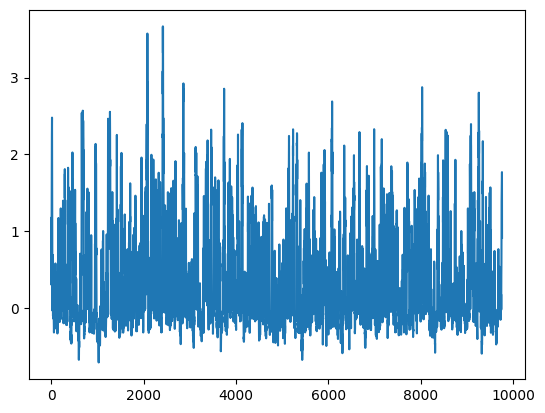

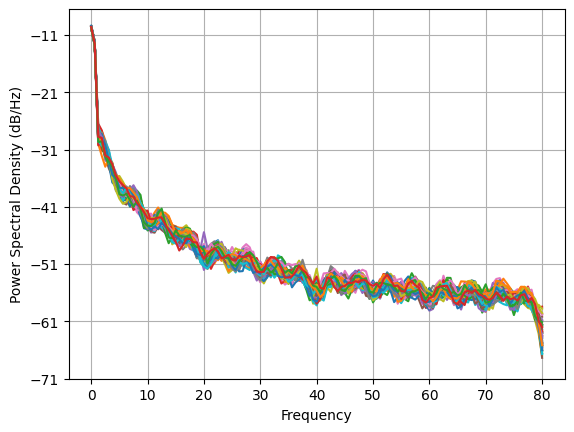

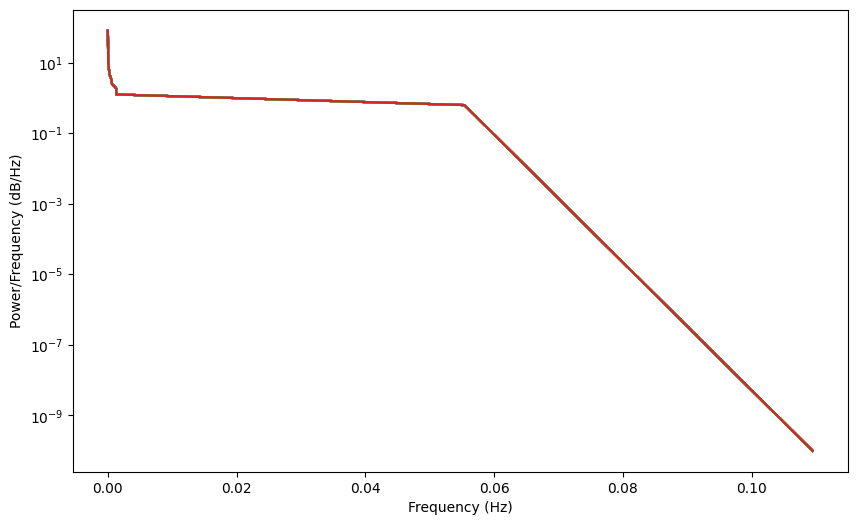

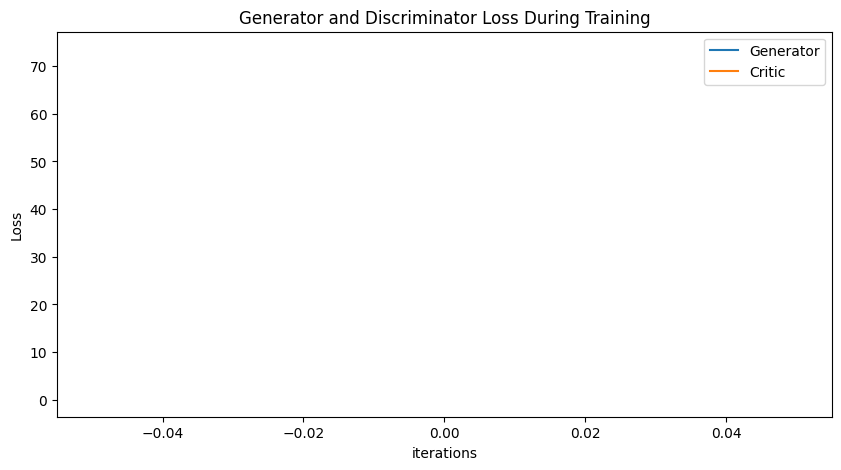

Epoch 10: Critic error ([73.54384779965307, 27.99042536814032, 14.669816943430959, 9.118903009491838, 7.090102600583151, 5.033995372450587, 4.238835072284883, 3.2945935495688103, 2.9770157069855214, 2.5232946649011248, 2.3566782167999563]) Generator err ([0.11666268110275269, 0.08961224555969238, 0.03910519555211067, 0.016156986355781555, 0.040084969252347946, 0.03113536722958088, 0.004884047899395227, -0.0886598601937294, -0.1202068105340004, -0.1702653020620346, -0.20367522537708282])


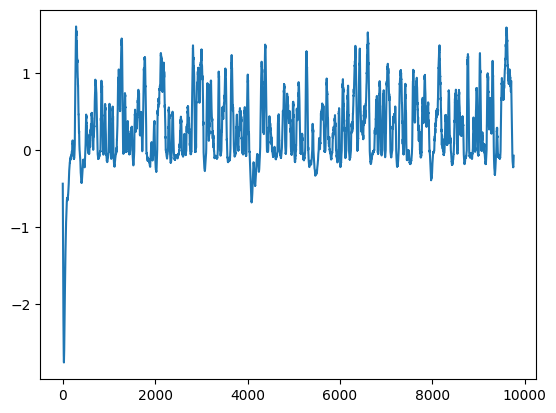

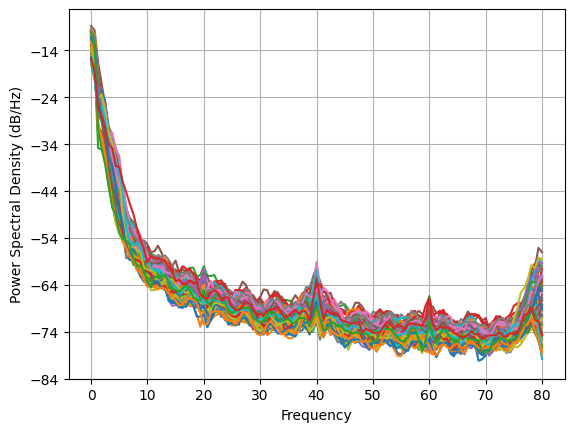

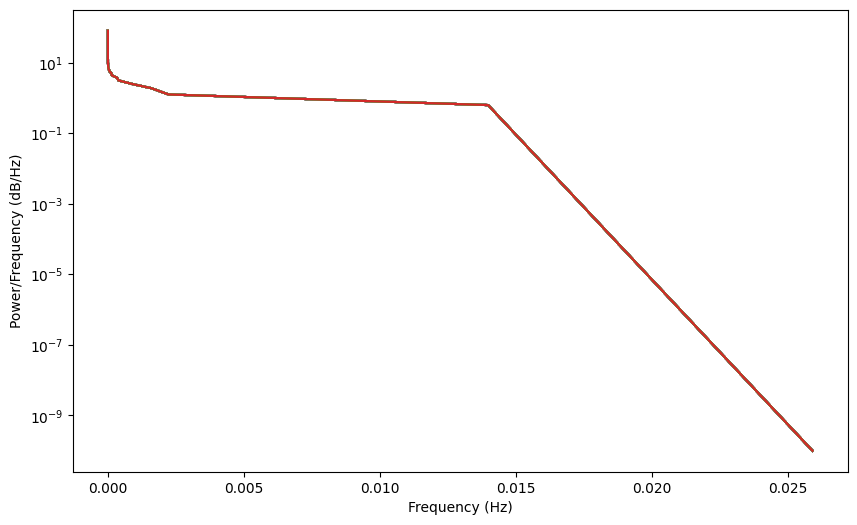

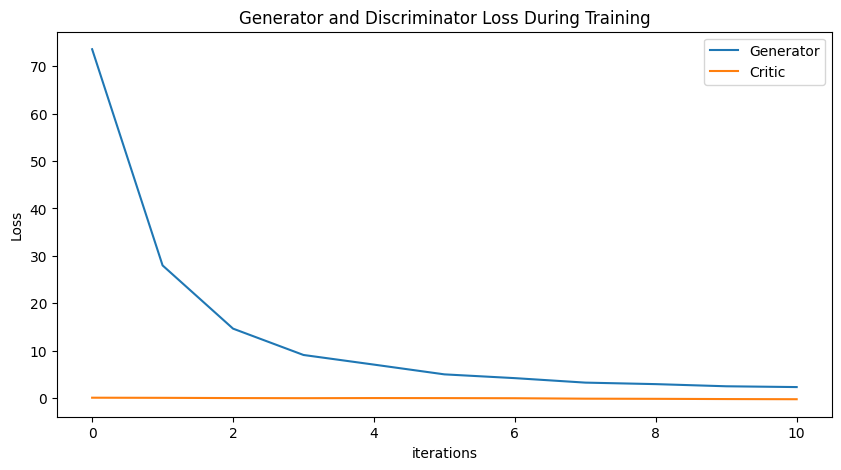

Epoch 20: Critic error ([73.54384779965307, 27.99042536814032, 14.669816943430959, 9.118903009491838, 7.090102600583151, 5.033995372450587, 4.238835072284883, 3.2945935495688103, 2.9770157069855214, 2.5232946649011248, 2.3566782167999563, 2.0921460478593135, 1.782972704409287, 1.5806927115863765, 1.3082385697706376, 1.2117958854801076, 0.9796856516866428, 0.9622493863987374, 0.7864034702489326, 0.7940883761254203, 0.7134804087652136]) Generator err ([0.11666268110275269, 0.08961224555969238, 0.03910519555211067, 0.016156986355781555, 0.040084969252347946, 0.03113536722958088, 0.004884047899395227, -0.0886598601937294, -0.1202068105340004, -0.1702653020620346, -0.20367522537708282, -0.21193140745162964, -0.1862376183271408, -0.13531959056854248, -0.1254504919052124, -0.1564965844154358, -0.15946538746356964, -0.14804525673389435, -0.12313961982727051, -0.1487758606672287, -0.13949549198150635])


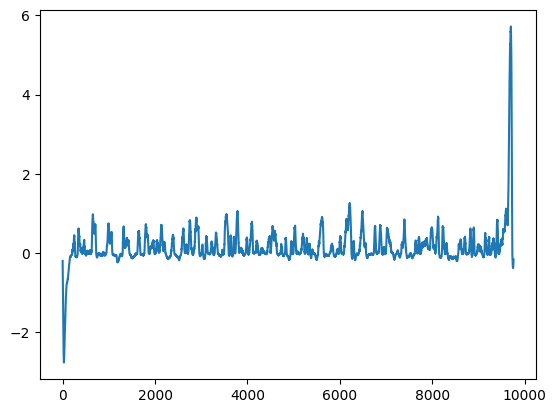

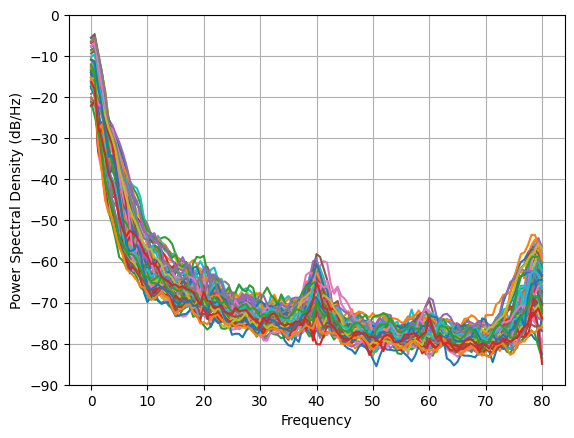

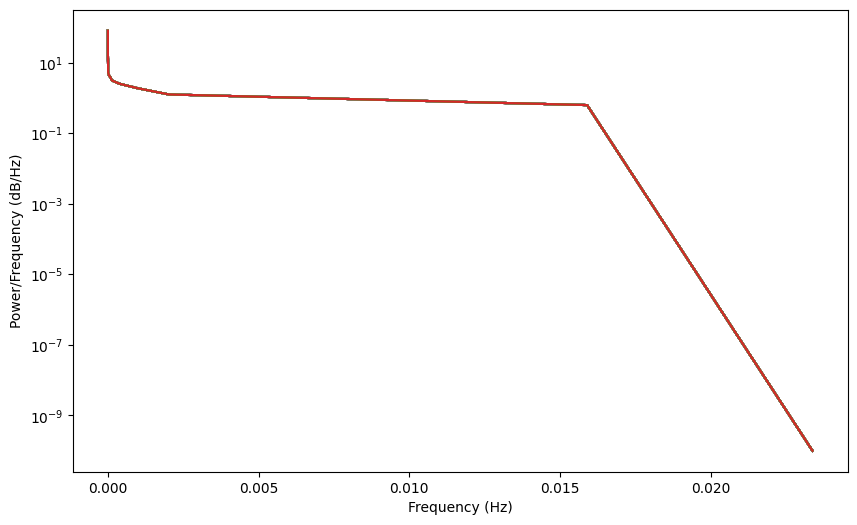

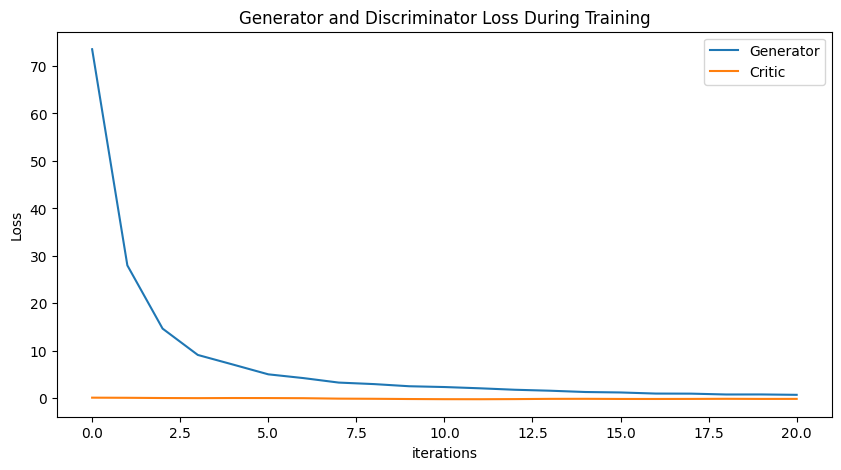

Epoch 30: Critic error ([73.54384779965307, 27.99042536814032, 14.669816943430959, 9.118903009491838, 7.090102600583151, 5.033995372450587, 4.238835072284883, 3.2945935495688103, 2.9770157069855214, 2.5232946649011248, 2.3566782167999563, 2.0921460478593135, 1.782972704409287, 1.5806927115863765, 1.3082385697706376, 1.2117958854801076, 0.9796856516866428, 0.9622493863987374, 0.7864034702489326, 0.7940883761254203, 0.7134804087652136, 0.6217534749214695, 0.48275530071124684, 0.4021353334514506, 0.2786442005876343, 0.25649907799982913, 0.23877460252225557, 0.16189934658332164, 0.15510056308172737, 0.12991905541095322, 0.09837379675780855]) Generator err ([0.11666268110275269, 0.08961224555969238, 0.03910519555211067, 0.016156986355781555, 0.040084969252347946, 0.03113536722958088, 0.004884047899395227, -0.0886598601937294, -0.1202068105340004, -0.1702653020620346, -0.20367522537708282, -0.21193140745162964, -0.1862376183271408, -0.13531959056854248, -0.1254504919052124, -0.15649658441543

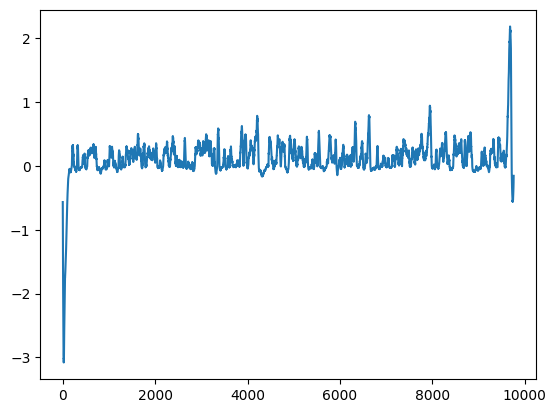

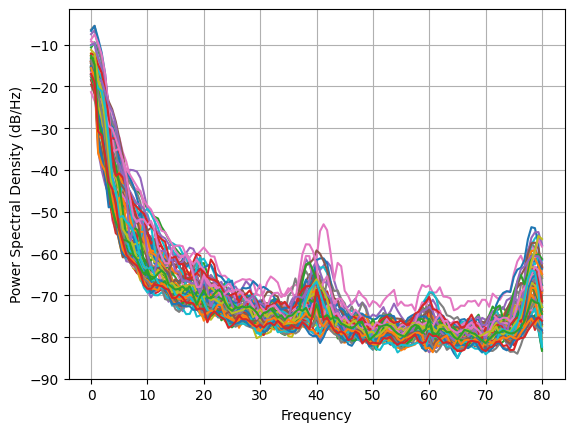

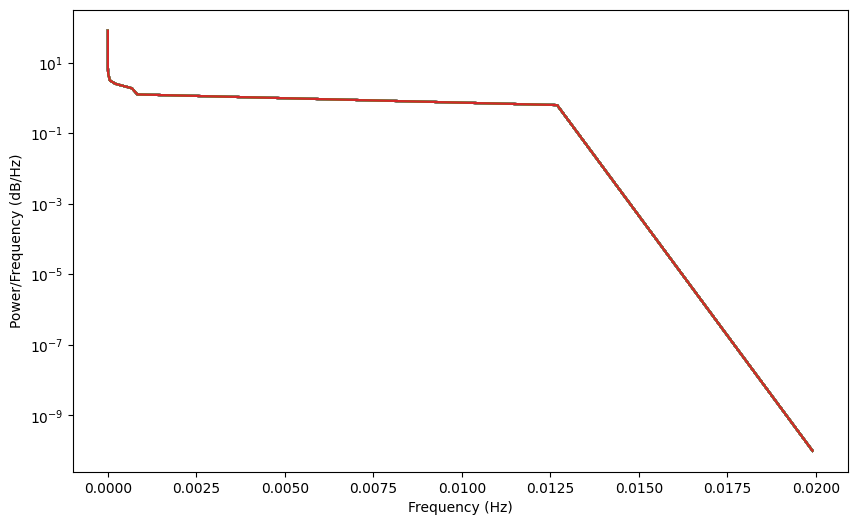

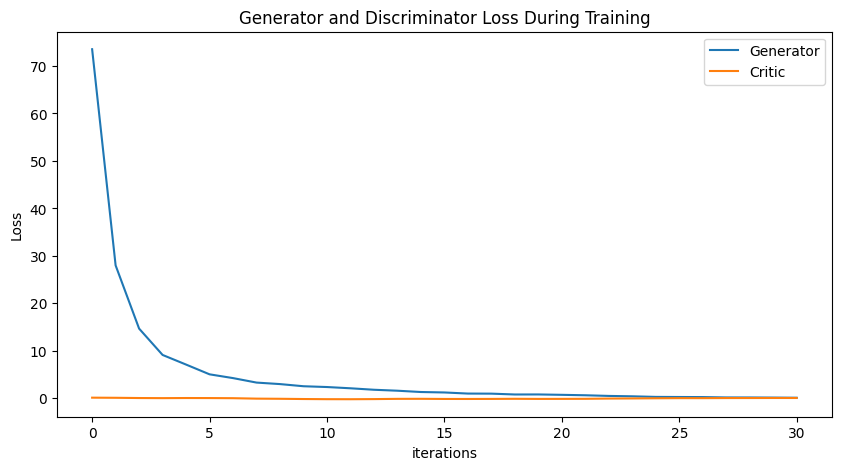

Epoch 40: Critic error ([73.54384779965307, 27.99042536814032, 14.669816943430959, 9.118903009491838, 7.090102600583151, 5.033995372450587, 4.238835072284883, 3.2945935495688103, 2.9770157069855214, 2.5232946649011248, 2.3566782167999563, 2.0921460478593135, 1.782972704409287, 1.5806927115863765, 1.3082385697706376, 1.2117958854801076, 0.9796856516866428, 0.9622493863987374, 0.7864034702489326, 0.7940883761254203, 0.7134804087652136, 0.6217534749214695, 0.48275530071124684, 0.4021353334514506, 0.2786442005876343, 0.25649907799982913, 0.23877460252225557, 0.16189934658332164, 0.15510056308172737, 0.12991905541095322, 0.09837379675780855, 0.07994264647262311, 0.05844618958702255, 0.036898252552935024, 0.03744062234545395, 0.02407201495896158, -0.00648717322245404, -0.017669446741575695, -0.03958009773139674, -0.045016953925416284, -0.05287943018915721]) Generator err ([0.11666268110275269, 0.08961224555969238, 0.03910519555211067, 0.016156986355781555, 0.040084969252347946, 0.03113536722

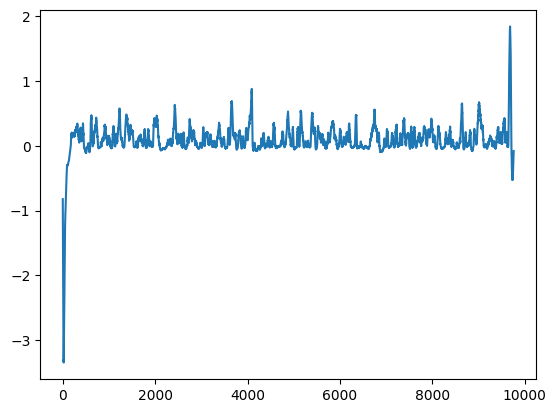

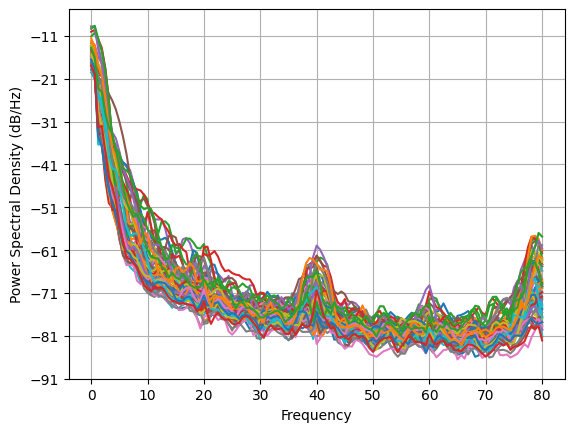

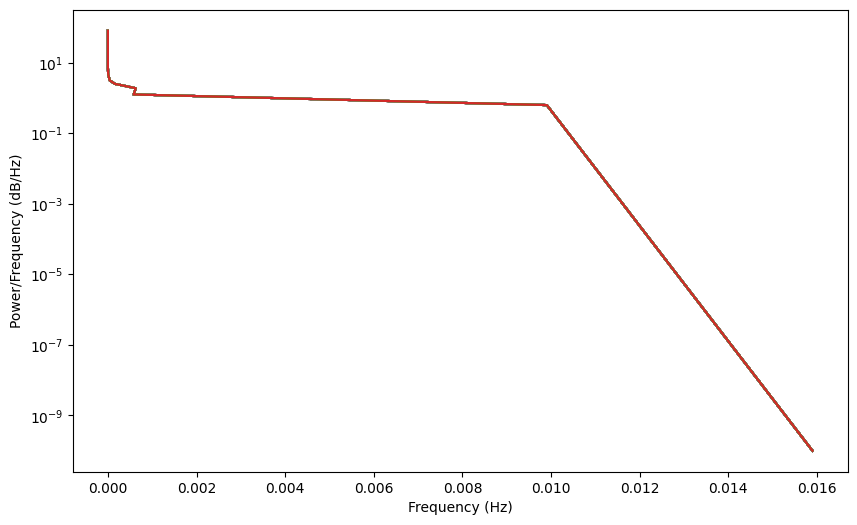

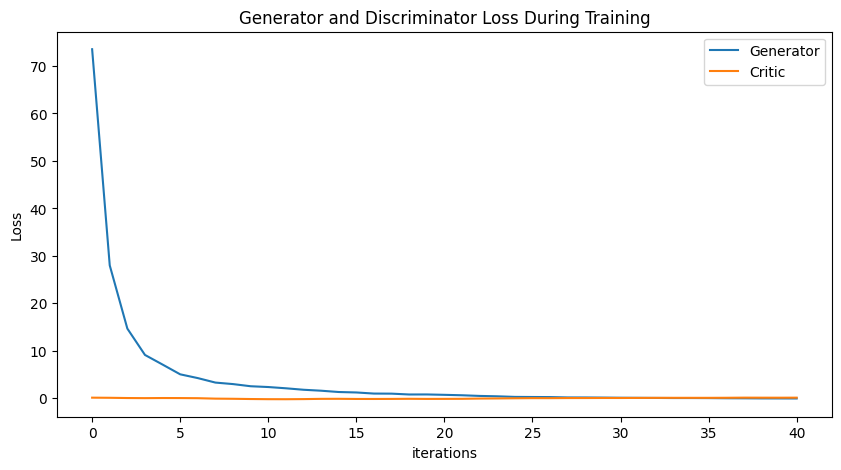

Epoch 50: Critic error ([73.54384779965307, 27.99042536814032, 14.669816943430959, 9.118903009491838, 7.090102600583151, 5.033995372450587, 4.238835072284883, 3.2945935495688103, 2.9770157069855214, 2.5232946649011248, 2.3566782167999563, 2.0921460478593135, 1.782972704409287, 1.5806927115863765, 1.3082385697706376, 1.2117958854801076, 0.9796856516866428, 0.9622493863987374, 0.7864034702489326, 0.7940883761254203, 0.7134804087652136, 0.6217534749214695, 0.48275530071124684, 0.4021353334514506, 0.2786442005876343, 0.25649907799982913, 0.23877460252225557, 0.16189934658332164, 0.15510056308172737, 0.12991905541095322, 0.09837379675780855, 0.07994264647262311, 0.05844618958702255, 0.036898252552935024, 0.03744062234545395, 0.02407201495896158, -0.00648717322245404, -0.017669446741575695, -0.03958009773139674, -0.045016953925416284, -0.05287943018915721, -0.05758588332397099, -0.07960472133140982, -0.08663900327936838, -0.09372542468053786, -0.09953295659668292, -0.11984791585401083, -0.11

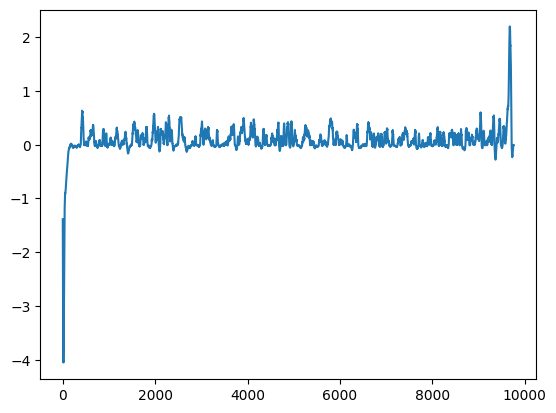

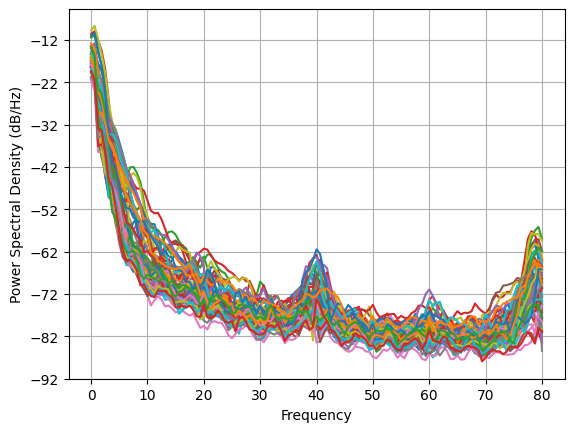

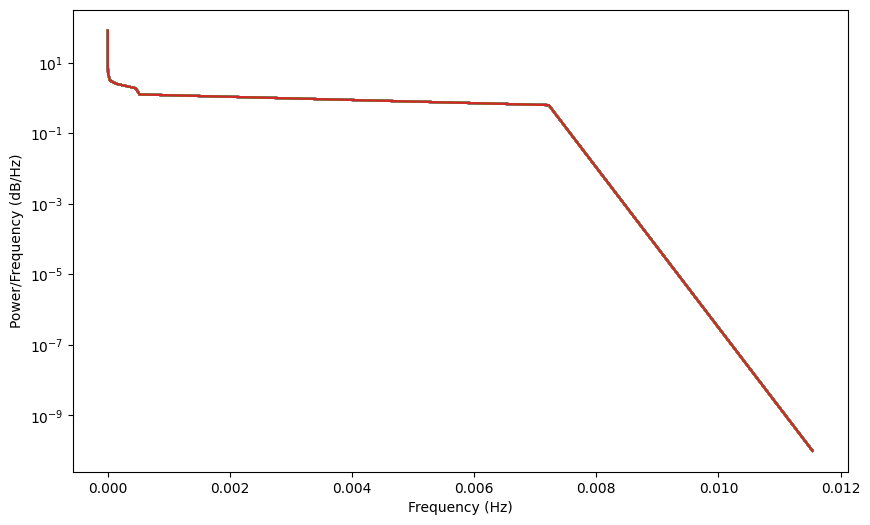

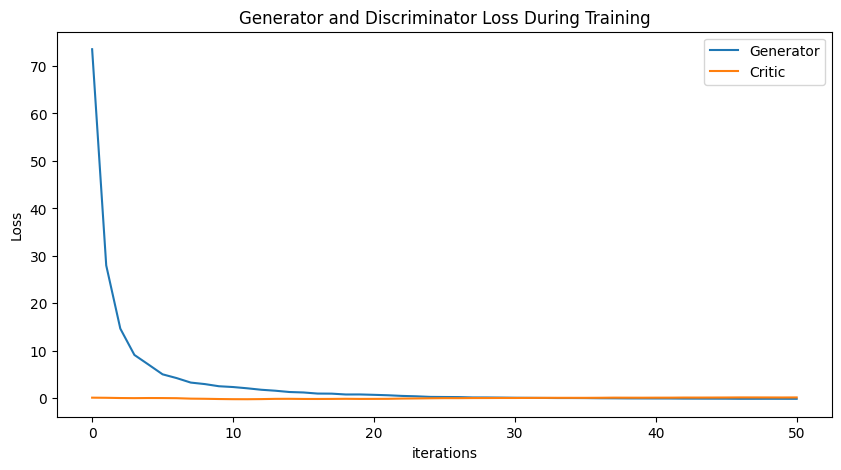

In [ ]:
NUM_EPOCHS = 100
PRINT_INTERVAL = 10
training_data = torch.tensor(np.load('training_closed.npy'))
BATCH_SIZE = np.shape(training_data)[0]

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(640, 640, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(640, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(640, 640, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(640, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(640, 640, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(640, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(640, 640, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(640, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(640, 640, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(640, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(640, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 640, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(640, 640, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(640, 640, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(640, 640, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(640, 640, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(640, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for _ in range(5):
            real = training_data.clone().detach()
            real.requires_grad=True
            critic_real = D(real).reshape(-1)
            loss_critic_real = -torch.mean(critic_real)
            noise = sample_normal_distribution(BATCH_SIZE, 640, 305)
            fake = G(noise)
            critic_fake = D(fake).reshape(-1)
            loss_critic_fake = torch.mean(critic_fake)
            gp = gradient_penalty(D, real, fake) * LAMBDA_GP
            D.zero_grad()
            loss_critic = loss_critic_real + loss_critic_fake + gp
            loss_critic.backward()
            critic_optimizer.step()  

        noise = sample_normal_distribution(BATCH_SIZE, 640, 305)
        fake = G(noise)
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()
        
        critic_err.append(loss_critic.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(fake, critic_err, gen_err)

    return critic_err, gen_err, fake, D, G

critic_err, gen_err, generated_data_closed, disc, gen = train()

torch.save(gen, 'generator_eyes_closed.pt')
torch.save(disc, 'discriminator_eyes_closed.pt')
np.save('640channels-closed.npy', generated_data_closed.detach())
plot_everything(generated_data_closed, gen_err, critic_err)
generated_data_closed = None

In [ ]:
NUM_EPOCHS = 100
PRINT_INTERVAL = 10
training_data = torch.tensor(np.load('training_open.npy'))
BATCH_SIZE = np.shape(training_data)[0]

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(640, 640, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(640, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(640, 640, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(640, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(640, 640, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(640, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(640, 640, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(640, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(640, 640, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(640, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(640, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 640, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(640, 640, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(640, 640, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(640, 640, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(640, 640, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(640, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for _ in range(5):
            real = training_data.clone().detach()
            real.requires_grad=True
            critic_real = D(real).reshape(-1)
            loss_critic_real = -torch.mean(critic_real)
            noise = sample_normal_distribution(BATCH_SIZE, 640, 305)
            fake = G(noise)
            critic_fake = D(fake).reshape(-1)
            loss_critic_fake = torch.mean(critic_fake)
            gp = gradient_penalty(D, real, fake) * LAMBDA_GP
            D.zero_grad()
            loss_critic = loss_critic_real + loss_critic_fake + gp
            loss_critic.backward()
            critic_optimizer.step()  

        noise = sample_normal_distribution(BATCH_SIZE, 640, 305)
        fake = G(noise)
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()
        
        critic_err.append(loss_critic.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(fake, critic_err, gen_err)

    return critic_err, gen_err, fake, D, G

critic_err, gen_err, generated_data_open, disc, gen = train()

torch.save(gen, 'generator_eyes_open.pt')
torch.save(disc, 'discriminator_eyes_open.pt')
np.save('640channels-open.npy', generated_data_open.detach())
plot_everything(generated_data_open, gen_err, critic_err)
generated_data_open = None

# 64

Epoch 0: Critic error ([2.1653090118250926]) Generator err ([0.059262458235025406])


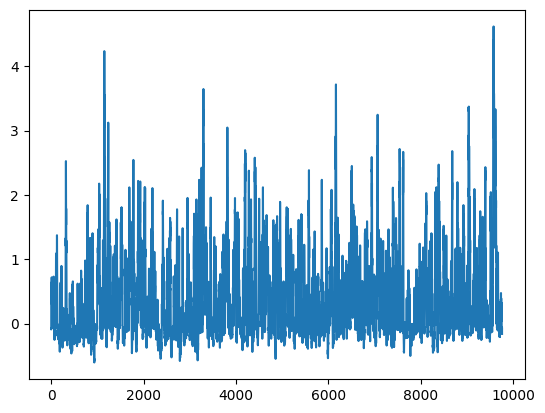

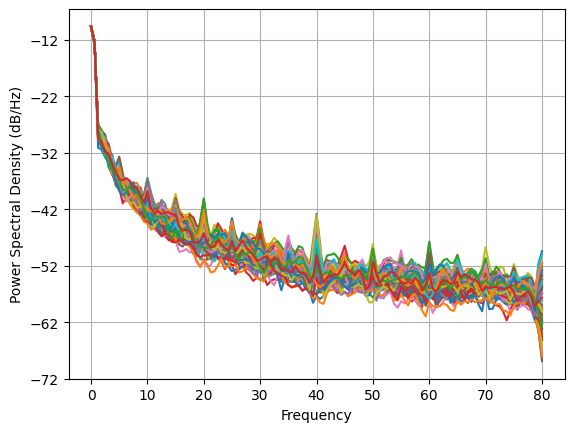

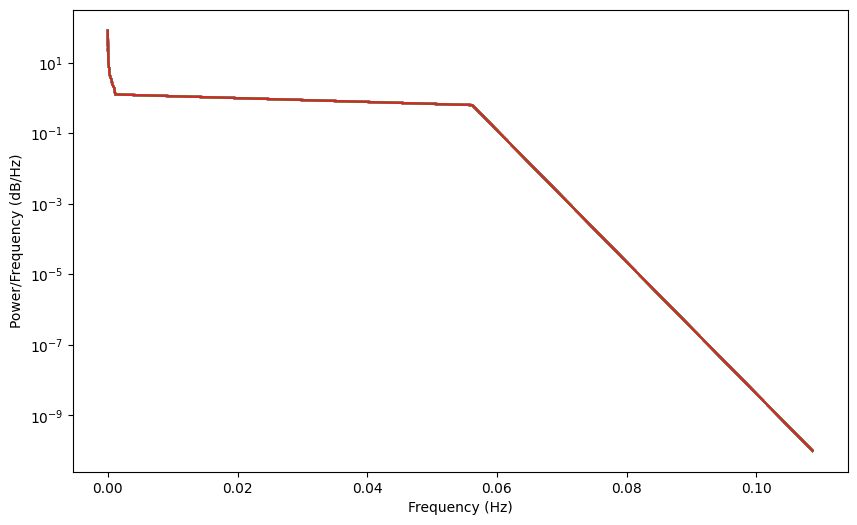

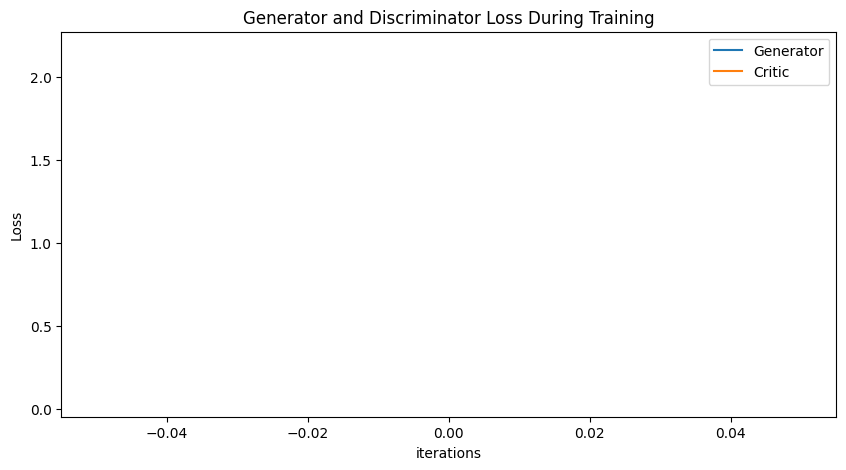

Epoch 10: Critic error ([2.1653090118250926, 0.848054814420109, -0.03122536261654779, 0.021337683512467065, 0.10689249840555728, 0.010739147521167718, 0.034990401604536855, 0.027346114556381806, 0.012173308584970968, -0.0013397167801042636, -0.00537713716727406]) Generator err ([0.059262458235025406, 0.09765824675559998, 0.15177865326404572, 0.08891758322715759, 0.11118204891681671, 0.10376912355422974, 0.09319692850112915, 0.10426177829504013, 0.10357248038053513, 0.1099456250667572, 0.13058987259864807])


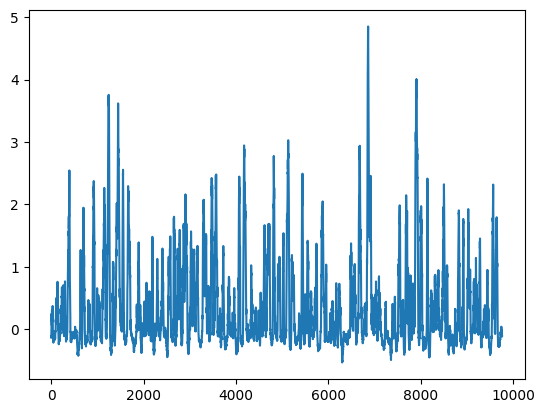

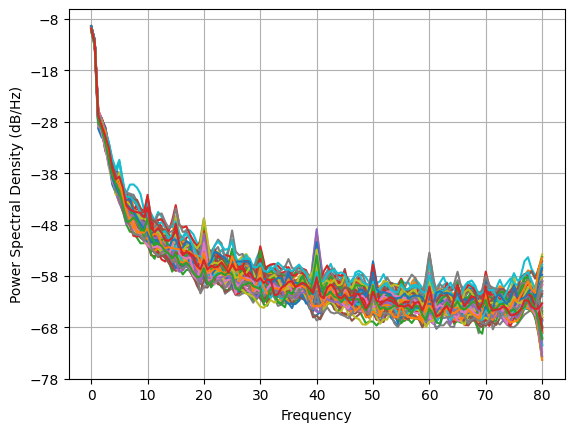

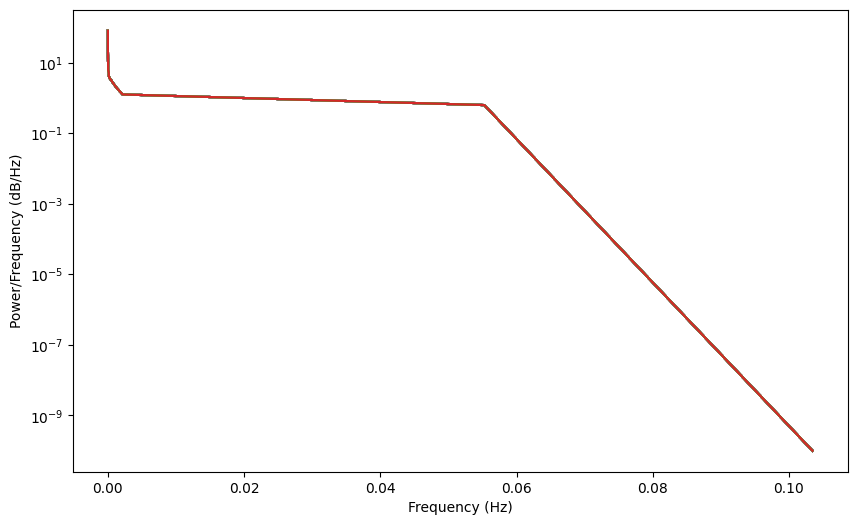

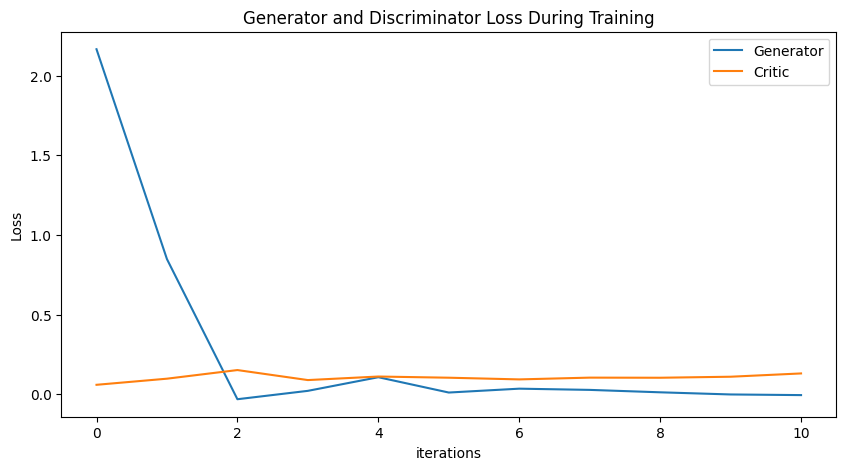

Epoch 20: Critic error ([2.1653090118250926, 0.848054814420109, -0.03122536261654779, 0.021337683512467065, 0.10689249840555728, 0.010739147521167718, 0.034990401604536855, 0.027346114556381806, 0.012173308584970968, -0.0013397167801042636, -0.00537713716727406, -0.005068415732135817, -0.05139284405939254, -0.04782439955823192, -0.29588469167772286, -0.6265817633375028, -0.5533665850221869, -0.5732876225110256, -2.250559580567505, -2.9343463788520845, -2.4698974322174667]) Generator err ([0.059262458235025406, 0.09765824675559998, 0.15177865326404572, 0.08891758322715759, 0.11118204891681671, 0.10376912355422974, 0.09319692850112915, 0.10426177829504013, 0.10357248038053513, 0.1099456250667572, 0.13058987259864807, 0.14045411348342896, 0.1700589507818222, 0.23494790494441986, 0.4839456379413605, 0.7385291457176208, 1.8353781700134277, 2.4419078826904297, 4.289391994476318, 3.174010992050171, 4.910979747772217])


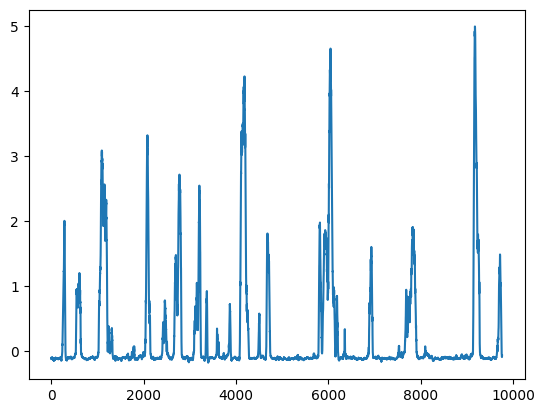

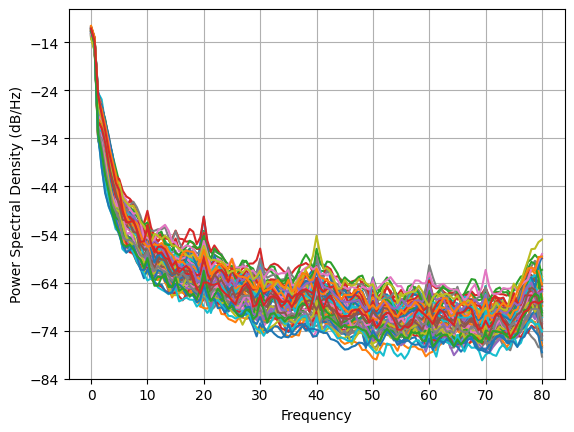

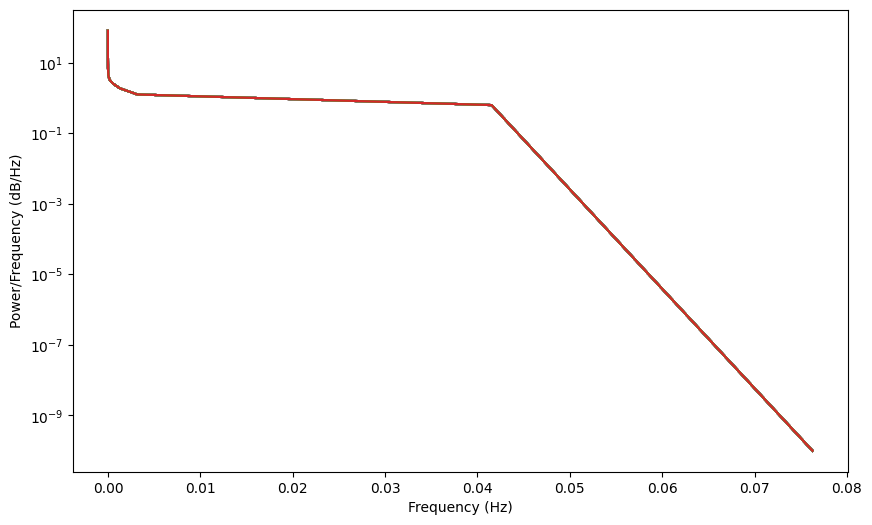

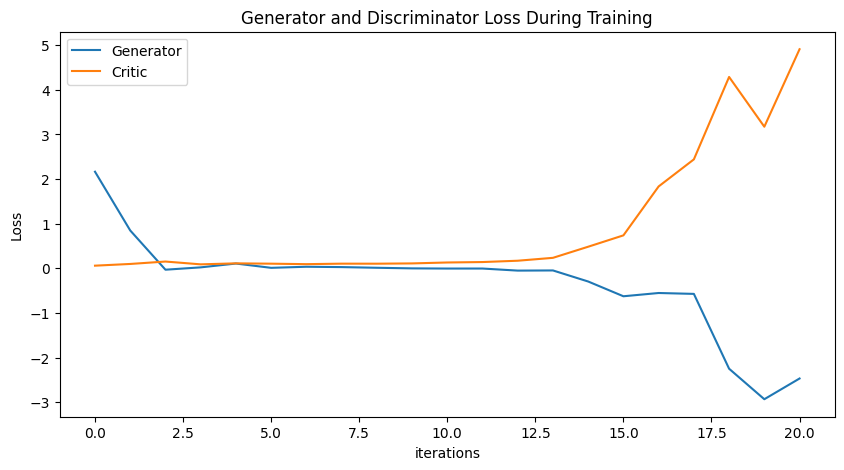

Epoch 30: Critic error ([2.1653090118250926, 0.848054814420109, -0.03122536261654779, 0.021337683512467065, 0.10689249840555728, 0.010739147521167718, 0.034990401604536855, 0.027346114556381806, 0.012173308584970968, -0.0013397167801042636, -0.00537713716727406, -0.005068415732135817, -0.05139284405939254, -0.04782439955823192, -0.29588469167772286, -0.6265817633375028, -0.5533665850221869, -0.5732876225110256, -2.250559580567505, -2.9343463788520845, -2.4698974322174667, -3.424265529665628, -3.382235172395267, -4.005993686020752, -3.437557224009572, -3.908029672290497, -3.2553770000016793, -4.717191660362704, -4.856212448822772, -4.059257254324113, -4.098915528055015]) Generator err ([0.059262458235025406, 0.09765824675559998, 0.15177865326404572, 0.08891758322715759, 0.11118204891681671, 0.10376912355422974, 0.09319692850112915, 0.10426177829504013, 0.10357248038053513, 0.1099456250667572, 0.13058987259864807, 0.14045411348342896, 0.1700589507818222, 0.23494790494441986, 0.4839456379

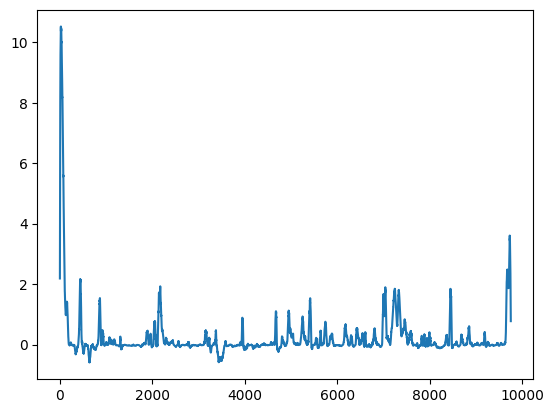

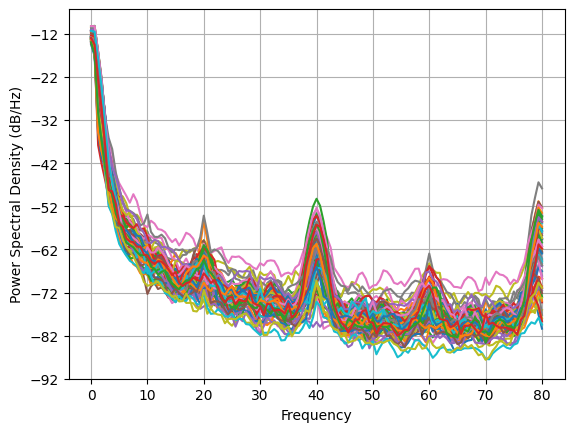

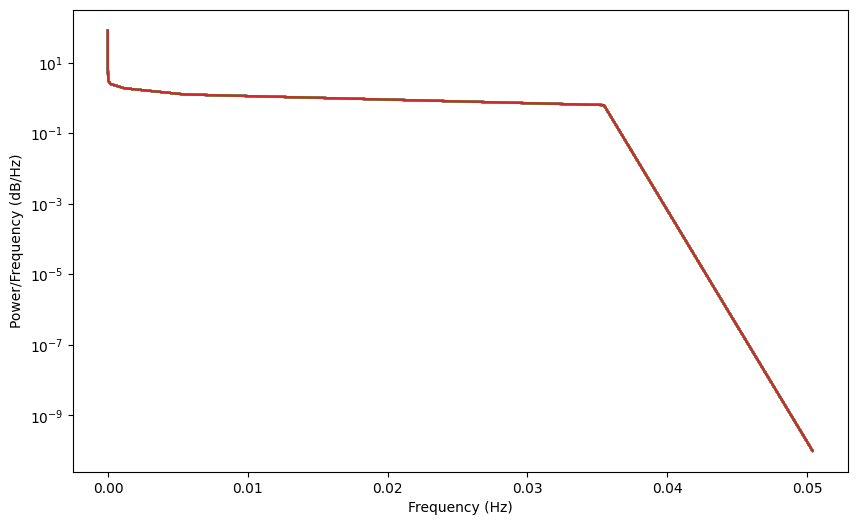

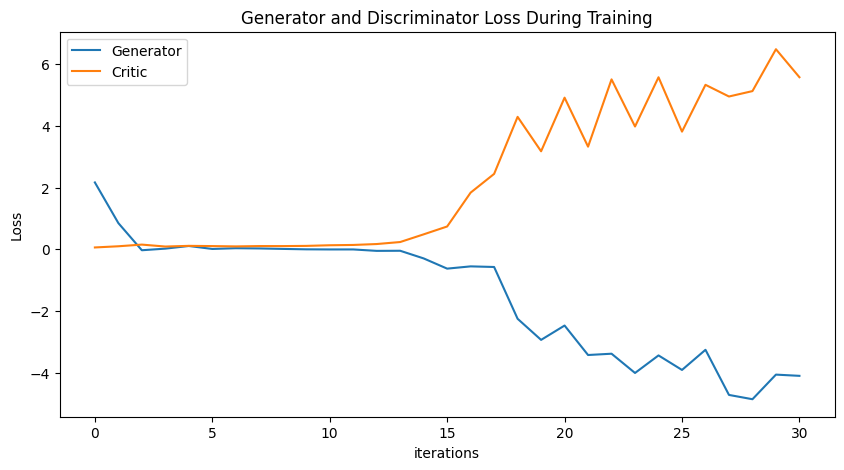

Epoch 40: Critic error ([2.1653090118250926, 0.848054814420109, -0.03122536261654779, 0.021337683512467065, 0.10689249840555728, 0.010739147521167718, 0.034990401604536855, 0.027346114556381806, 0.012173308584970968, -0.0013397167801042636, -0.00537713716727406, -0.005068415732135817, -0.05139284405939254, -0.04782439955823192, -0.29588469167772286, -0.6265817633375028, -0.5533665850221869, -0.5732876225110256, -2.250559580567505, -2.9343463788520845, -2.4698974322174667, -3.424265529665628, -3.382235172395267, -4.005993686020752, -3.437557224009572, -3.908029672290497, -3.2553770000016793, -4.717191660362704, -4.856212448822772, -4.059257254324113, -4.098915528055015, -4.540395889523092, -4.322609491240625, -5.193006801384304, -3.379351663036269, -3.8202465174893625, -4.564678637276217, -5.643121827803018, -4.104231094131238, -3.479724733013974, -3.4574815544329773]) Generator err ([0.059262458235025406, 0.09765824675559998, 0.15177865326404572, 0.08891758322715759, 0.1111820489168167

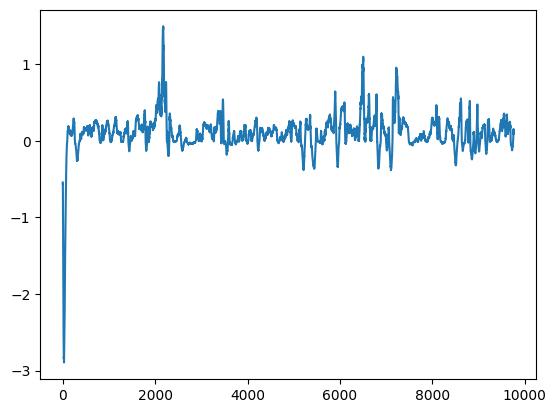

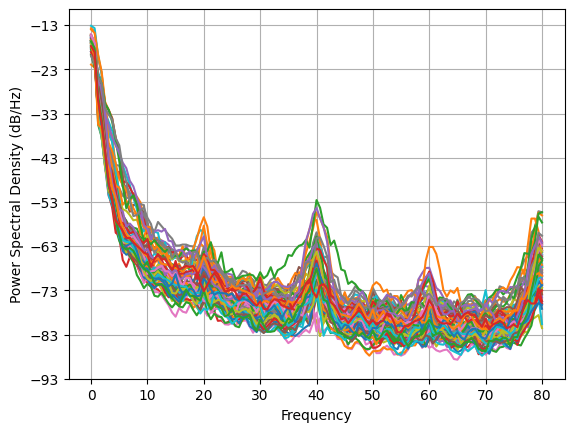

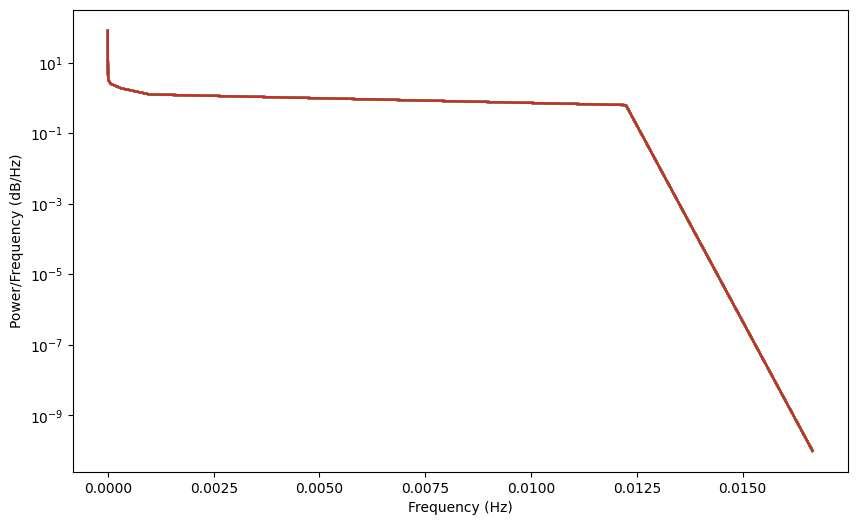

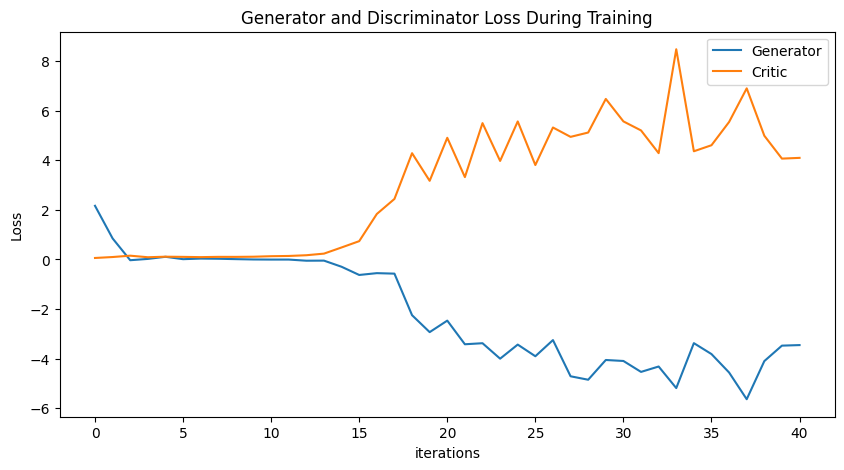

Epoch 50: Critic error ([2.1653090118250926, 0.848054814420109, -0.03122536261654779, 0.021337683512467065, 0.10689249840555728, 0.010739147521167718, 0.034990401604536855, 0.027346114556381806, 0.012173308584970968, -0.0013397167801042636, -0.00537713716727406, -0.005068415732135817, -0.05139284405939254, -0.04782439955823192, -0.29588469167772286, -0.6265817633375028, -0.5533665850221869, -0.5732876225110256, -2.250559580567505, -2.9343463788520845, -2.4698974322174667, -3.424265529665628, -3.382235172395267, -4.005993686020752, -3.437557224009572, -3.908029672290497, -3.2553770000016793, -4.717191660362704, -4.856212448822772, -4.059257254324113, -4.098915528055015, -4.540395889523092, -4.322609491240625, -5.193006801384304, -3.379351663036269, -3.8202465174893625, -4.564678637276217, -5.643121827803018, -4.104231094131238, -3.479724733013974, -3.4574815544329773, -3.270884586361056, -3.12433929580815, -3.0755505224855493, -3.0814440723098913, -2.8743722316974445, -2.56395423606305,

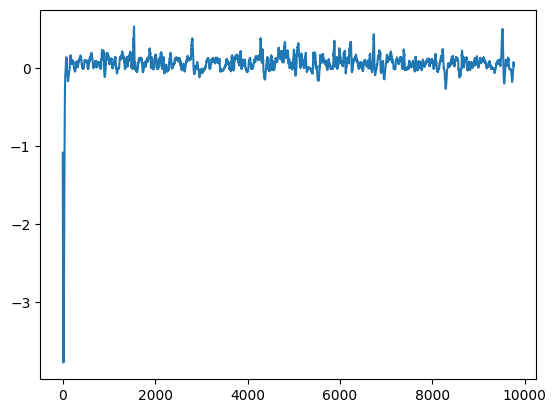

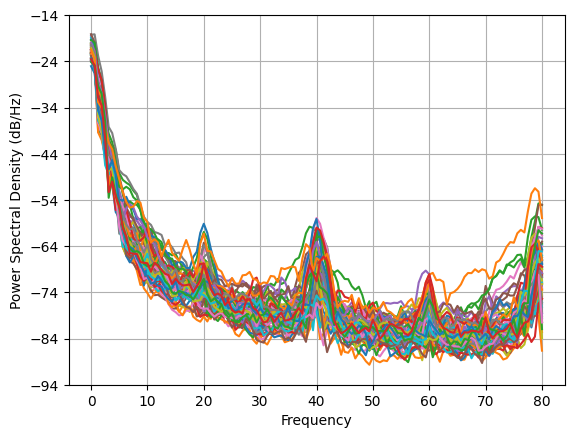

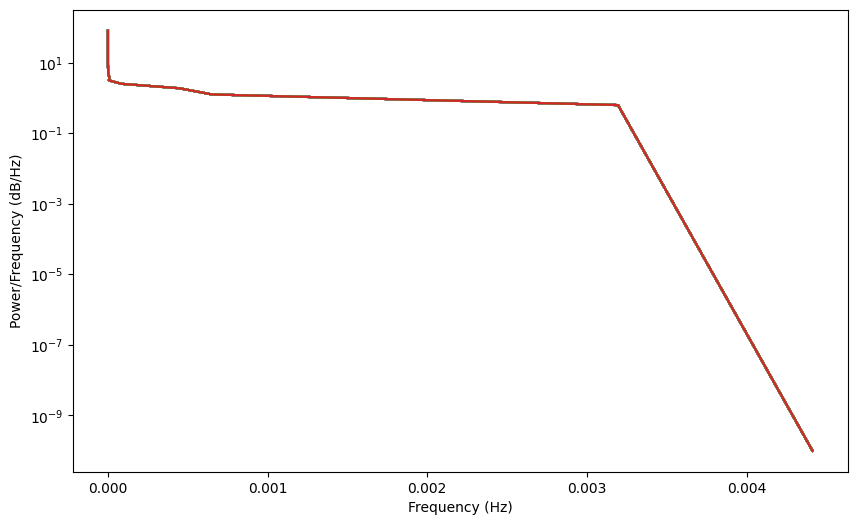

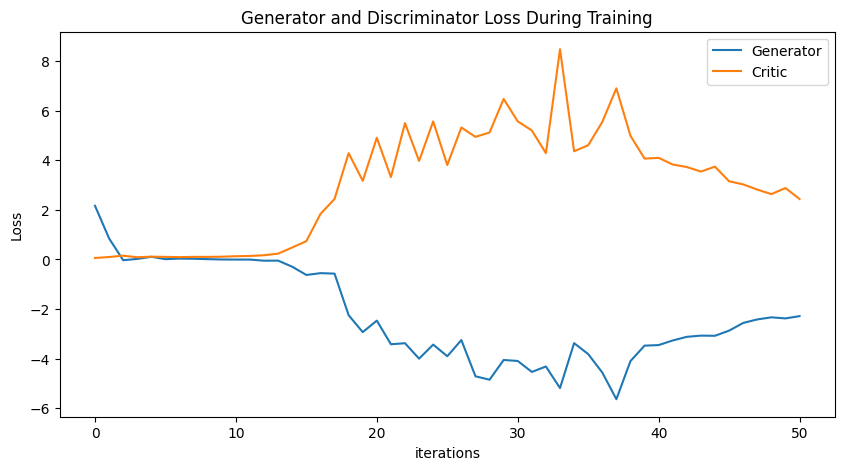

Epoch 60: Critic error ([2.1653090118250926, 0.848054814420109, -0.03122536261654779, 0.021337683512467065, 0.10689249840555728, 0.010739147521167718, 0.034990401604536855, 0.027346114556381806, 0.012173308584970968, -0.0013397167801042636, -0.00537713716727406, -0.005068415732135817, -0.05139284405939254, -0.04782439955823192, -0.29588469167772286, -0.6265817633375028, -0.5533665850221869, -0.5732876225110256, -2.250559580567505, -2.9343463788520845, -2.4698974322174667, -3.424265529665628, -3.382235172395267, -4.005993686020752, -3.437557224009572, -3.908029672290497, -3.2553770000016793, -4.717191660362704, -4.856212448822772, -4.059257254324113, -4.098915528055015, -4.540395889523092, -4.322609491240625, -5.193006801384304, -3.379351663036269, -3.8202465174893625, -4.564678637276217, -5.643121827803018, -4.104231094131238, -3.479724733013974, -3.4574815544329773, -3.270884586361056, -3.12433929580815, -3.0755505224855493, -3.0814440723098913, -2.8743722316974445, -2.56395423606305,

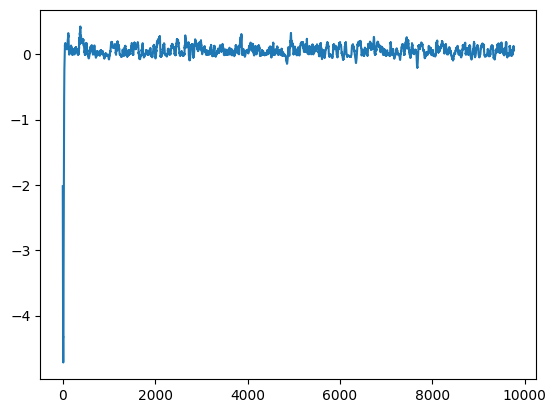

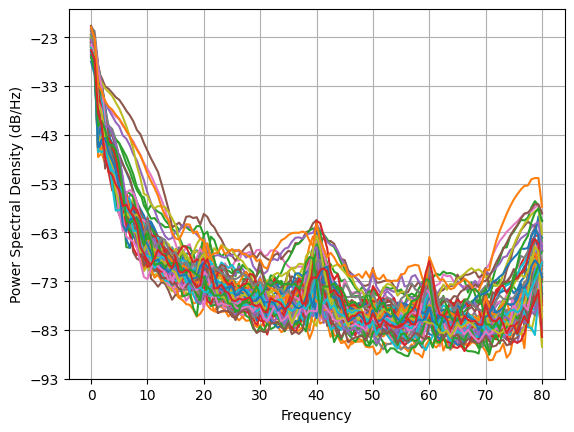

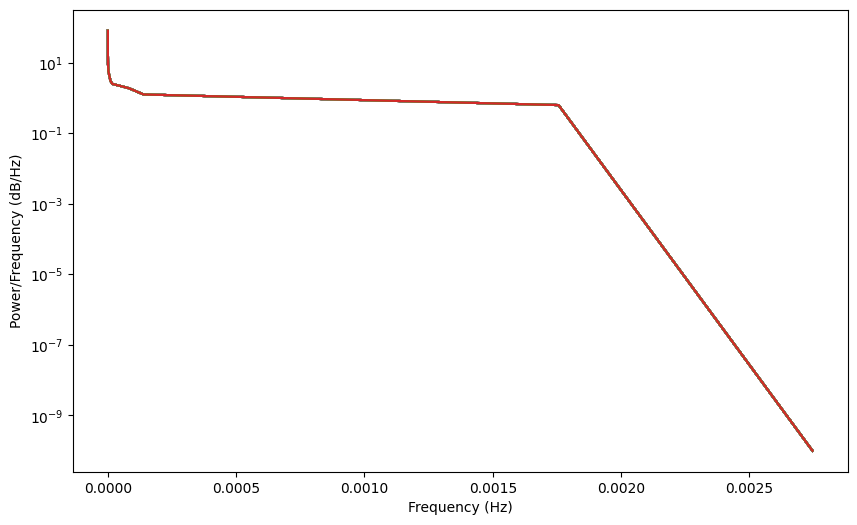

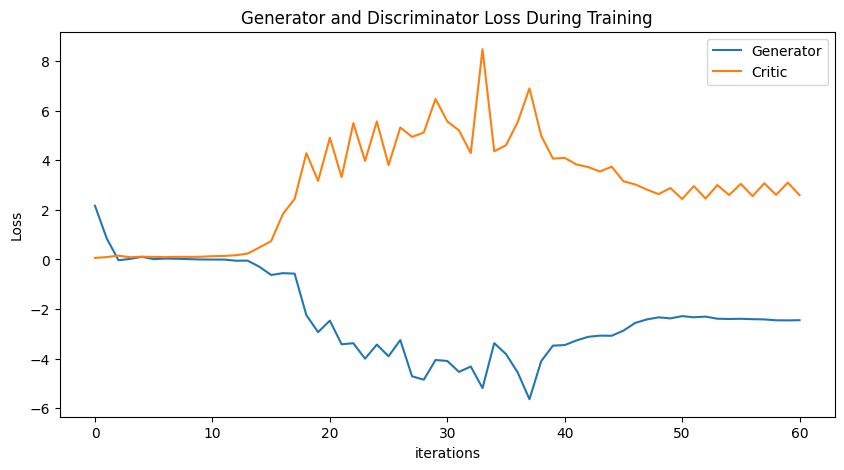

Epoch 70: Critic error ([2.1653090118250926, 0.848054814420109, -0.03122536261654779, 0.021337683512467065, 0.10689249840555728, 0.010739147521167718, 0.034990401604536855, 0.027346114556381806, 0.012173308584970968, -0.0013397167801042636, -0.00537713716727406, -0.005068415732135817, -0.05139284405939254, -0.04782439955823192, -0.29588469167772286, -0.6265817633375028, -0.5533665850221869, -0.5732876225110256, -2.250559580567505, -2.9343463788520845, -2.4698974322174667, -3.424265529665628, -3.382235172395267, -4.005993686020752, -3.437557224009572, -3.908029672290497, -3.2553770000016793, -4.717191660362704, -4.856212448822772, -4.059257254324113, -4.098915528055015, -4.540395889523092, -4.322609491240625, -5.193006801384304, -3.379351663036269, -3.8202465174893625, -4.564678637276217, -5.643121827803018, -4.104231094131238, -3.479724733013974, -3.4574815544329773, -3.270884586361056, -3.12433929580815, -3.0755505224855493, -3.0814440723098913, -2.8743722316974445, -2.56395423606305,

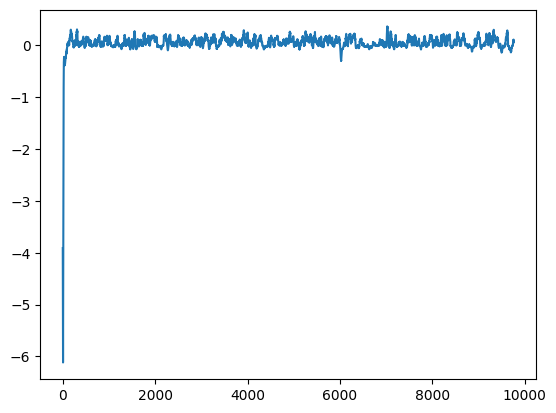

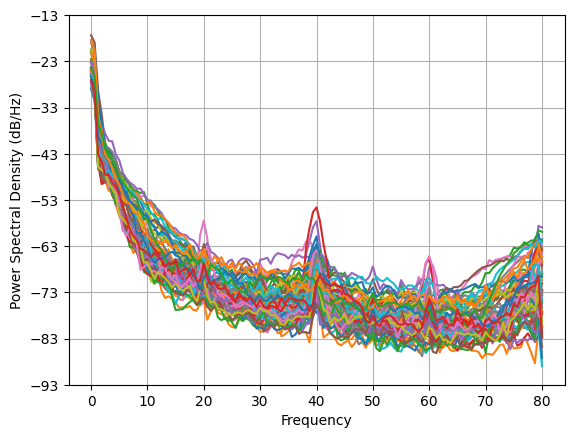

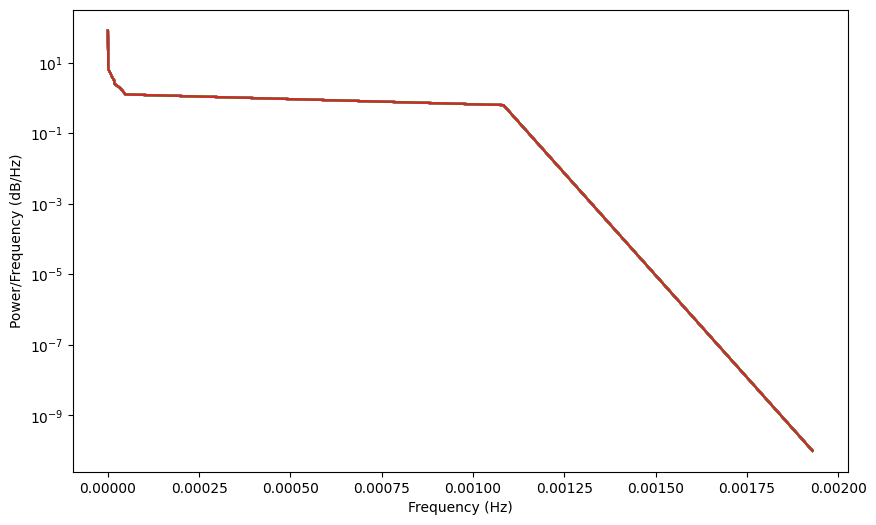

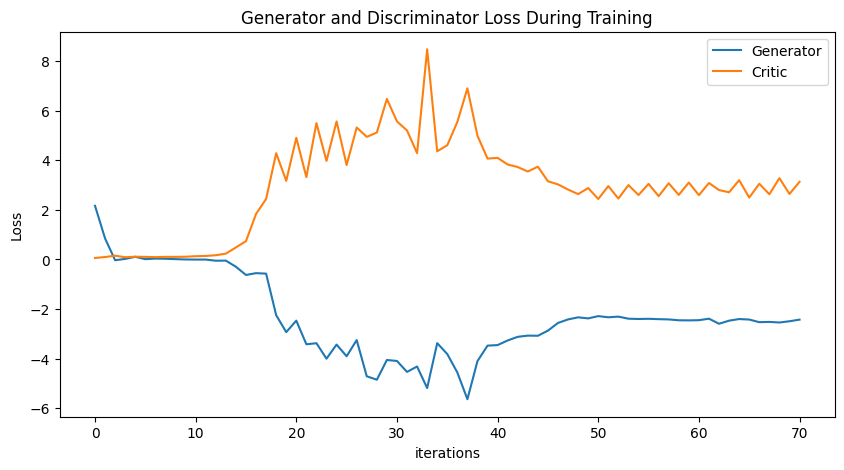

Epoch 80: Critic error ([2.1653090118250926, 0.848054814420109, -0.03122536261654779, 0.021337683512467065, 0.10689249840555728, 0.010739147521167718, 0.034990401604536855, 0.027346114556381806, 0.012173308584970968, -0.0013397167801042636, -0.00537713716727406, -0.005068415732135817, -0.05139284405939254, -0.04782439955823192, -0.29588469167772286, -0.6265817633375028, -0.5533665850221869, -0.5732876225110256, -2.250559580567505, -2.9343463788520845, -2.4698974322174667, -3.424265529665628, -3.382235172395267, -4.005993686020752, -3.437557224009572, -3.908029672290497, -3.2553770000016793, -4.717191660362704, -4.856212448822772, -4.059257254324113, -4.098915528055015, -4.540395889523092, -4.322609491240625, -5.193006801384304, -3.379351663036269, -3.8202465174893625, -4.564678637276217, -5.643121827803018, -4.104231094131238, -3.479724733013974, -3.4574815544329773, -3.270884586361056, -3.12433929580815, -3.0755505224855493, -3.0814440723098913, -2.8743722316974445, -2.56395423606305,

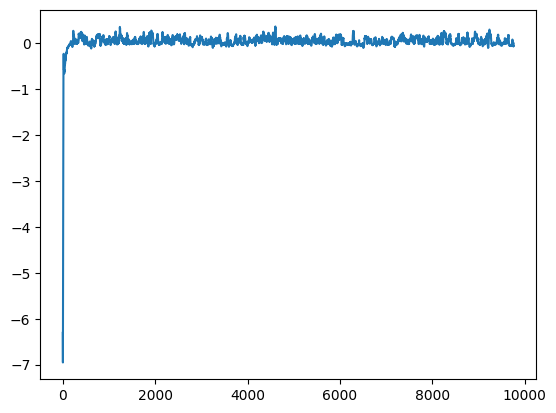

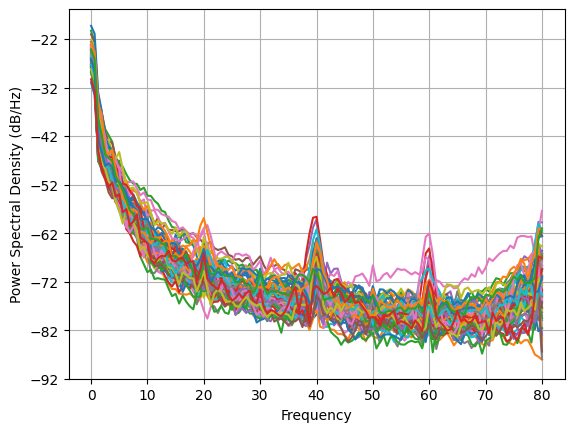

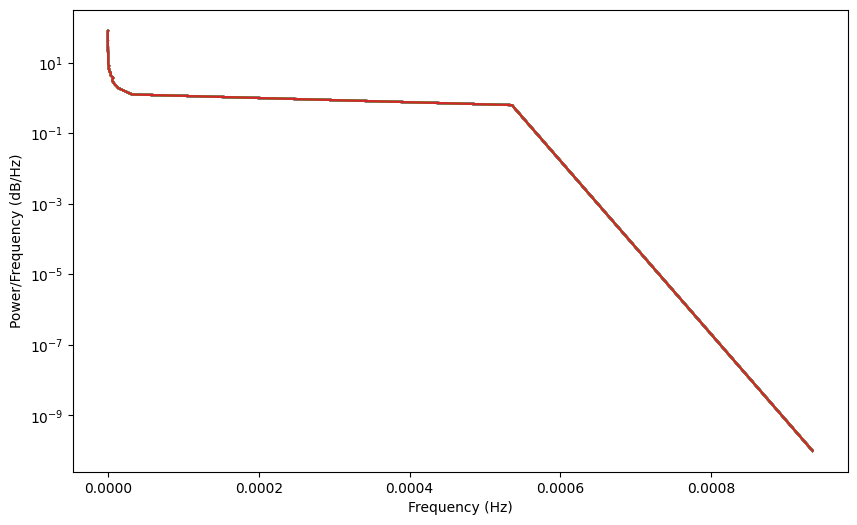

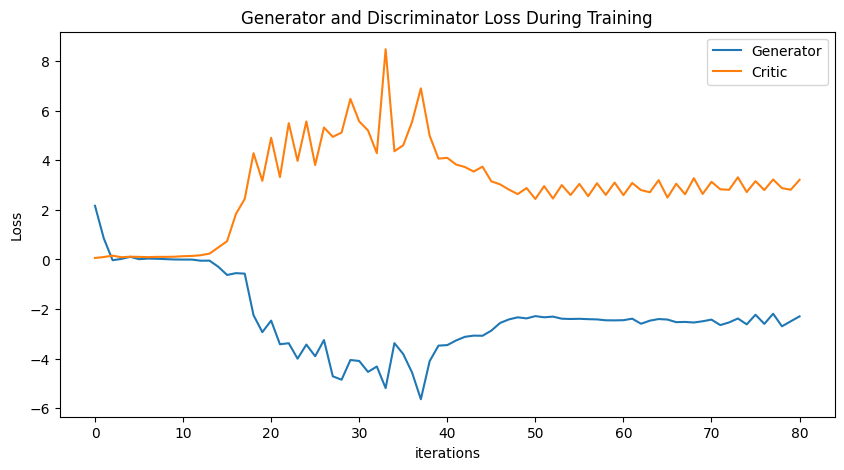

Epoch 90: Critic error ([2.1653090118250926, 0.848054814420109, -0.03122536261654779, 0.021337683512467065, 0.10689249840555728, 0.010739147521167718, 0.034990401604536855, 0.027346114556381806, 0.012173308584970968, -0.0013397167801042636, -0.00537713716727406, -0.005068415732135817, -0.05139284405939254, -0.04782439955823192, -0.29588469167772286, -0.6265817633375028, -0.5533665850221869, -0.5732876225110256, -2.250559580567505, -2.9343463788520845, -2.4698974322174667, -3.424265529665628, -3.382235172395267, -4.005993686020752, -3.437557224009572, -3.908029672290497, -3.2553770000016793, -4.717191660362704, -4.856212448822772, -4.059257254324113, -4.098915528055015, -4.540395889523092, -4.322609491240625, -5.193006801384304, -3.379351663036269, -3.8202465174893625, -4.564678637276217, -5.643121827803018, -4.104231094131238, -3.479724733013974, -3.4574815544329773, -3.270884586361056, -3.12433929580815, -3.0755505224855493, -3.0814440723098913, -2.8743722316974445, -2.56395423606305,

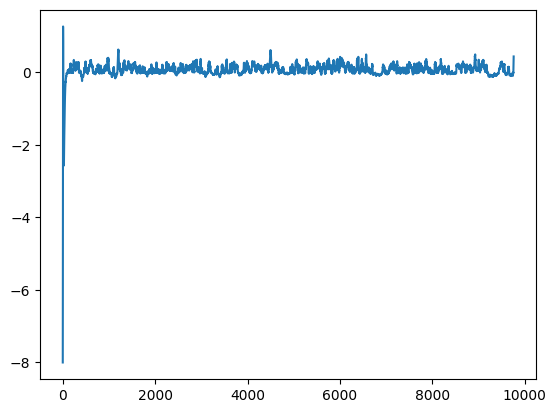

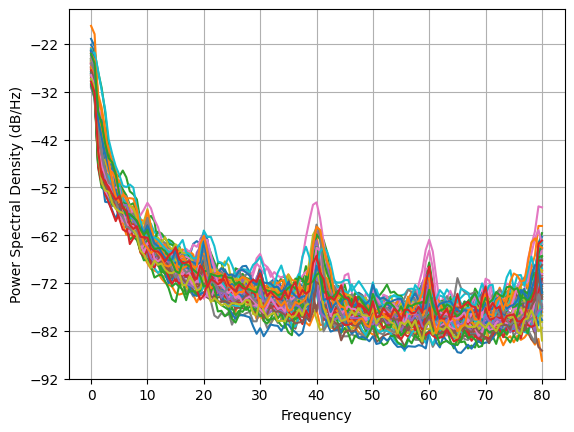

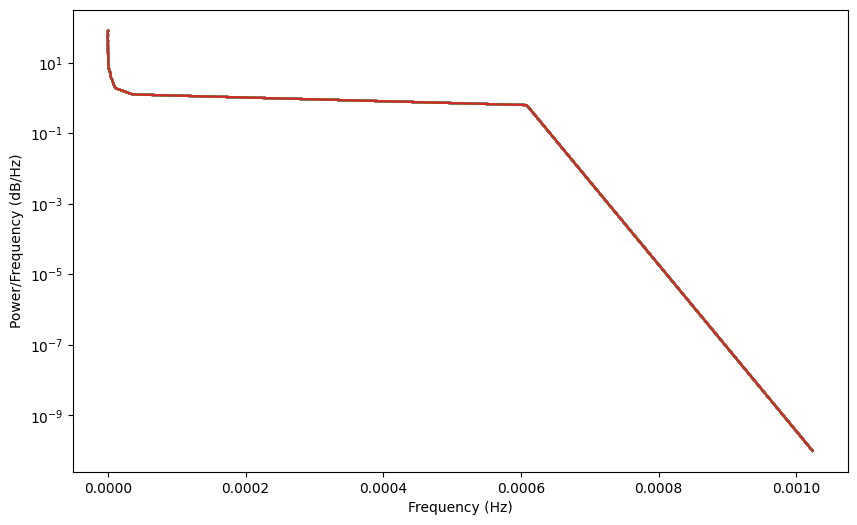

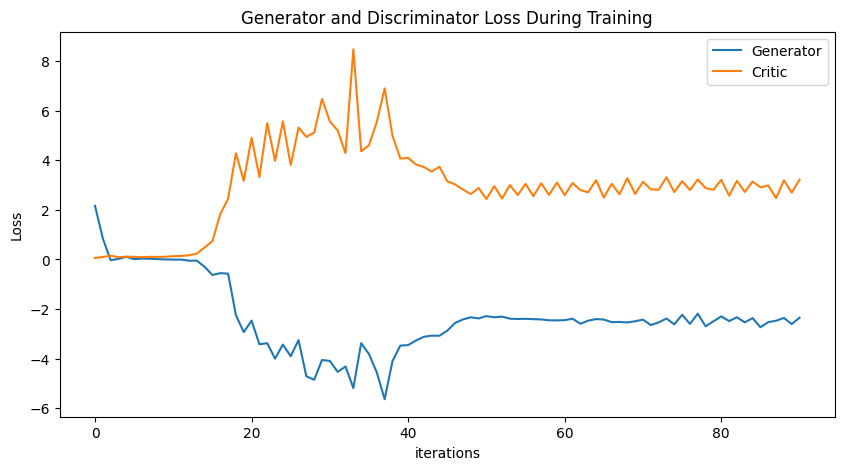

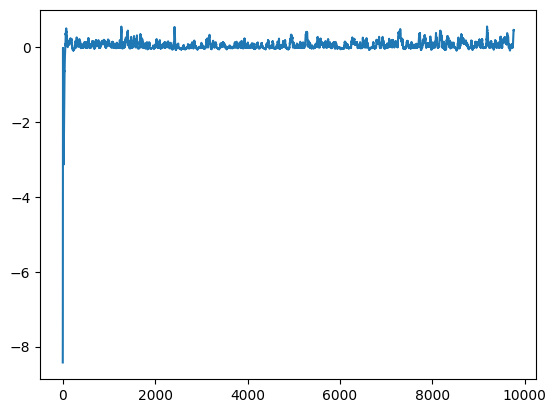

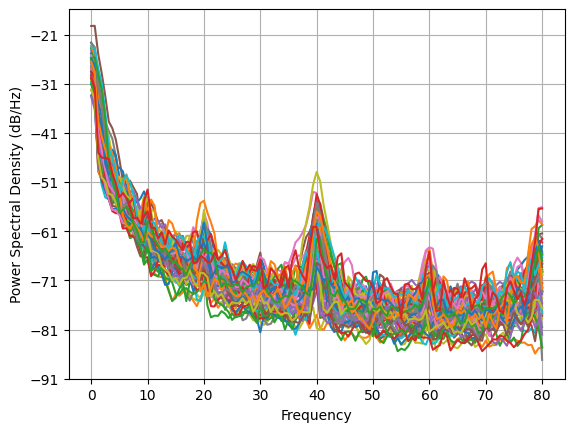

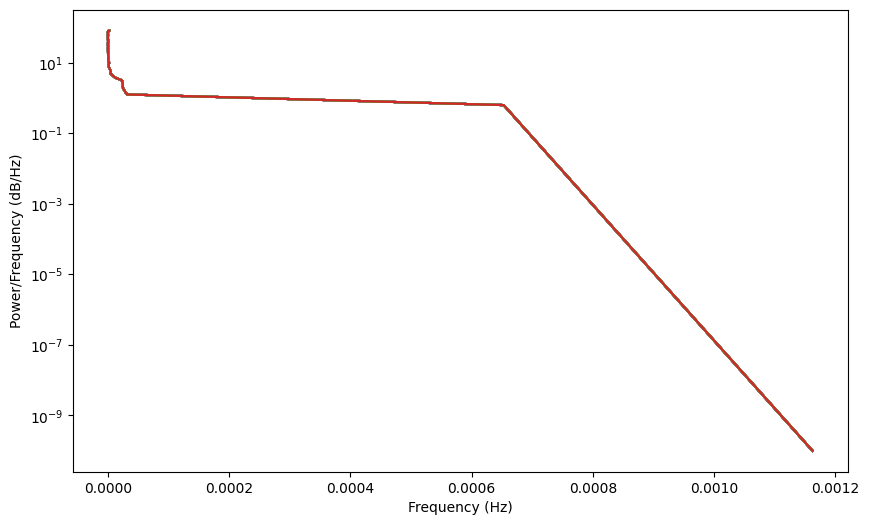

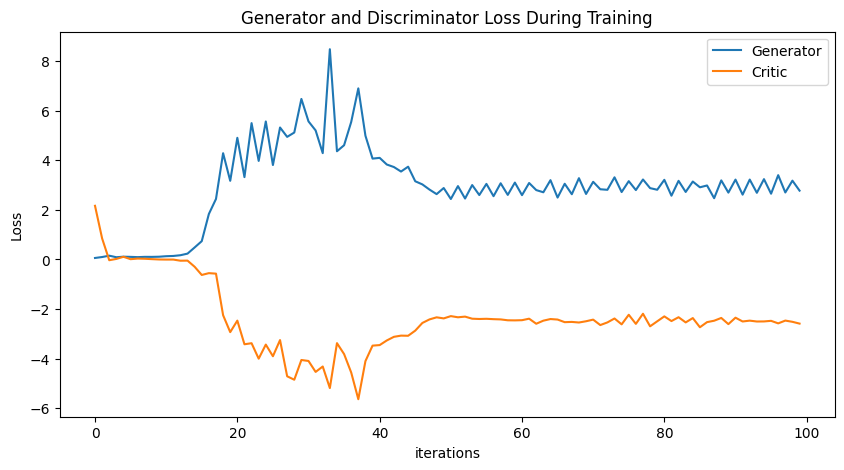

In [3]:
NUM_EPOCHS = 100
PRINT_INTERVAL = 10
training_data = torch.tensor(np.load('training_closed.npy'))
BATCH_SIZE = np.shape(training_data)[0]

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for _ in range(5):
            real = training_data.clone().detach()
            real.requires_grad=True
            critic_real = D(real).reshape(-1)
            loss_critic_real = -torch.mean(critic_real)
            noise = sample_normal_distribution(BATCH_SIZE, 64, 305)
            fake = G(noise)
            critic_fake = D(fake).reshape(-1)
            loss_critic_fake = torch.mean(critic_fake)
            gp = gradient_penalty(D, real, fake) * LAMBDA_GP
            D.zero_grad()
            loss_critic = loss_critic_real + loss_critic_fake + gp
            loss_critic.backward()
            critic_optimizer.step()  

        noise = sample_normal_distribution(BATCH_SIZE, 64, 305)
        fake = G(noise)
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()
        
        critic_err.append(loss_critic.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(fake, critic_err, gen_err)

    return critic_err, gen_err, fake, D, G

critic_err, gen_err, generated_data_closed, disc, gen = train()

torch.save(gen, 'generator1_eyes_closed.pt')
torch.save(disc, 'discriminator1_eyes_closed.pt')
np.save('64channels-closed.npy', generated_data_closed.detach())
plot_everything(generated_data_closed, gen_err, critic_err)
generated_data_closed = None

Epoch 0: Critic error ([1.9616981979555903]) Generator err ([0.06807387620210648])


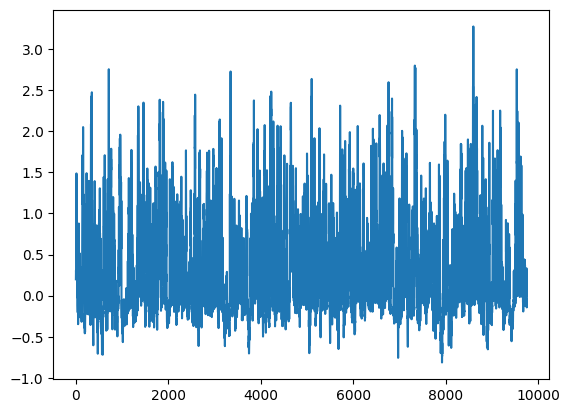

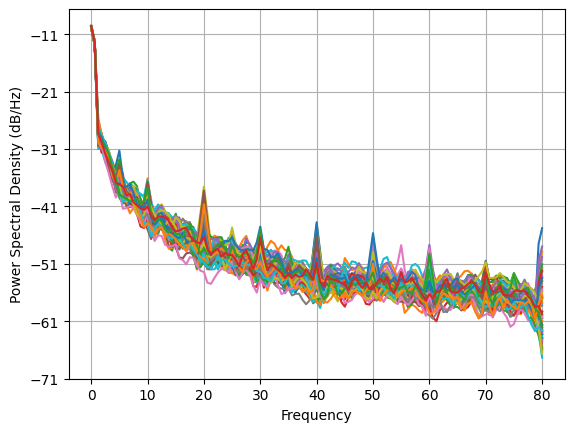

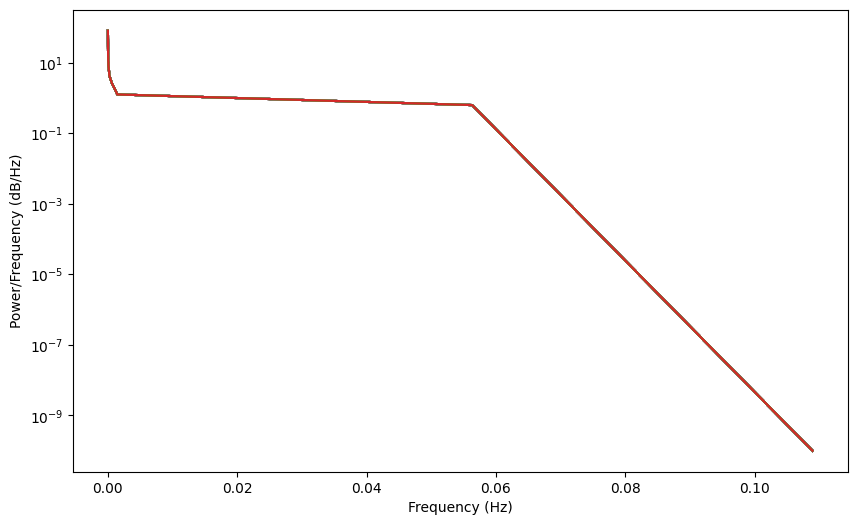

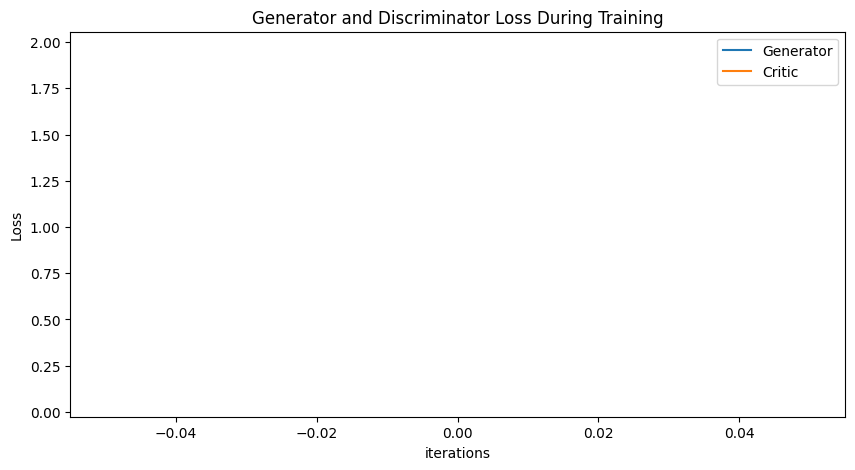

Epoch 10: Critic error ([1.9616981979555903, 0.943304558803451, 0.4615344920529427, 0.6515305562139124, 0.5673473414285786, 0.32998562099801976, 0.4526782774041439, 0.34486679837215284, 0.6550550330241219, 0.16721443441296302, -0.03572984295613629]) Generator err ([0.06807387620210648, 0.07844884693622589, 0.0704403817653656, 0.07633916288614273, 0.09311803430318832, 0.09680930525064468, 0.13961347937583923, 0.17831698060035706, 0.16959814727306366, 0.2409035712480545, 0.3227490782737732])


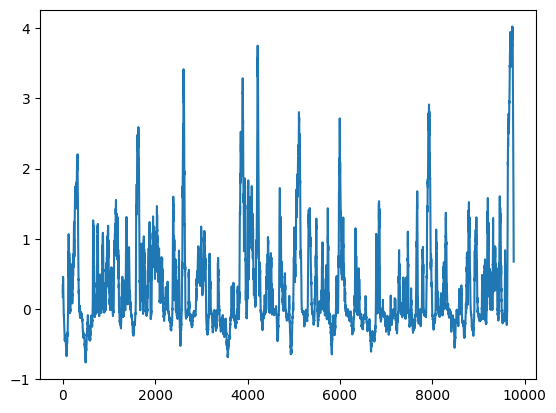

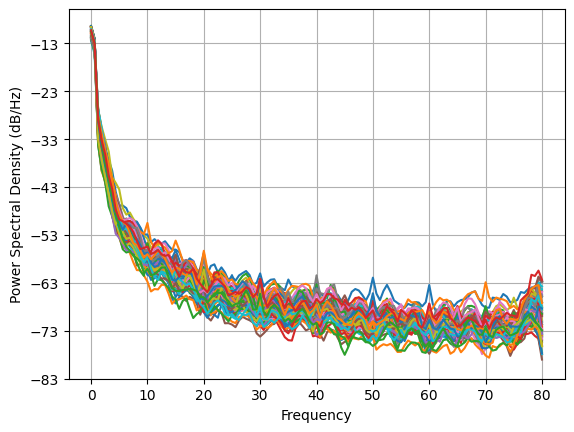

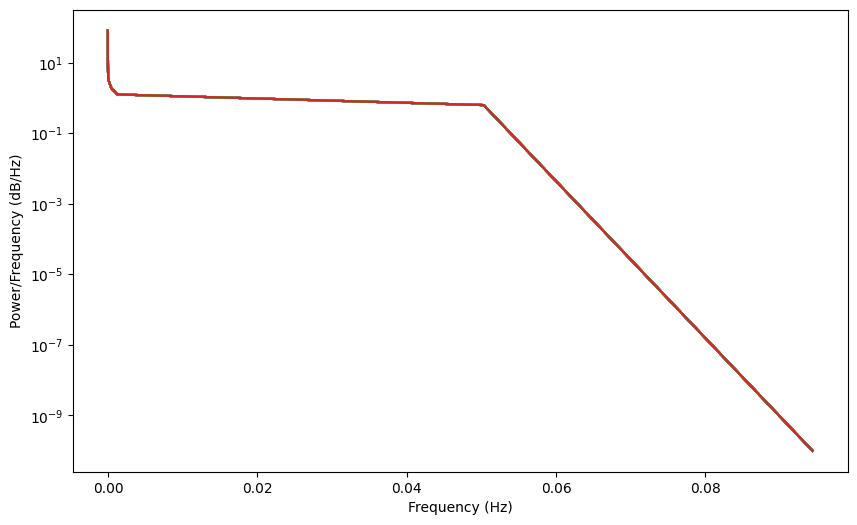

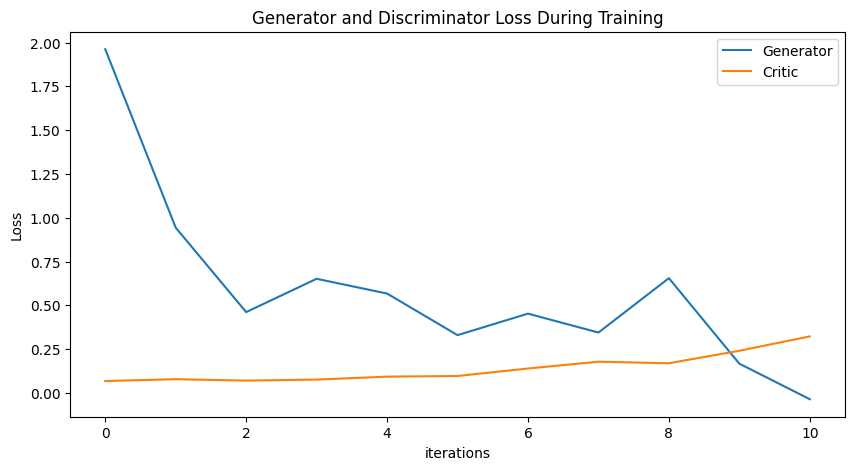

Epoch 20: Critic error ([1.9616981979555903, 0.943304558803451, 0.4615344920529427, 0.6515305562139124, 0.5673473414285786, 0.32998562099801976, 0.4526782774041439, 0.34486679837215284, 0.6550550330241219, 0.16721443441296302, -0.03572984295613629, -0.541502913131304, -0.0898179770493136, -0.21717050679462563, -0.3715974397463841, -0.5270693869259999, 0.06502546067626724, -0.7084250277932606, -0.9064812571408041, -0.0027963757116109544, -1.1853521109424388]) Generator err ([0.06807387620210648, 0.07844884693622589, 0.0704403817653656, 0.07633916288614273, 0.09311803430318832, 0.09680930525064468, 0.13961347937583923, 0.17831698060035706, 0.16959814727306366, 0.2409035712480545, 0.3227490782737732, 0.8692204356193542, 0.49189141392707825, 0.5290142893791199, 0.7266160845756531, 0.9735453128814697, 0.5197169780731201, 0.8297404050827026, 0.911100447177887, 1.207930088043213, 1.1498678922653198])


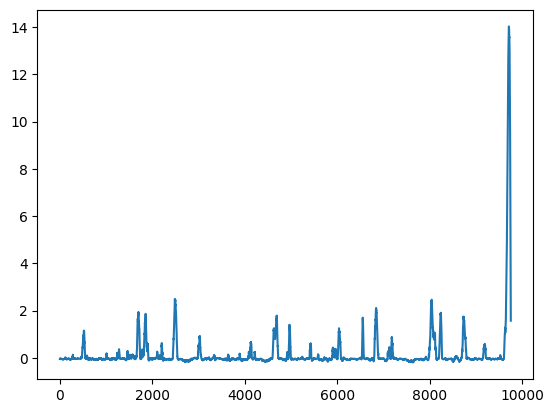

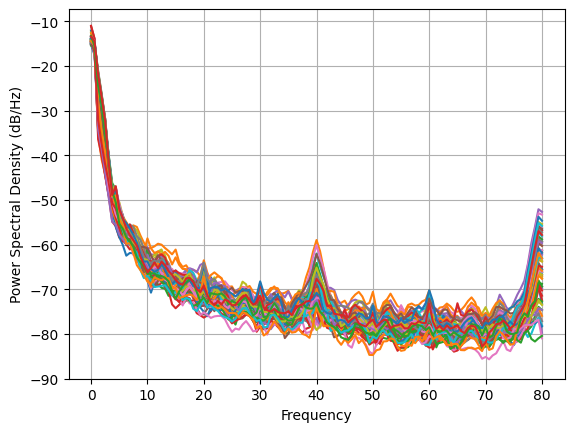

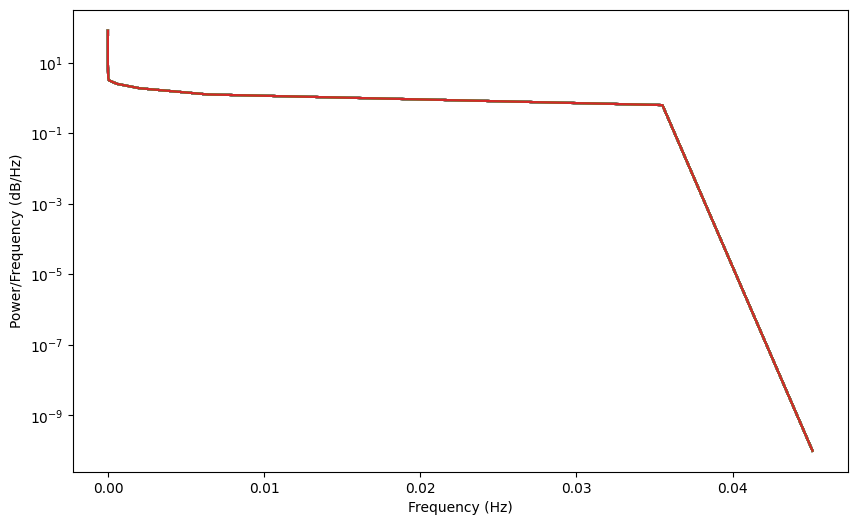

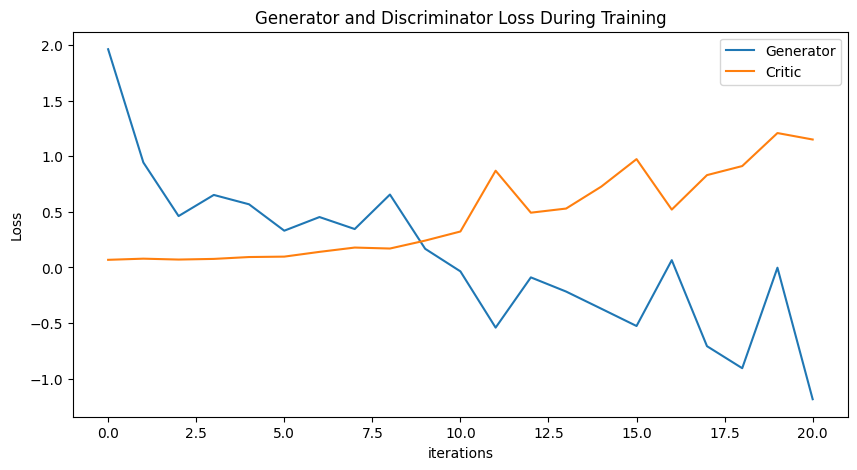

Epoch 30: Critic error ([1.9616981979555903, 0.943304558803451, 0.4615344920529427, 0.6515305562139124, 0.5673473414285786, 0.32998562099801976, 0.4526782774041439, 0.34486679837215284, 0.6550550330241219, 0.16721443441296302, -0.03572984295613629, -0.541502913131304, -0.0898179770493136, -0.21717050679462563, -0.3715974397463841, -0.5270693869259999, 0.06502546067626724, -0.7084250277932606, -0.9064812571408041, -0.0027963757116109544, -1.1853521109424388, -0.9916105678898228, -1.3618946500386413, -1.3033701619278464, -1.7234011651682106, -0.68686037768802, -1.8252346002355877, -0.5837788676963289, -1.9399464736564238, -1.5209313108230793, -2.4399875283253696]) Generator err ([0.06807387620210648, 0.07844884693622589, 0.0704403817653656, 0.07633916288614273, 0.09311803430318832, 0.09680930525064468, 0.13961347937583923, 0.17831698060035706, 0.16959814727306366, 0.2409035712480545, 0.3227490782737732, 0.8692204356193542, 0.49189141392707825, 0.5290142893791199, 0.7266160845756531, 0.97

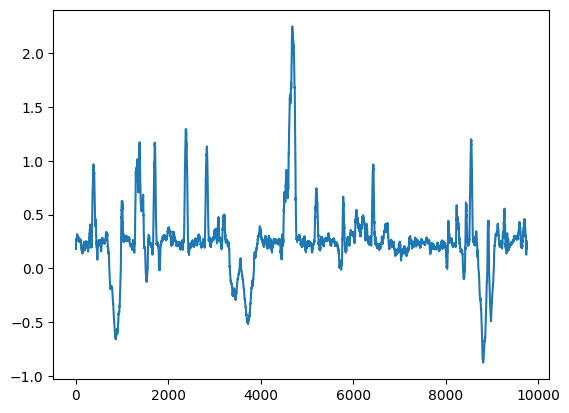

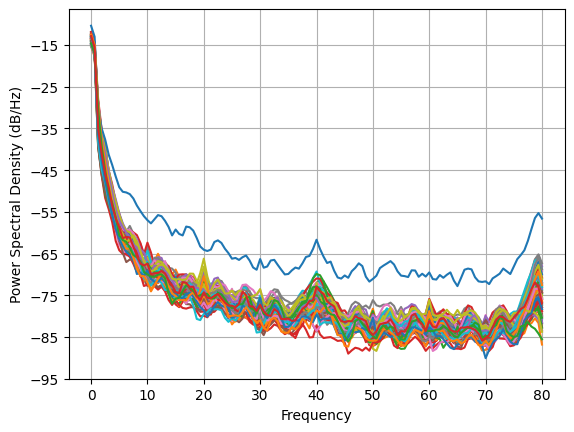

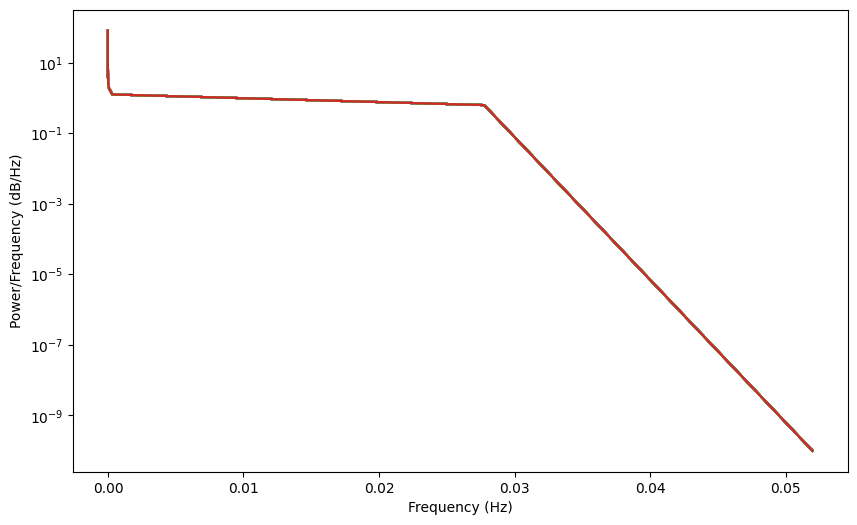

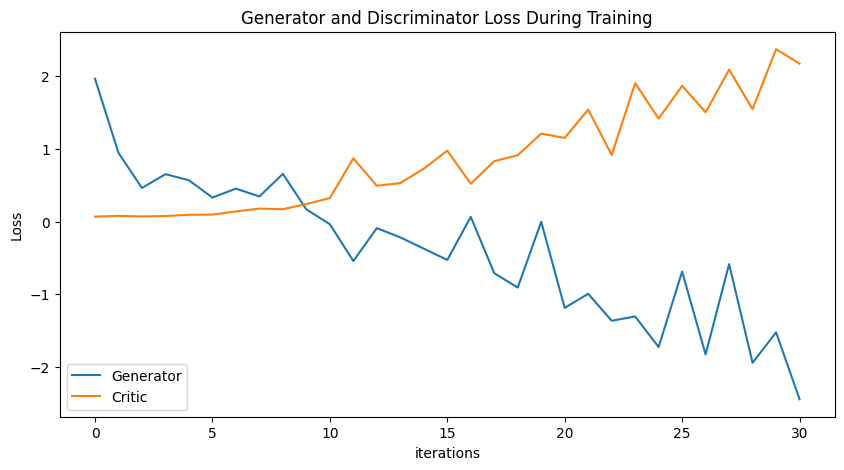

Epoch 40: Critic error ([1.9616981979555903, 0.943304558803451, 0.4615344920529427, 0.6515305562139124, 0.5673473414285786, 0.32998562099801976, 0.4526782774041439, 0.34486679837215284, 0.6550550330241219, 0.16721443441296302, -0.03572984295613629, -0.541502913131304, -0.0898179770493136, -0.21717050679462563, -0.3715974397463841, -0.5270693869259999, 0.06502546067626724, -0.7084250277932606, -0.9064812571408041, -0.0027963757116109544, -1.1853521109424388, -0.9916105678898228, -1.3618946500386413, -1.3033701619278464, -1.7234011651682106, -0.68686037768802, -1.8252346002355877, -0.5837788676963289, -1.9399464736564238, -1.5209313108230793, -2.4399875283253696, -2.197259386253894, -2.3953342933111, -2.6213637023067973, -1.732682213276437, -2.426842652654889, -2.576221176384703, -2.3782027086093747, -2.0249451113805517, -3.1786845779555986, -2.5444297825189413]) Generator err ([0.06807387620210648, 0.07844884693622589, 0.0704403817653656, 0.07633916288614273, 0.09311803430318832, 0.0968

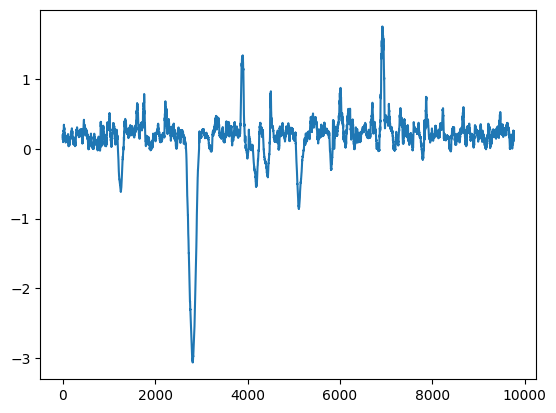

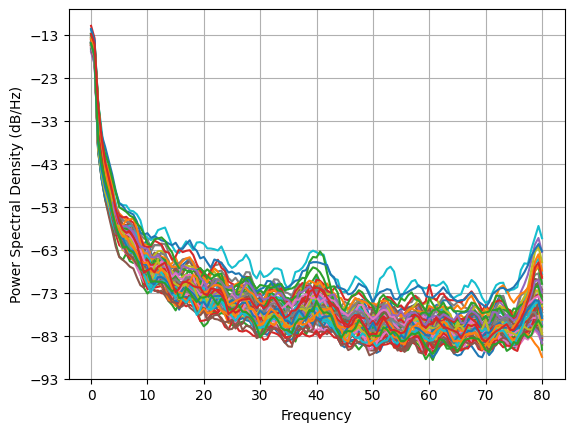

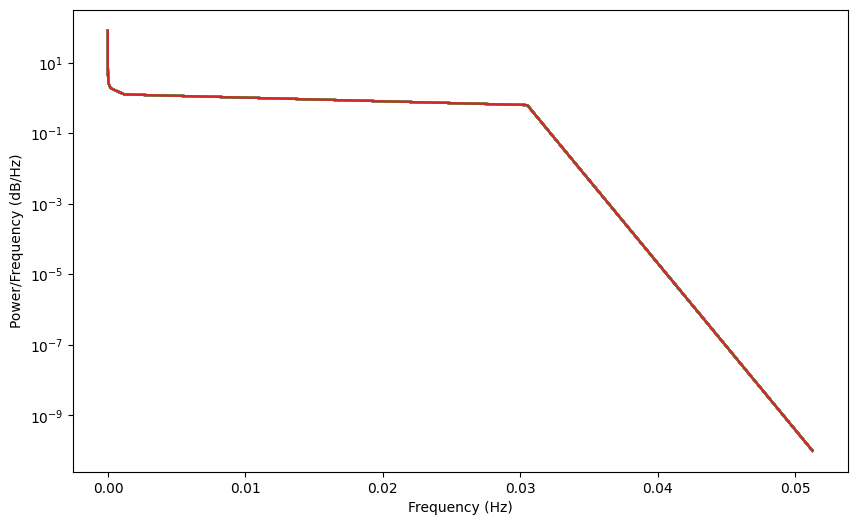

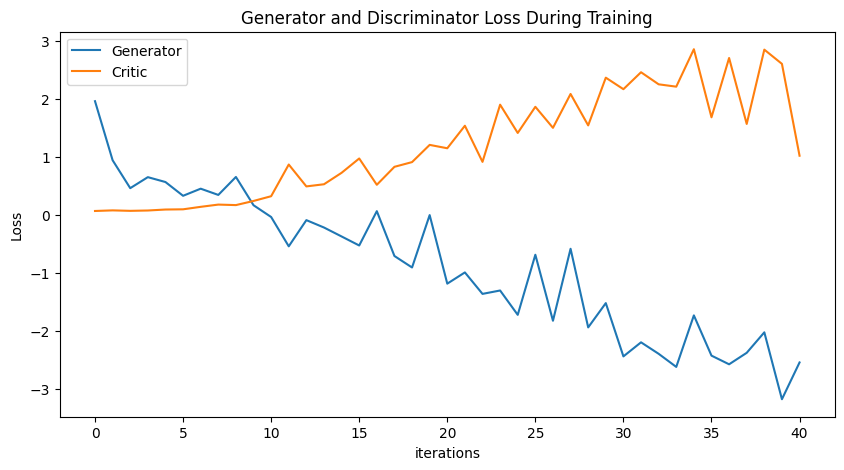

Epoch 50: Critic error ([1.9616981979555903, 0.943304558803451, 0.4615344920529427, 0.6515305562139124, 0.5673473414285786, 0.32998562099801976, 0.4526782774041439, 0.34486679837215284, 0.6550550330241219, 0.16721443441296302, -0.03572984295613629, -0.541502913131304, -0.0898179770493136, -0.21717050679462563, -0.3715974397463841, -0.5270693869259999, 0.06502546067626724, -0.7084250277932606, -0.9064812571408041, -0.0027963757116109544, -1.1853521109424388, -0.9916105678898228, -1.3618946500386413, -1.3033701619278464, -1.7234011651682106, -0.68686037768802, -1.8252346002355877, -0.5837788676963289, -1.9399464736564238, -1.5209313108230793, -2.4399875283253696, -2.197259386253894, -2.3953342933111, -2.6213637023067973, -1.732682213276437, -2.426842652654889, -2.576221176384703, -2.3782027086093747, -2.0249451113805517, -3.1786845779555986, -2.5444297825189413, -2.958809059643224, -3.788610442885564, -3.894210572596542, -3.212889996188302, -3.262546494458587, -2.817835085192489, -3.4510

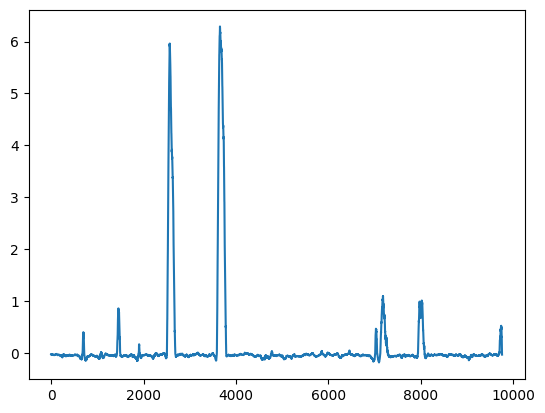

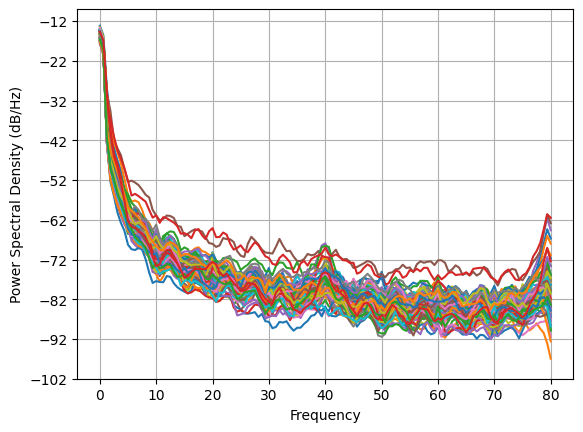

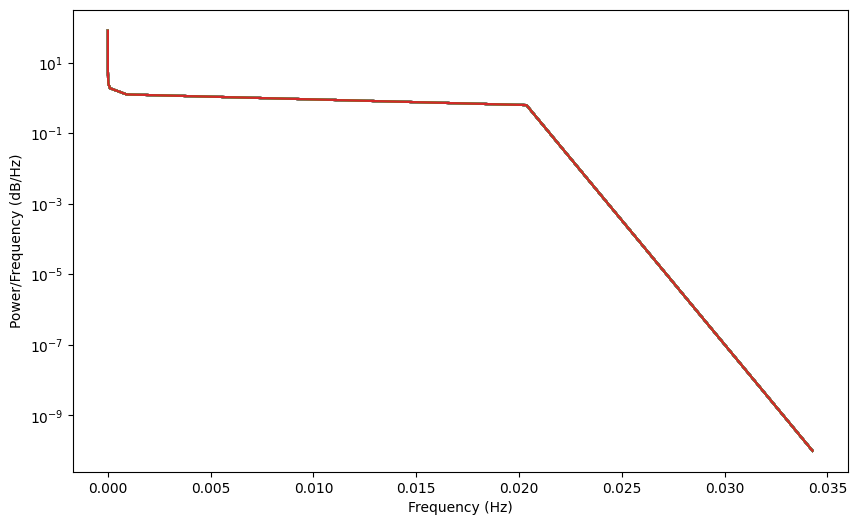

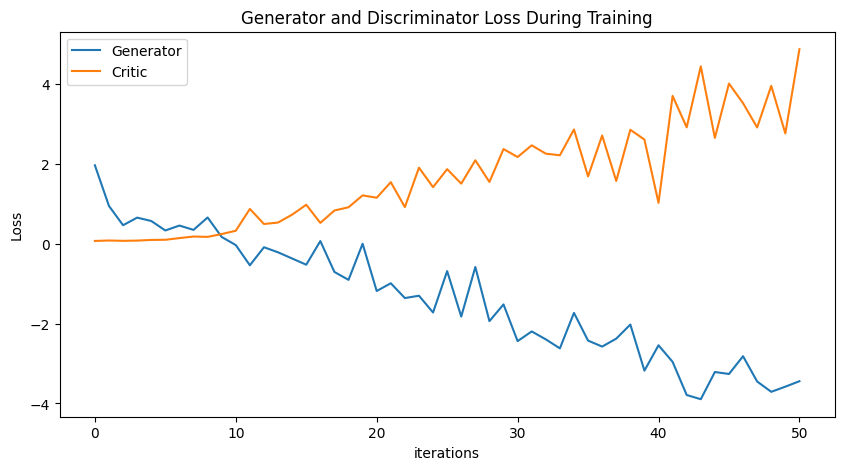

Epoch 60: Critic error ([1.9616981979555903, 0.943304558803451, 0.4615344920529427, 0.6515305562139124, 0.5673473414285786, 0.32998562099801976, 0.4526782774041439, 0.34486679837215284, 0.6550550330241219, 0.16721443441296302, -0.03572984295613629, -0.541502913131304, -0.0898179770493136, -0.21717050679462563, -0.3715974397463841, -0.5270693869259999, 0.06502546067626724, -0.7084250277932606, -0.9064812571408041, -0.0027963757116109544, -1.1853521109424388, -0.9916105678898228, -1.3618946500386413, -1.3033701619278464, -1.7234011651682106, -0.68686037768802, -1.8252346002355877, -0.5837788676963289, -1.9399464736564238, -1.5209313108230793, -2.4399875283253696, -2.197259386253894, -2.3953342933111, -2.6213637023067973, -1.732682213276437, -2.426842652654889, -2.576221176384703, -2.3782027086093747, -2.0249451113805517, -3.1786845779555986, -2.5444297825189413, -2.958809059643224, -3.788610442885564, -3.894210572596542, -3.212889996188302, -3.262546494458587, -2.817835085192489, -3.4510

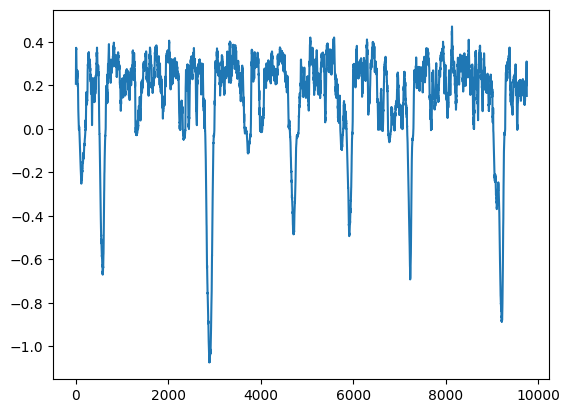

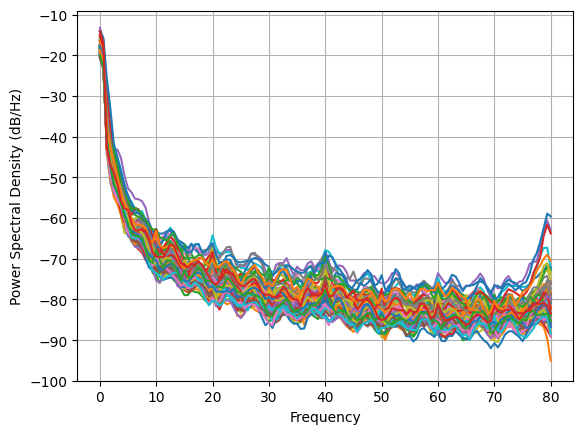

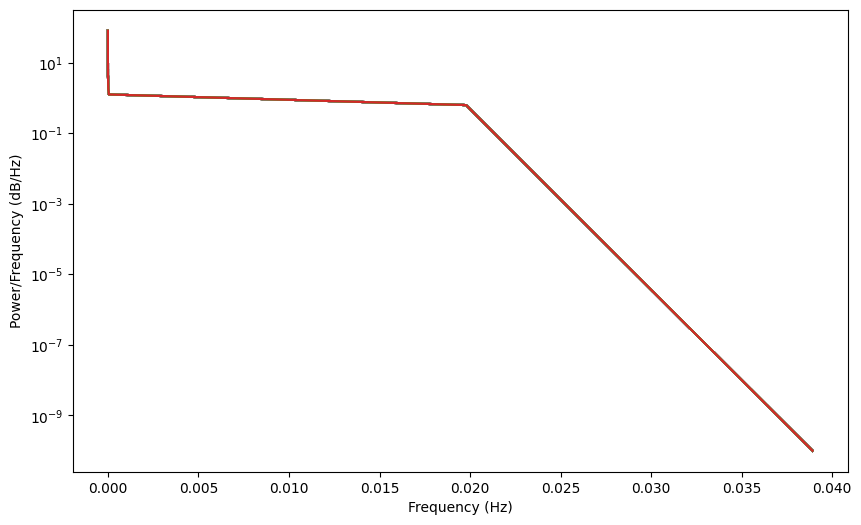

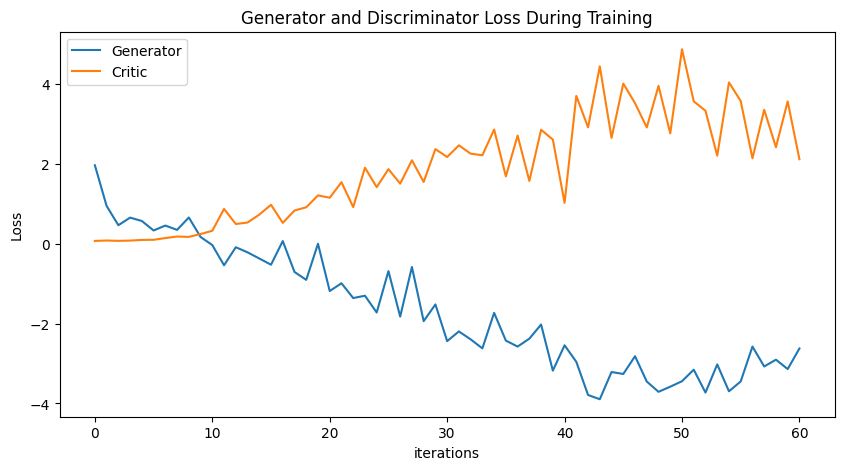

Epoch 70: Critic error ([1.9616981979555903, 0.943304558803451, 0.4615344920529427, 0.6515305562139124, 0.5673473414285786, 0.32998562099801976, 0.4526782774041439, 0.34486679837215284, 0.6550550330241219, 0.16721443441296302, -0.03572984295613629, -0.541502913131304, -0.0898179770493136, -0.21717050679462563, -0.3715974397463841, -0.5270693869259999, 0.06502546067626724, -0.7084250277932606, -0.9064812571408041, -0.0027963757116109544, -1.1853521109424388, -0.9916105678898228, -1.3618946500386413, -1.3033701619278464, -1.7234011651682106, -0.68686037768802, -1.8252346002355877, -0.5837788676963289, -1.9399464736564238, -1.5209313108230793, -2.4399875283253696, -2.197259386253894, -2.3953342933111, -2.6213637023067973, -1.732682213276437, -2.426842652654889, -2.576221176384703, -2.3782027086093747, -2.0249451113805517, -3.1786845779555986, -2.5444297825189413, -2.958809059643224, -3.788610442885564, -3.894210572596542, -3.212889996188302, -3.262546494458587, -2.817835085192489, -3.4510

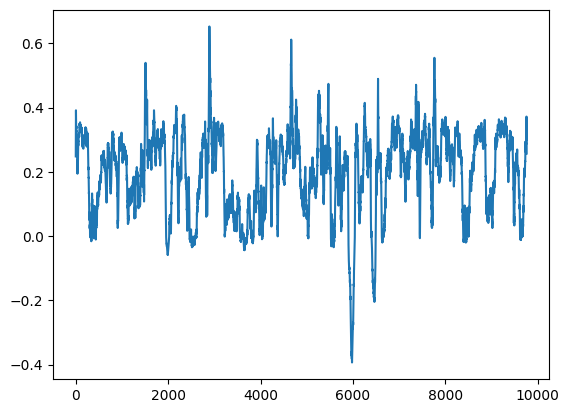

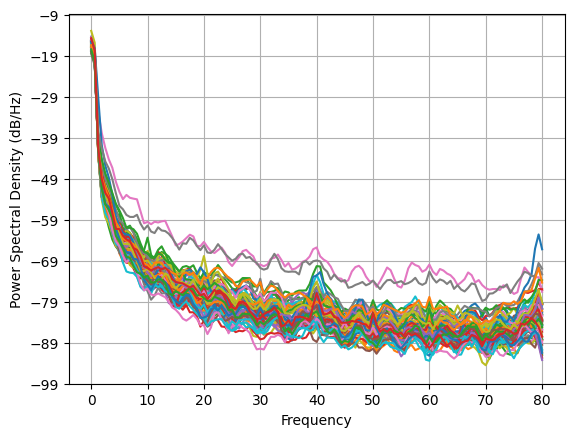

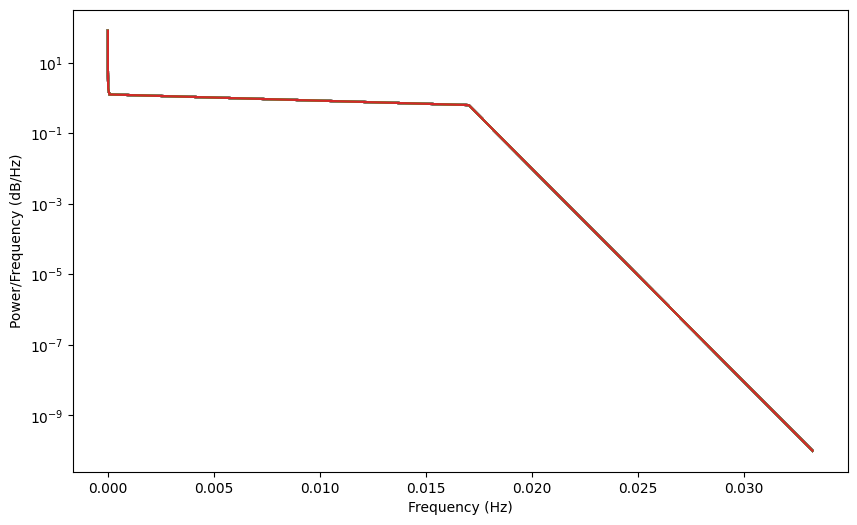

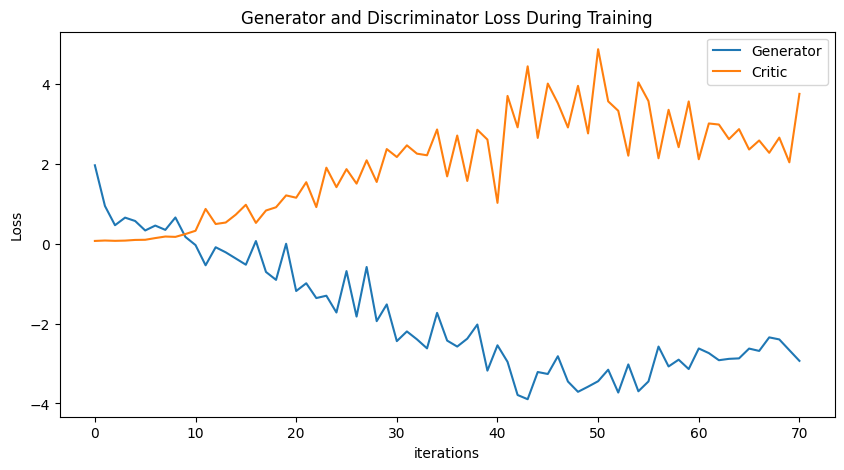

Epoch 80: Critic error ([1.9616981979555903, 0.943304558803451, 0.4615344920529427, 0.6515305562139124, 0.5673473414285786, 0.32998562099801976, 0.4526782774041439, 0.34486679837215284, 0.6550550330241219, 0.16721443441296302, -0.03572984295613629, -0.541502913131304, -0.0898179770493136, -0.21717050679462563, -0.3715974397463841, -0.5270693869259999, 0.06502546067626724, -0.7084250277932606, -0.9064812571408041, -0.0027963757116109544, -1.1853521109424388, -0.9916105678898228, -1.3618946500386413, -1.3033701619278464, -1.7234011651682106, -0.68686037768802, -1.8252346002355877, -0.5837788676963289, -1.9399464736564238, -1.5209313108230793, -2.4399875283253696, -2.197259386253894, -2.3953342933111, -2.6213637023067973, -1.732682213276437, -2.426842652654889, -2.576221176384703, -2.3782027086093747, -2.0249451113805517, -3.1786845779555986, -2.5444297825189413, -2.958809059643224, -3.788610442885564, -3.894210572596542, -3.212889996188302, -3.262546494458587, -2.817835085192489, -3.4510

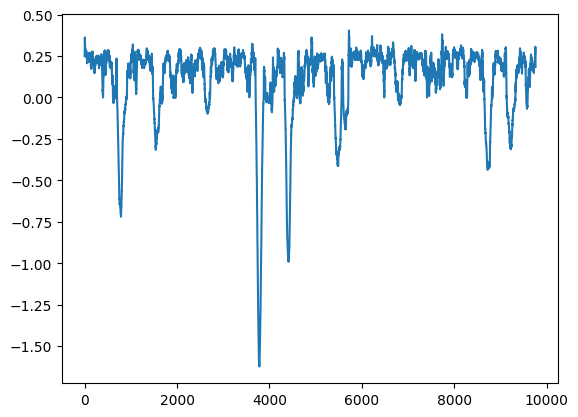

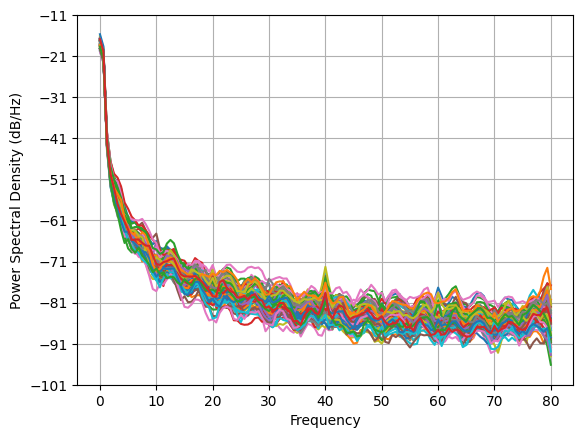

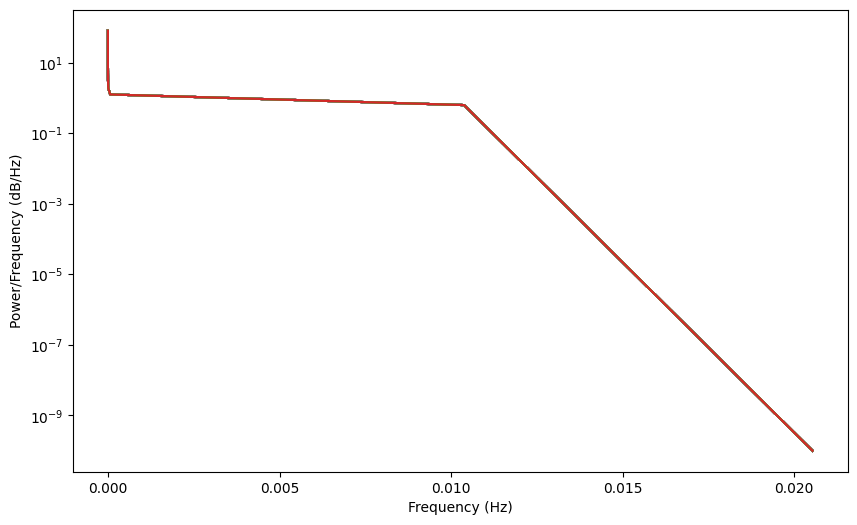

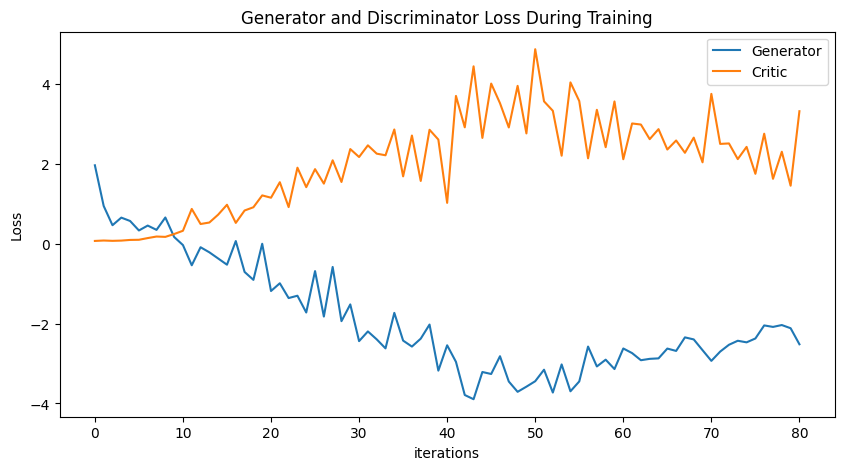

Epoch 90: Critic error ([1.9616981979555903, 0.943304558803451, 0.4615344920529427, 0.6515305562139124, 0.5673473414285786, 0.32998562099801976, 0.4526782774041439, 0.34486679837215284, 0.6550550330241219, 0.16721443441296302, -0.03572984295613629, -0.541502913131304, -0.0898179770493136, -0.21717050679462563, -0.3715974397463841, -0.5270693869259999, 0.06502546067626724, -0.7084250277932606, -0.9064812571408041, -0.0027963757116109544, -1.1853521109424388, -0.9916105678898228, -1.3618946500386413, -1.3033701619278464, -1.7234011651682106, -0.68686037768802, -1.8252346002355877, -0.5837788676963289, -1.9399464736564238, -1.5209313108230793, -2.4399875283253696, -2.197259386253894, -2.3953342933111, -2.6213637023067973, -1.732682213276437, -2.426842652654889, -2.576221176384703, -2.3782027086093747, -2.0249451113805517, -3.1786845779555986, -2.5444297825189413, -2.958809059643224, -3.788610442885564, -3.894210572596542, -3.212889996188302, -3.262546494458587, -2.817835085192489, -3.4510

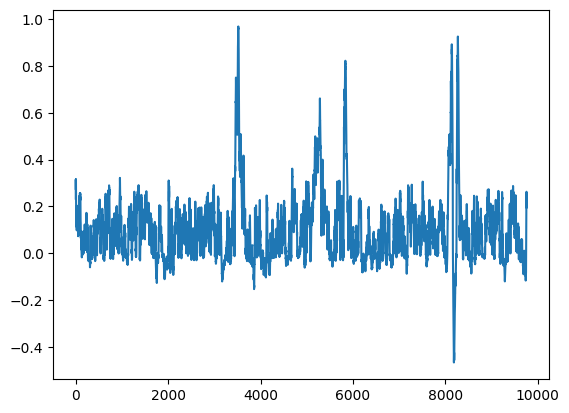

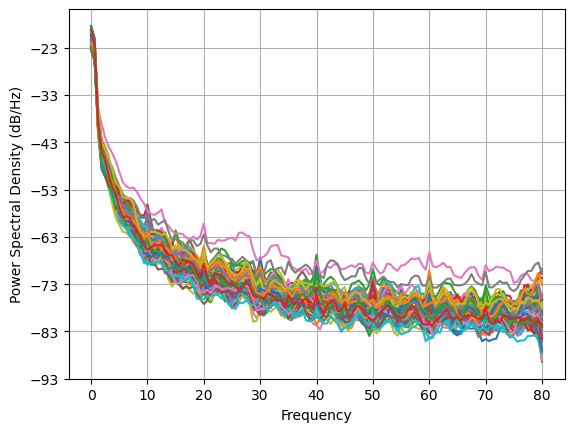

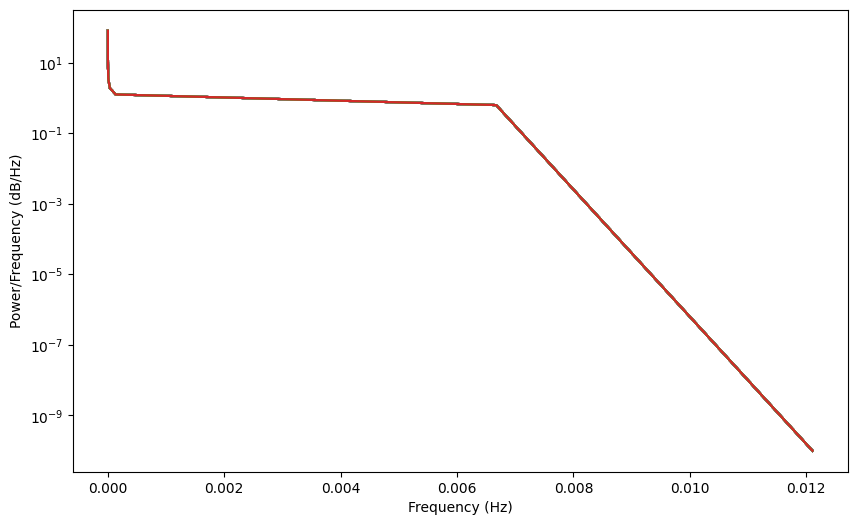

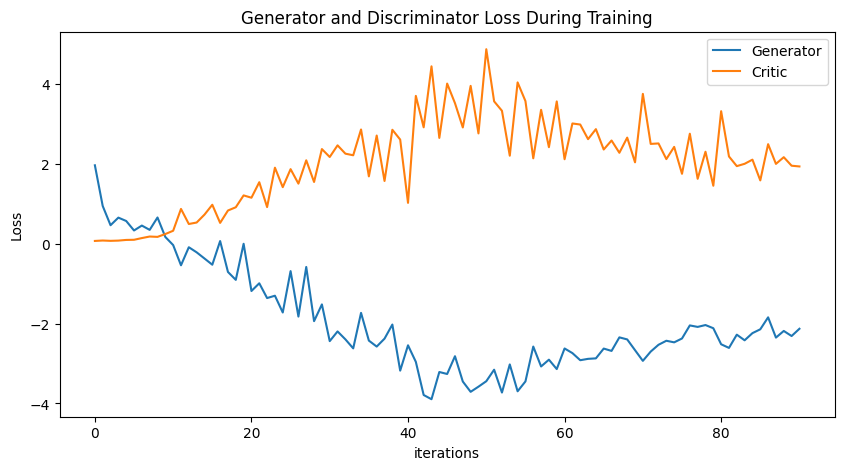

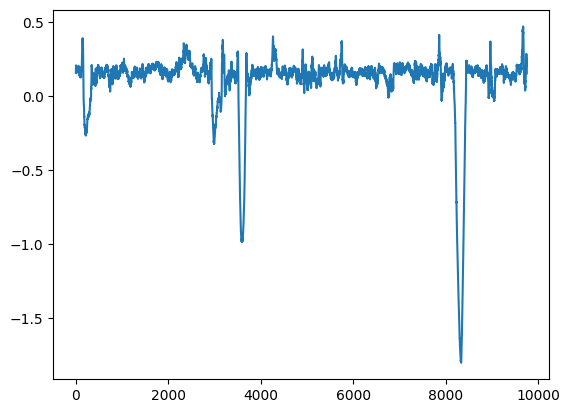

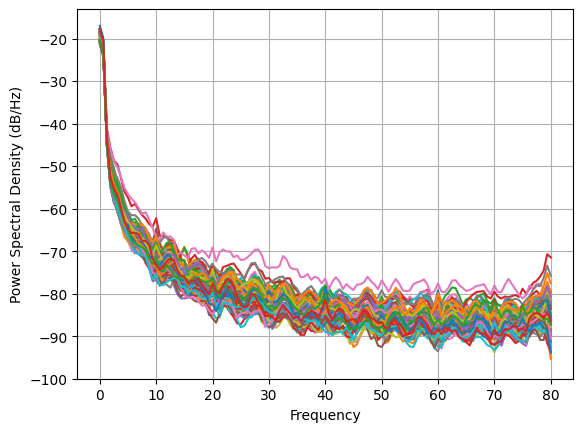

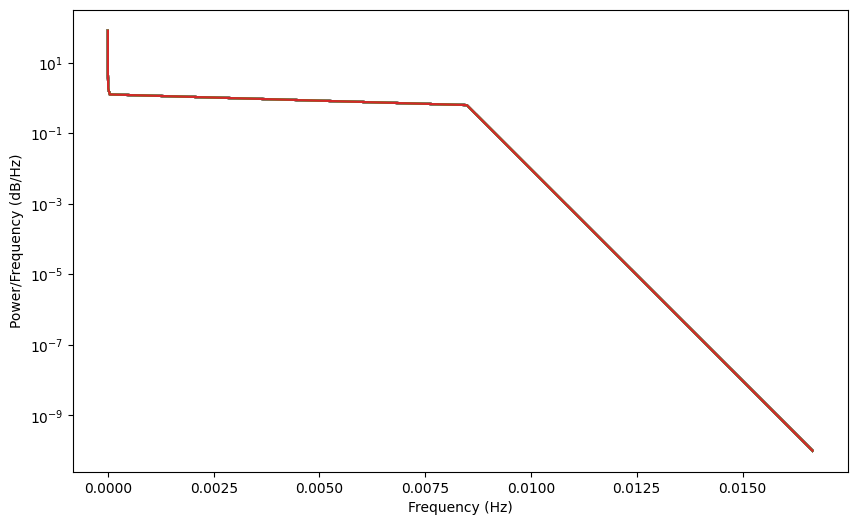

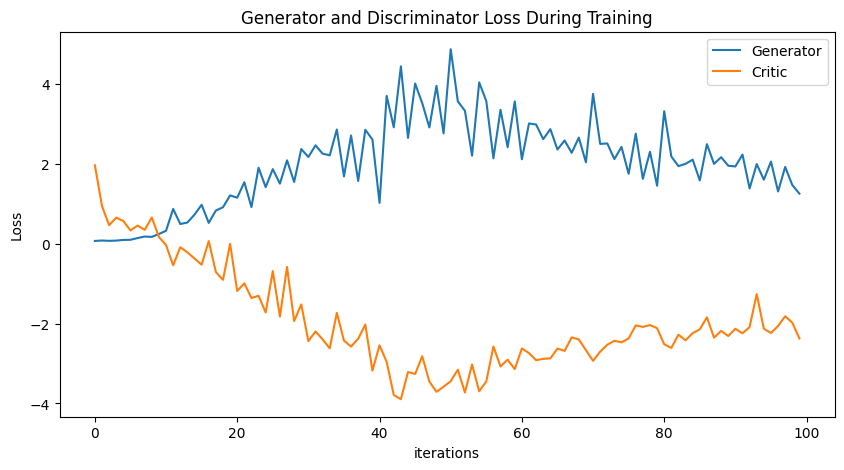

In [4]:
NUM_EPOCHS = 100
PRINT_INTERVAL = 10
training_data = torch.tensor(np.load('training_open.npy'))
BATCH_SIZE = np.shape(training_data)[0]

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for _ in range(5):
            real = training_data.clone().detach()
            real.requires_grad=True
            critic_real = D(real).reshape(-1)
            loss_critic_real = -torch.mean(critic_real)
            noise = sample_normal_distribution(BATCH_SIZE, 64, 305)
            fake = G(noise)
            critic_fake = D(fake).reshape(-1)
            loss_critic_fake = torch.mean(critic_fake)
            gp = gradient_penalty(D, real, fake) * LAMBDA_GP
            D.zero_grad()
            loss_critic = loss_critic_real + loss_critic_fake + gp
            loss_critic.backward()
            critic_optimizer.step()  

        noise = sample_normal_distribution(BATCH_SIZE, 64, 305)
        fake = G(noise)
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()
        
        critic_err.append(loss_critic.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(fake, critic_err, gen_err)

    return critic_err, gen_err, fake, D, G

critic_err, gen_err, generated_data_open, disc, gen = train()

torch.save(gen, 'generator1_eyes_open.pt')
torch.save(disc, 'discriminator1_eyes_open.pt')
np.save('64channels-open.npy', generated_data_open.detach())
plot_everything(generated_data_open, gen_err, critic_err)
generated_data_open = None

# Normalized 64

Epoch 0: Critic error ([4.48568245836625]) Generator err ([0.038520924746990204])


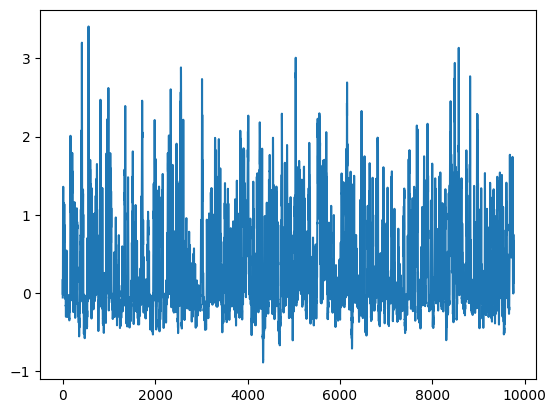

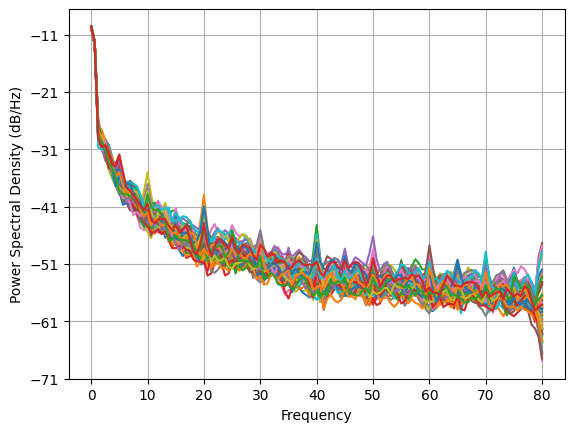

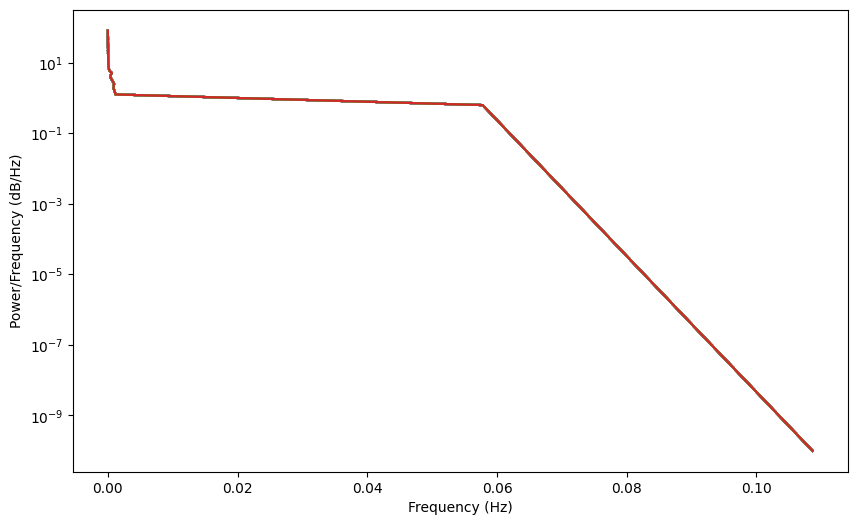

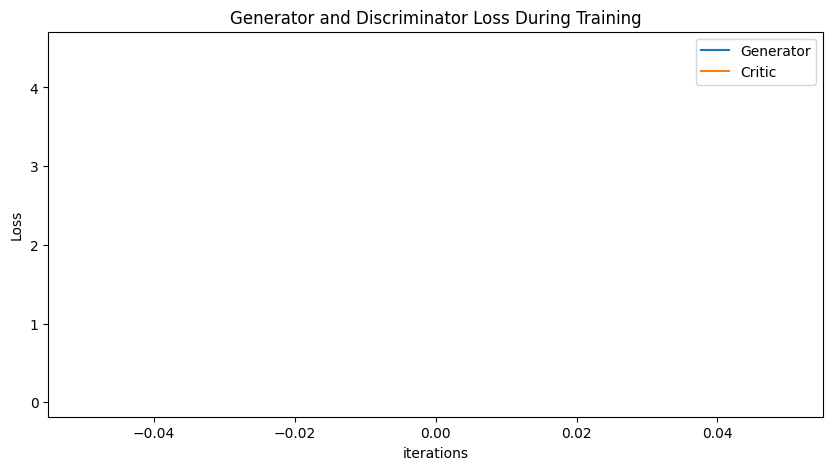

KeyboardInterrupt: 

In [5]:
NUM_EPOCHS = 100
PRINT_INTERVAL = 10
training_data = np.load('training_closed.npy')
scaler = MinMaxScaler(feature_range=(-1, 1))
normalized_data_open = np.zeros_like(training_data)
for i in range(training_data.shape[1]):
    scaler = scaler.fit(training_data[:, i])
    normalized_data_open[:, i] = scaler.transform(training_data[:, i])
training_data = torch.tensor(normalized_data_open)
BATCH_SIZE = np.shape(training_data)[0]
normalized_data_open = None

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for _ in range(5):
            real = training_data.clone().detach()
            real.requires_grad=True
            critic_real = D(real).reshape(-1)
            loss_critic_real = -torch.mean(critic_real)
            noise = sample_normal_distribution(BATCH_SIZE, 64, 305)
            fake = G(noise)
            critic_fake = D(fake).reshape(-1)
            loss_critic_fake = torch.mean(critic_fake)
            gp = gradient_penalty(D, real, fake) * LAMBDA_GP
            D.zero_grad()
            loss_critic = loss_critic_real + loss_critic_fake + gp
            loss_critic.backward()
            critic_optimizer.step()  

        noise = sample_normal_distribution(BATCH_SIZE, 64, 305)
        fake = G(noise)
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()
        
        critic_err.append(loss_critic.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(fake, critic_err, gen_err)

    return critic_err, gen_err, fake, D, G

critic_err, gen_err, generated_data_closed, disc, gen = train()

torch.save(gen, 'generator1_eyes_closed-norm.pt')
torch.save(disc, 'discriminator1_eyes_closed-norm.pt')
np.save('64channels-closed-norm.npy', generated_data_closed.detach())
plot_everything(generated_data_closed, gen_err, critic_err)
generated_data_closed = None

In [ ]:
NUM_EPOCHS = 100
PRINT_INTERVAL = 10
training_data = np.load('training_open.npy')
scaler = MinMaxScaler(feature_range=(-1, 1))
normalized_data_open = np.zeros_like(training_data)
for i in range(training_data.shape[1]):
    scaler = scaler.fit(training_data[:, i])
    normalized_data_open[:, i] = scaler.transform(training_data[:, i])
training_data = torch.tensor(normalized_data_open)
BATCH_SIZE = np.shape(training_data)[0]
normalized_data_open = None

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for _ in range(5):
            real = training_data.clone().detach()
            real.requires_grad=True
            critic_real = D(real).reshape(-1)
            loss_critic_real = -torch.mean(critic_real)
            noise = sample_normal_distribution(BATCH_SIZE, 64, 305)
            fake = G(noise)
            critic_fake = D(fake).reshape(-1)
            loss_critic_fake = torch.mean(critic_fake)
            gp = gradient_penalty(D, real, fake) * LAMBDA_GP
            D.zero_grad()
            loss_critic = loss_critic_real + loss_critic_fake + gp
            loss_critic.backward()
            critic_optimizer.step()  

        noise = sample_normal_distribution(BATCH_SIZE, 64, 305)
        fake = G(noise)
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()
        
        critic_err.append(loss_critic.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(fake, critic_err, gen_err)

    return critic_err, gen_err, fake, D, G

critic_err, gen_err, generated_data_open, disc, gen = train()

torch.save(gen, 'generator1_eyes_open-norm.pt')
torch.save(disc, 'discriminator1_eyes_open-norm.pt')
np.save('64channels-open-norm.npy', generated_data_open.detach())
plot_everything(generated_data_open, gen_err, critic_err)
generated_data_open = None

# inner channel size 320

Epoch 0: Critic error ([0.22195497555894933]) Generator err ([-0.011442665942013264])


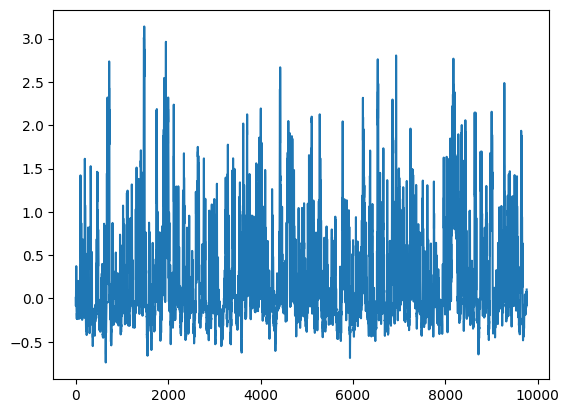

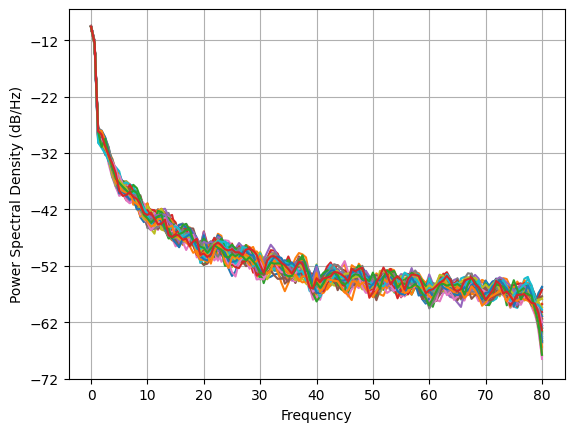

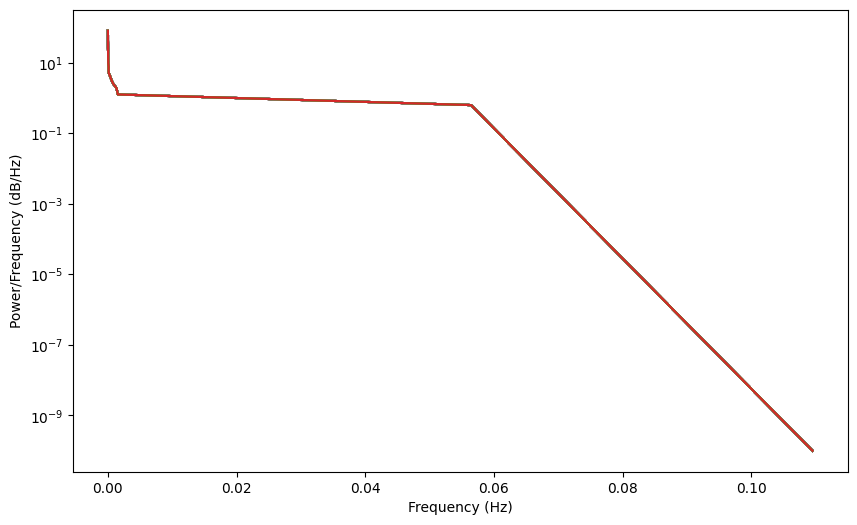

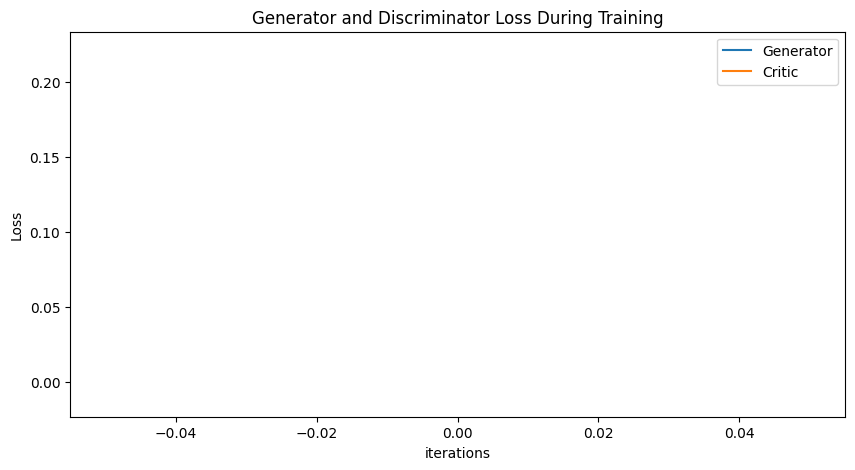

Epoch 5: Critic error ([0.22195497555894933, -0.4153132122301485, -0.9787219020970293, 0.01346942962194551, 0.011300233611493432, 0.07048267647338885]) Generator err ([-0.011442665942013264, 1.2154594659805298, 2.258559226989746, -0.07277479022741318, 0.002776320558041334, 0.3476100265979767])


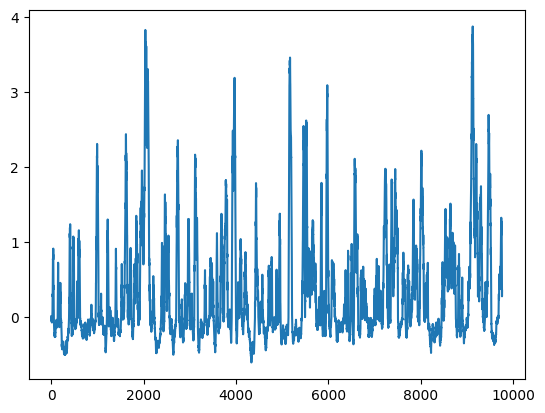

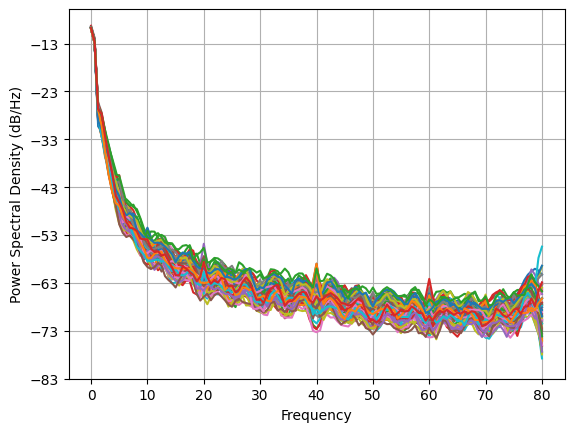

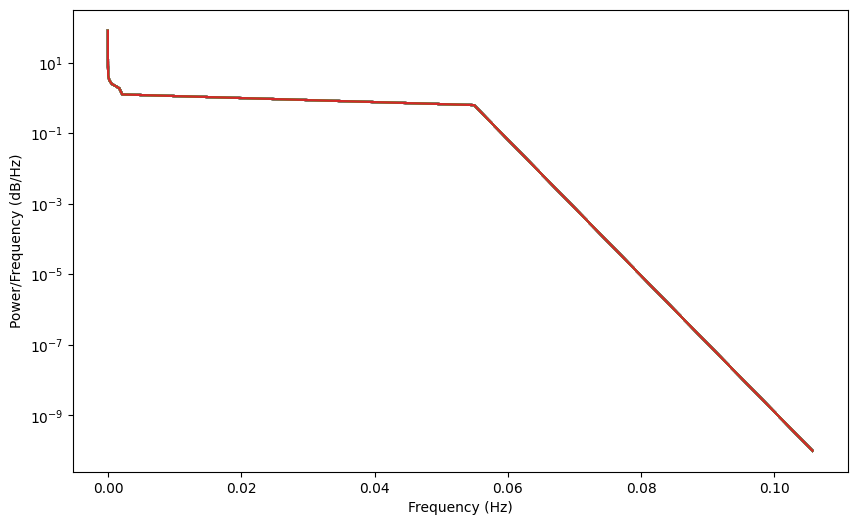

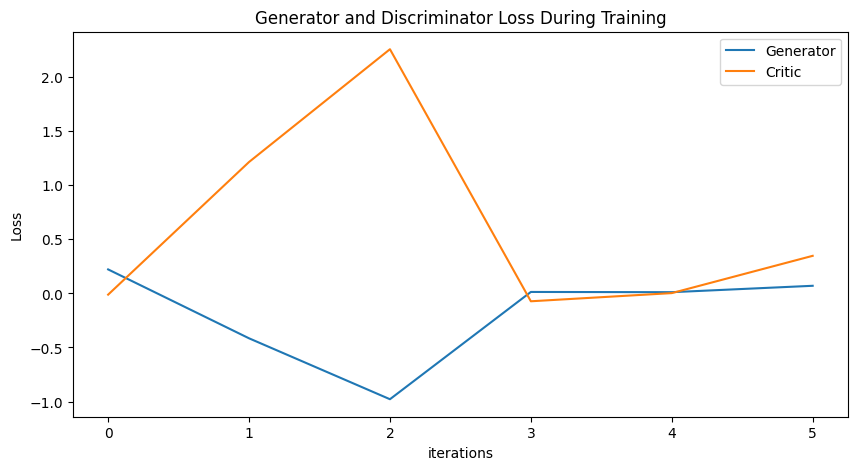

Epoch 10: Critic error ([0.22195497555894933, -0.4153132122301485, -0.9787219020970293, 0.01346942962194551, 0.011300233611493432, 0.07048267647338885, -0.23222624585740934, -1.4764825869473595, 1.1161836817451176, -0.0500233599682241, -0.7932263375695932]) Generator err ([-0.011442665942013264, 1.2154594659805298, 2.258559226989746, -0.07277479022741318, 0.002776320558041334, 0.3476100265979767, 0.5115180611610413, 3.9718916416168213, 0.06916234642267227, 0.3094883859157562, 1.4587645530700684])


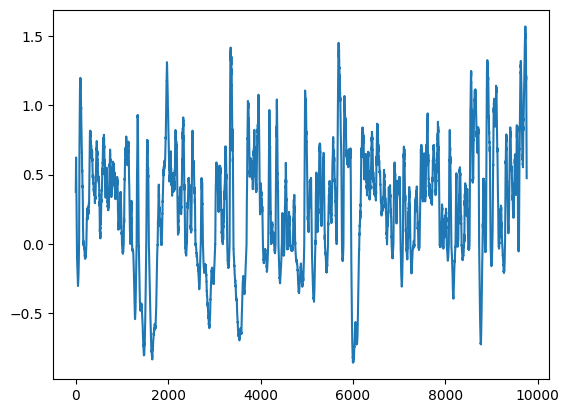

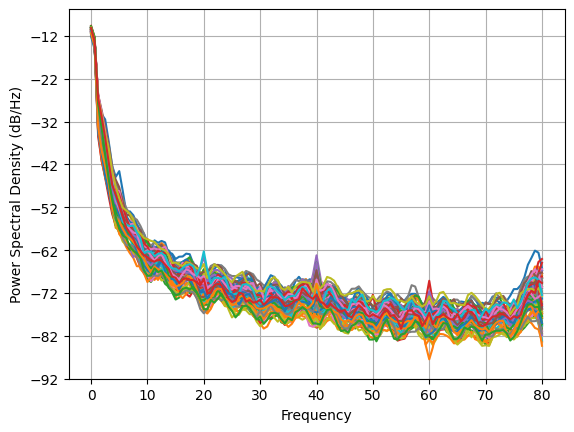

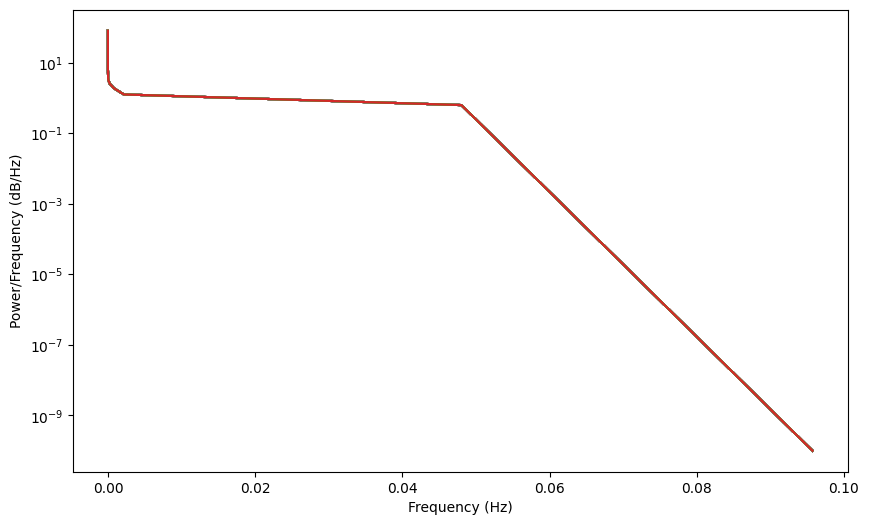

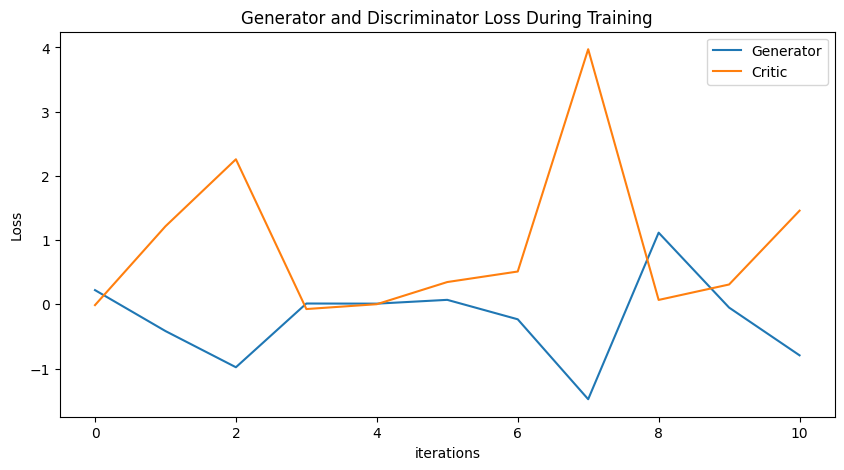

Epoch 15: Critic error ([0.22195497555894933, -0.4153132122301485, -0.9787219020970293, 0.01346942962194551, 0.011300233611493432, 0.07048267647338885, -0.23222624585740934, -1.4764825869473595, 1.1161836817451176, -0.0500233599682241, -0.7932263375695932, -1.334577371626122, -4.418497262344271, -4.130431733093713, -3.7937532036243407, -4.354379833658197]) Generator err ([-0.011442665942013264, 1.2154594659805298, 2.258559226989746, -0.07277479022741318, 0.002776320558041334, 0.3476100265979767, 0.5115180611610413, 3.9718916416168213, 0.06916234642267227, 0.3094883859157562, 1.4587645530700684, 3.143289089202881, 4.847540855407715, 7.324622631072998, 4.937951564788818, 4.930426120758057])


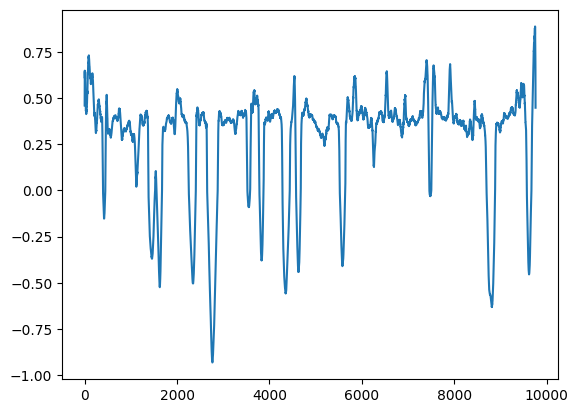

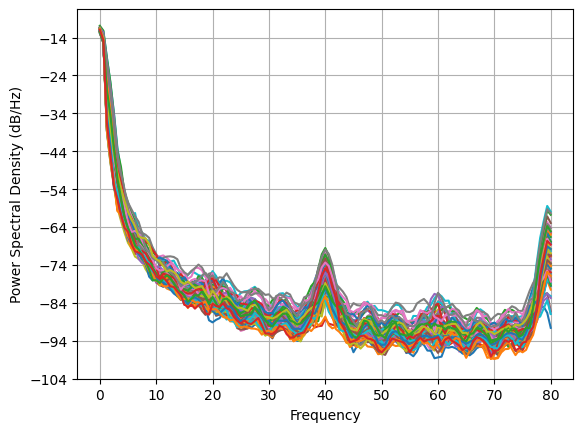

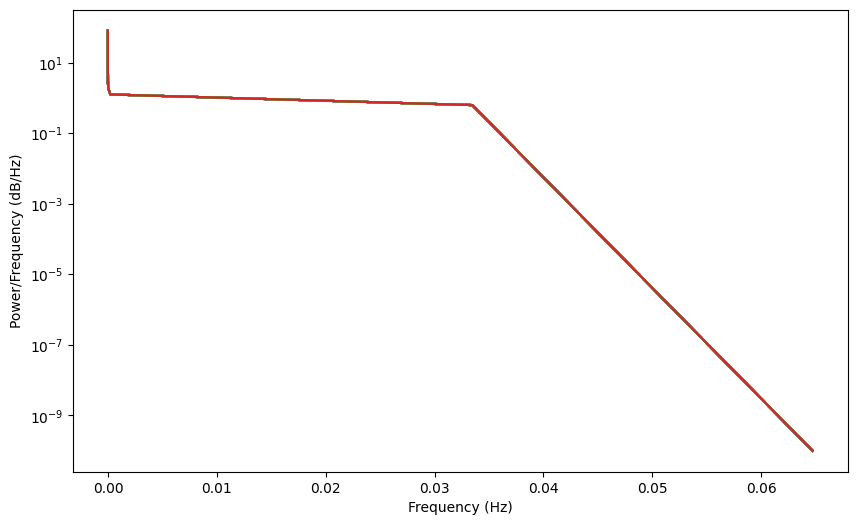

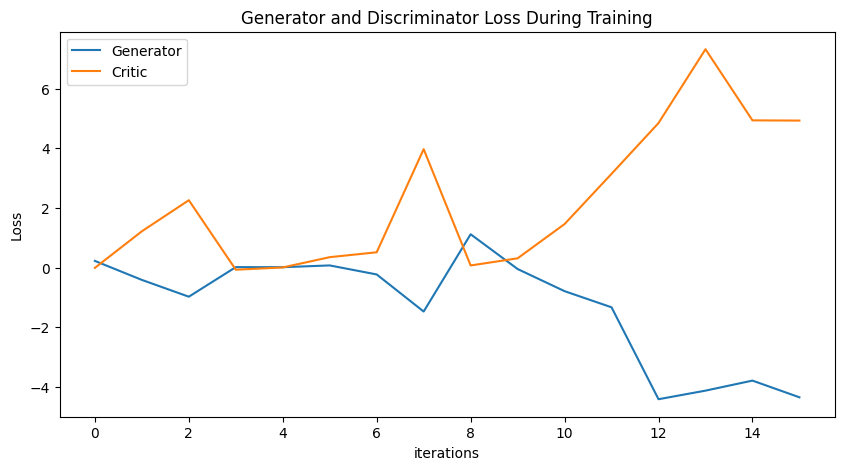

Epoch 20: Critic error ([0.22195497555894933, -0.4153132122301485, -0.9787219020970293, 0.01346942962194551, 0.011300233611493432, 0.07048267647338885, -0.23222624585740934, -1.4764825869473595, 1.1161836817451176, -0.0500233599682241, -0.7932263375695932, -1.334577371626122, -4.418497262344271, -4.130431733093713, -3.7937532036243407, -4.354379833658197, -2.29514576659393, -0.32735848231450065, -1.7333614336764733, -4.0953695104330565, -3.531065827834393]) Generator err ([-0.011442665942013264, 1.2154594659805298, 2.258559226989746, -0.07277479022741318, 0.002776320558041334, 0.3476100265979767, 0.5115180611610413, 3.9718916416168213, 0.06916234642267227, 0.3094883859157562, 1.4587645530700684, 3.143289089202881, 4.847540855407715, 7.324622631072998, 4.937951564788818, 4.930426120758057, 2.7584729194641113, 4.222844123840332, 2.3940041065216064, 0.5441271662712097, 0.25233960151672363])


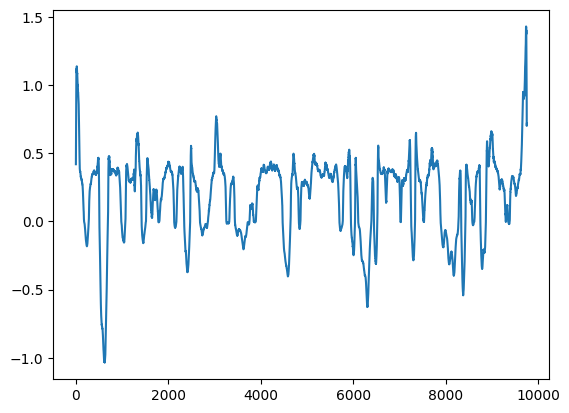

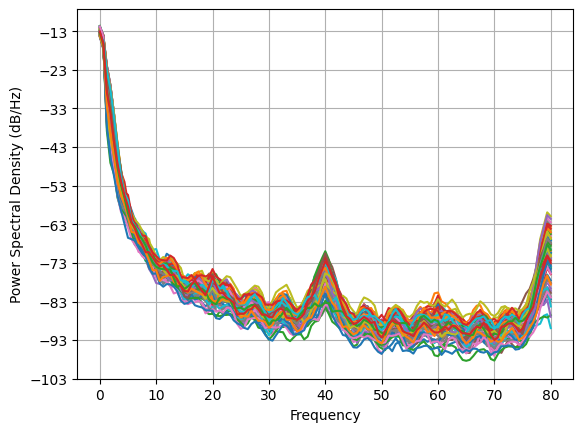

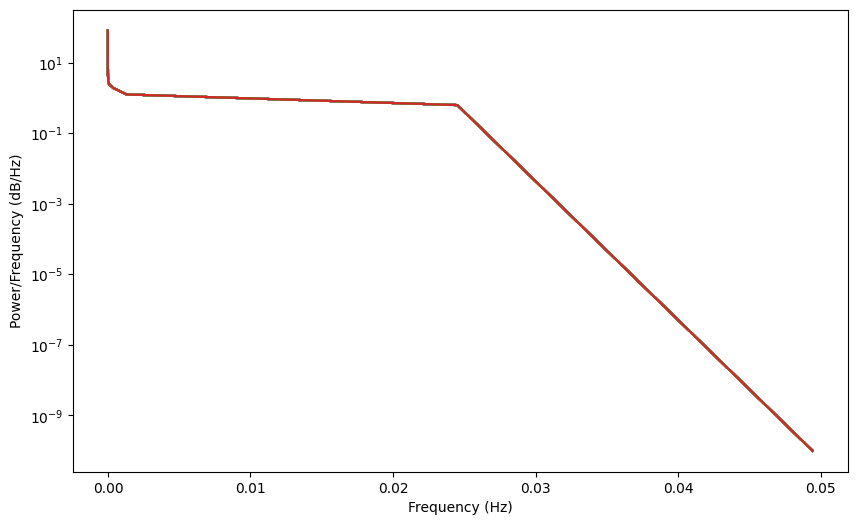

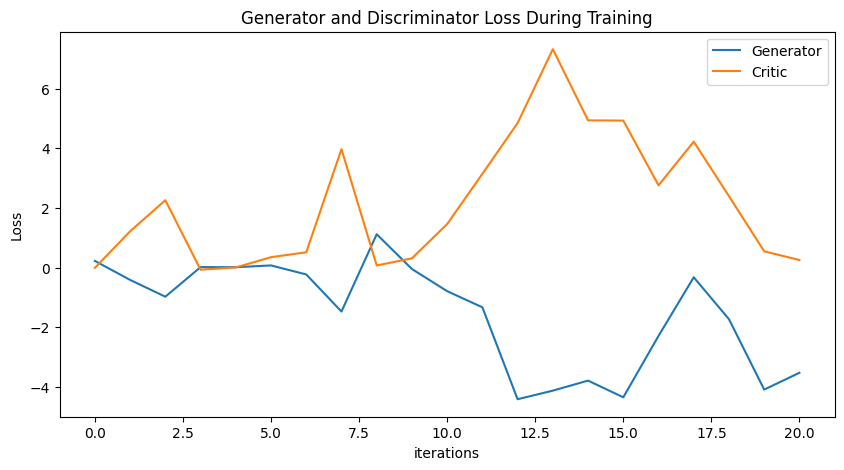

Epoch 25: Critic error ([0.22195497555894933, -0.4153132122301485, -0.9787219020970293, 0.01346942962194551, 0.011300233611493432, 0.07048267647338885, -0.23222624585740934, -1.4764825869473595, 1.1161836817451176, -0.0500233599682241, -0.7932263375695932, -1.334577371626122, -4.418497262344271, -4.130431733093713, -3.7937532036243407, -4.354379833658197, -2.29514576659393, -0.32735848231450065, -1.7333614336764733, -4.0953695104330565, -3.531065827834393, -5.540873088078491, -5.354984963362511, -5.5808793279918865, -4.626592632054204, -4.970174693227414]) Generator err ([-0.011442665942013264, 1.2154594659805298, 2.258559226989746, -0.07277479022741318, 0.002776320558041334, 0.3476100265979767, 0.5115180611610413, 3.9718916416168213, 0.06916234642267227, 0.3094883859157562, 1.4587645530700684, 3.143289089202881, 4.847540855407715, 7.324622631072998, 4.937951564788818, 4.930426120758057, 2.7584729194641113, 4.222844123840332, 2.3940041065216064, 0.5441271662712097, 0.25233960151672363,

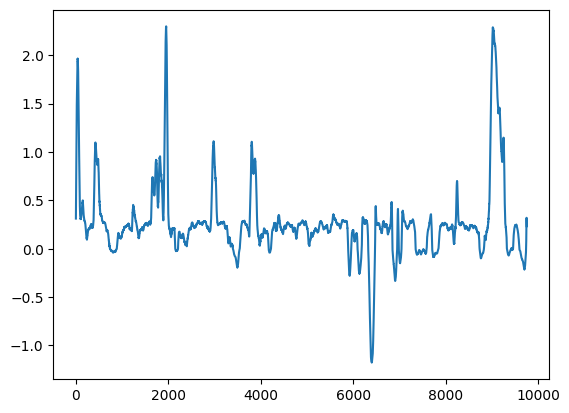

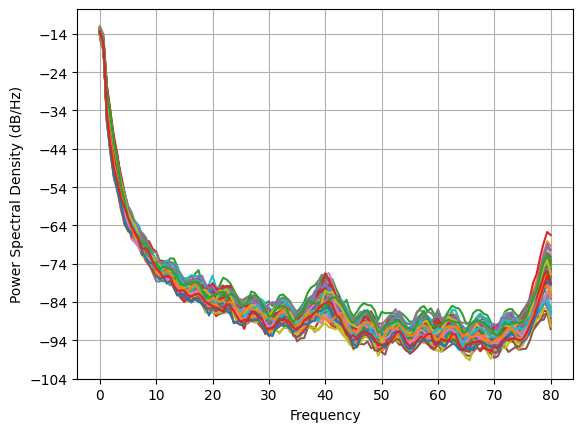

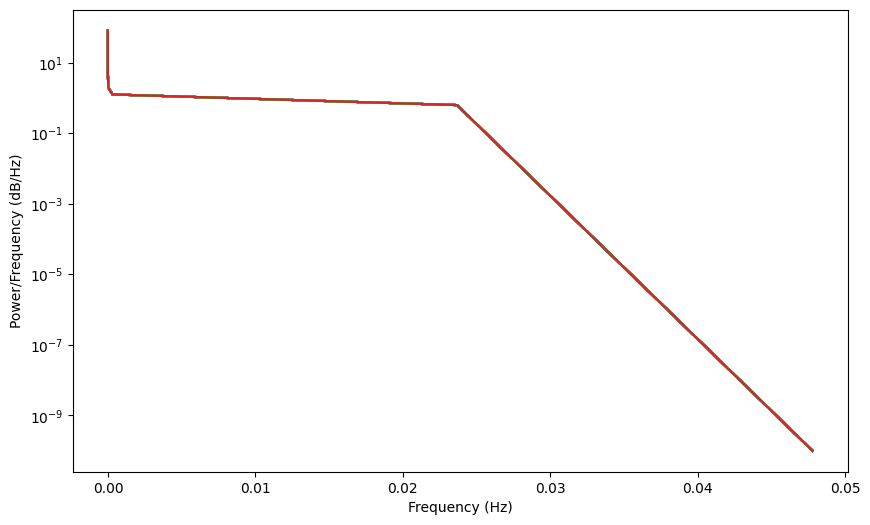

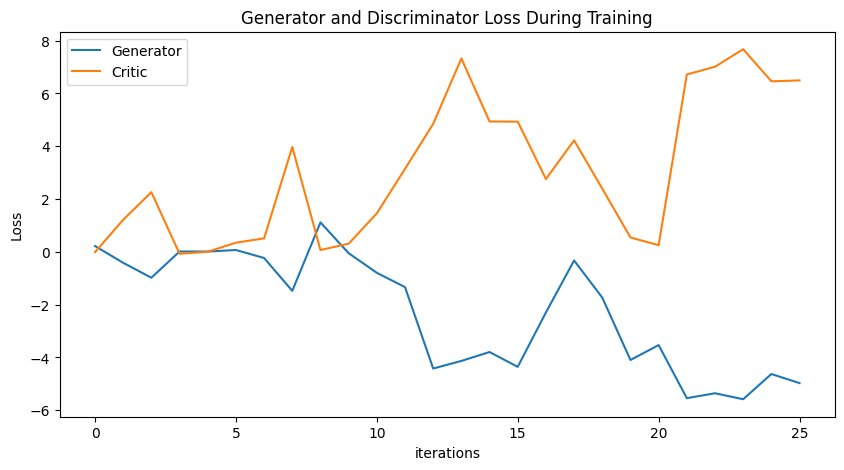

Epoch 30: Critic error ([0.22195497555894933, -0.4153132122301485, -0.9787219020970293, 0.01346942962194551, 0.011300233611493432, 0.07048267647338885, -0.23222624585740934, -1.4764825869473595, 1.1161836817451176, -0.0500233599682241, -0.7932263375695932, -1.334577371626122, -4.418497262344271, -4.130431733093713, -3.7937532036243407, -4.354379833658197, -2.29514576659393, -0.32735848231450065, -1.7333614336764733, -4.0953695104330565, -3.531065827834393, -5.540873088078491, -5.354984963362511, -5.5808793279918865, -4.626592632054204, -4.970174693227414, -5.320990605107744, -5.473928522199047, -2.923855898562905, -3.668481222995474, -4.879458920111108]) Generator err ([-0.011442665942013264, 1.2154594659805298, 2.258559226989746, -0.07277479022741318, 0.002776320558041334, 0.3476100265979767, 0.5115180611610413, 3.9718916416168213, 0.06916234642267227, 0.3094883859157562, 1.4587645530700684, 3.143289089202881, 4.847540855407715, 7.324622631072998, 4.937951564788818, 4.930426120758057,

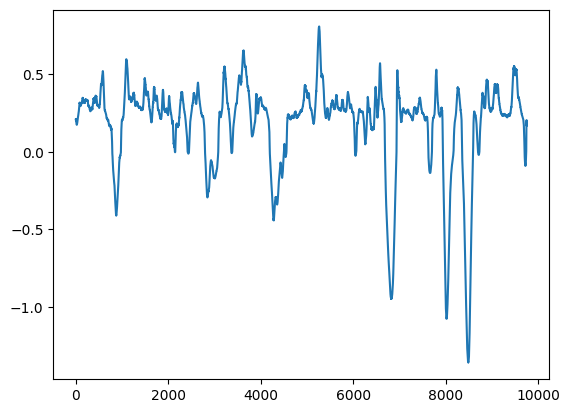

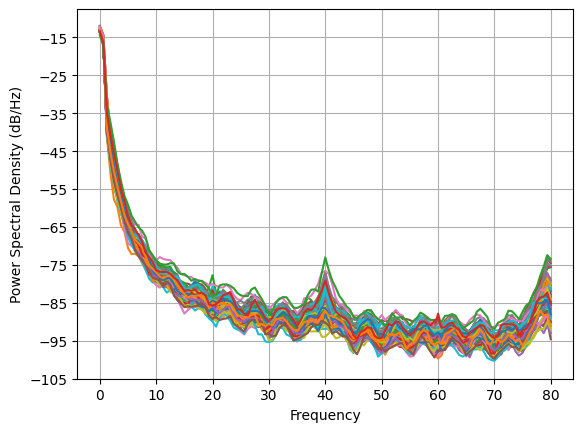

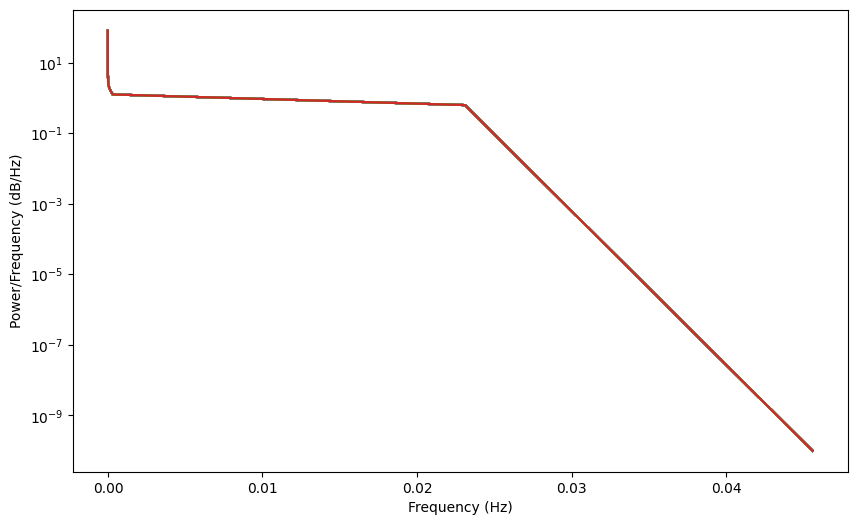

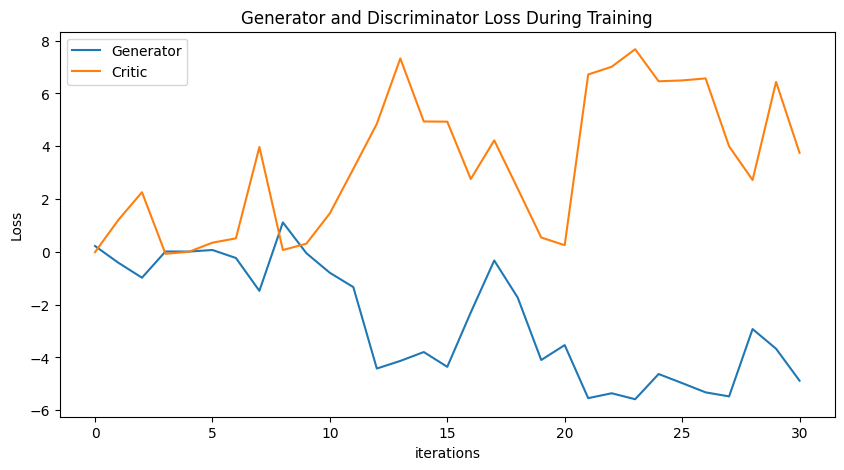

Epoch 35: Critic error ([0.22195497555894933, -0.4153132122301485, -0.9787219020970293, 0.01346942962194551, 0.011300233611493432, 0.07048267647338885, -0.23222624585740934, -1.4764825869473595, 1.1161836817451176, -0.0500233599682241, -0.7932263375695932, -1.334577371626122, -4.418497262344271, -4.130431733093713, -3.7937532036243407, -4.354379833658197, -2.29514576659393, -0.32735848231450065, -1.7333614336764733, -4.0953695104330565, -3.531065827834393, -5.540873088078491, -5.354984963362511, -5.5808793279918865, -4.626592632054204, -4.970174693227414, -5.320990605107744, -5.473928522199047, -2.923855898562905, -3.668481222995474, -4.879458920111108, -4.313130236672821, -4.597334256703661, -4.053943549079588, -4.289237016935871, -4.1449413658666305]) Generator err ([-0.011442665942013264, 1.2154594659805298, 2.258559226989746, -0.07277479022741318, 0.002776320558041334, 0.3476100265979767, 0.5115180611610413, 3.9718916416168213, 0.06916234642267227, 0.3094883859157562, 1.45876455307

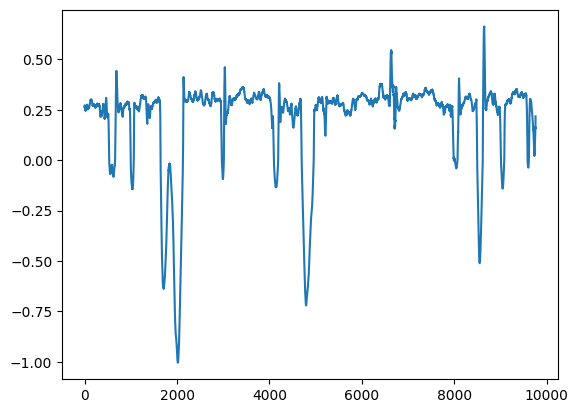

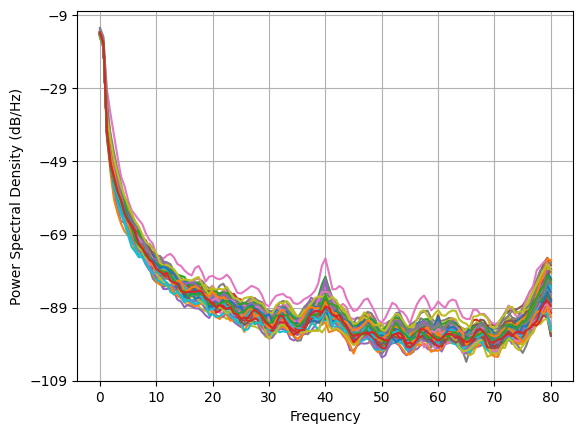

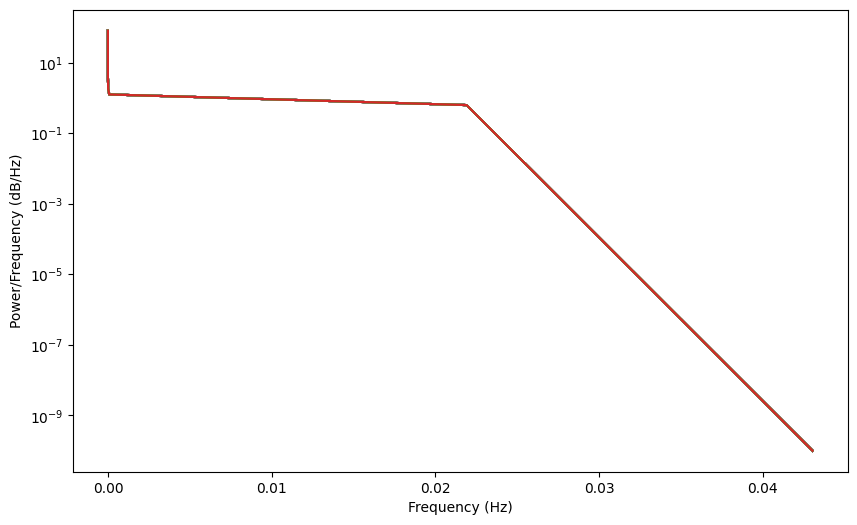

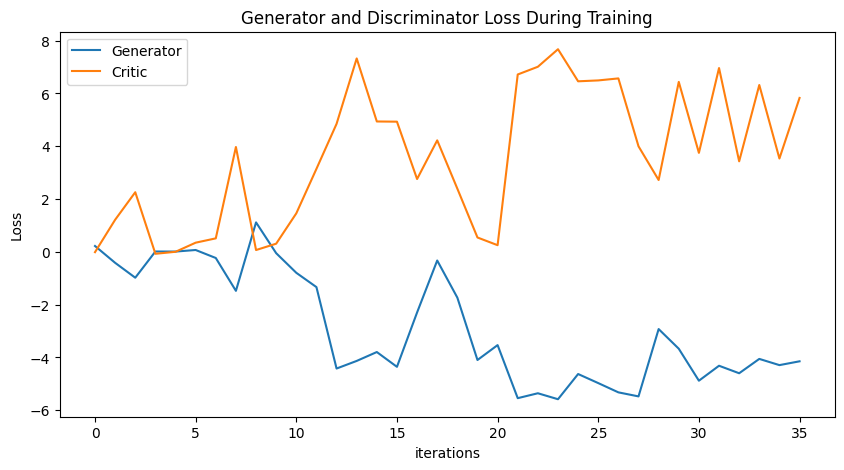

Epoch 40: Critic error ([0.22195497555894933, -0.4153132122301485, -0.9787219020970293, 0.01346942962194551, 0.011300233611493432, 0.07048267647338885, -0.23222624585740934, -1.4764825869473595, 1.1161836817451176, -0.0500233599682241, -0.7932263375695932, -1.334577371626122, -4.418497262344271, -4.130431733093713, -3.7937532036243407, -4.354379833658197, -2.29514576659393, -0.32735848231450065, -1.7333614336764733, -4.0953695104330565, -3.531065827834393, -5.540873088078491, -5.354984963362511, -5.5808793279918865, -4.626592632054204, -4.970174693227414, -5.320990605107744, -5.473928522199047, -2.923855898562905, -3.668481222995474, -4.879458920111108, -4.313130236672821, -4.597334256703661, -4.053943549079588, -4.289237016935871, -4.1449413658666305, -4.121112786642673, -3.569509125750576, -3.8637541243482962, -3.7035777685708755, -3.8199310832591493]) Generator err ([-0.011442665942013264, 1.2154594659805298, 2.258559226989746, -0.07277479022741318, 0.002776320558041334, 0.347610026

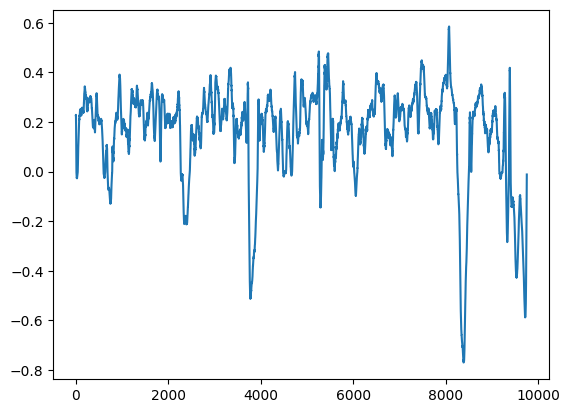

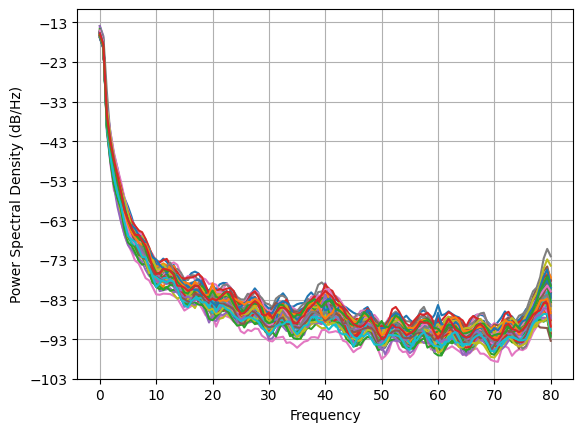

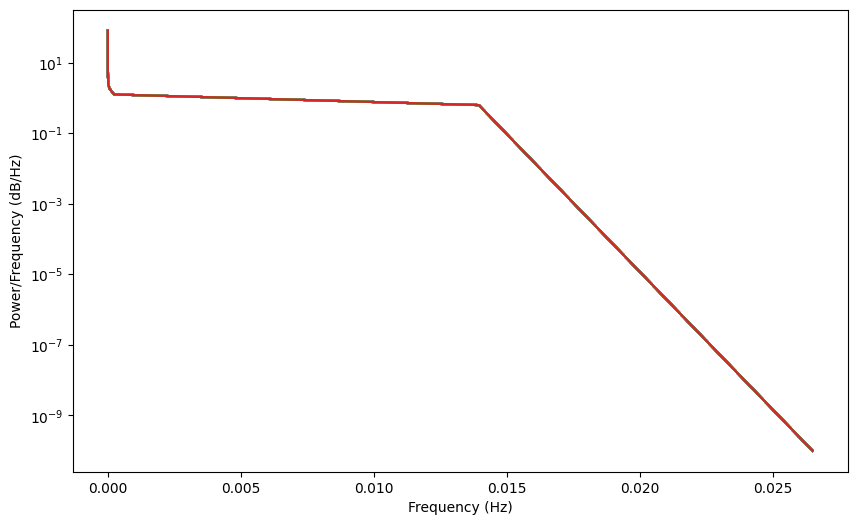

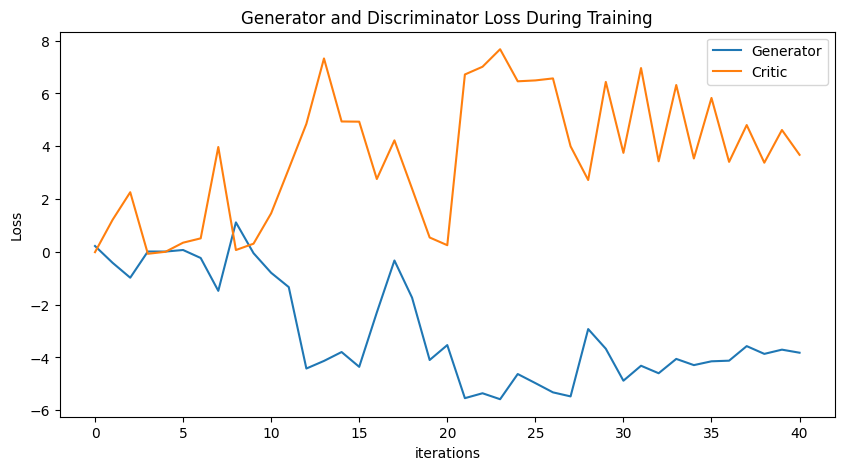

Epoch 45: Critic error ([0.22195497555894933, -0.4153132122301485, -0.9787219020970293, 0.01346942962194551, 0.011300233611493432, 0.07048267647338885, -0.23222624585740934, -1.4764825869473595, 1.1161836817451176, -0.0500233599682241, -0.7932263375695932, -1.334577371626122, -4.418497262344271, -4.130431733093713, -3.7937532036243407, -4.354379833658197, -2.29514576659393, -0.32735848231450065, -1.7333614336764733, -4.0953695104330565, -3.531065827834393, -5.540873088078491, -5.354984963362511, -5.5808793279918865, -4.626592632054204, -4.970174693227414, -5.320990605107744, -5.473928522199047, -2.923855898562905, -3.668481222995474, -4.879458920111108, -4.313130236672821, -4.597334256703661, -4.053943549079588, -4.289237016935871, -4.1449413658666305, -4.121112786642673, -3.569509125750576, -3.8637541243482962, -3.7035777685708755, -3.8199310832591493, -2.540070795934465, -4.383906766464085, -3.9133863654201564, -3.88572674420402, -3.4764059253663637]) Generator err ([-0.0114426659420

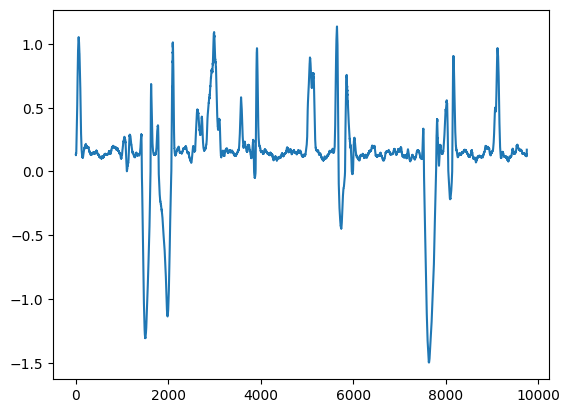

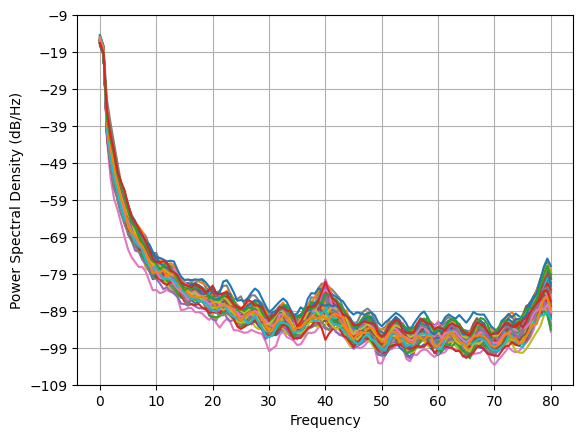

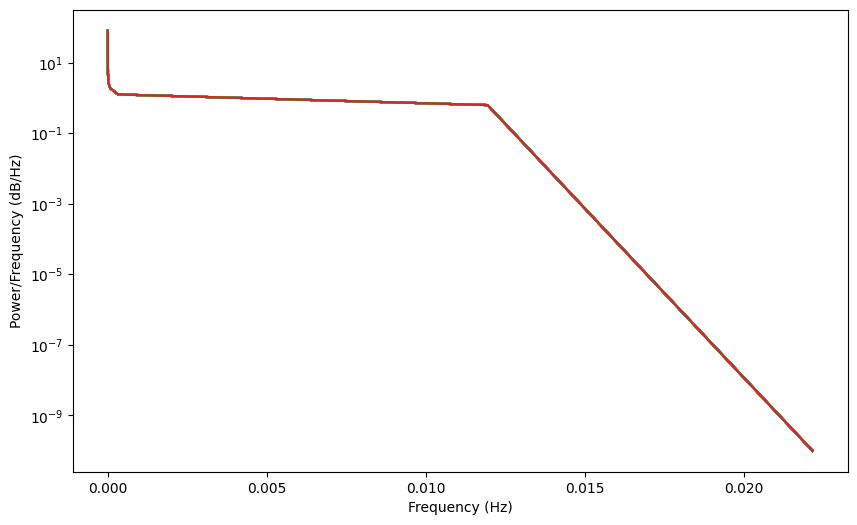

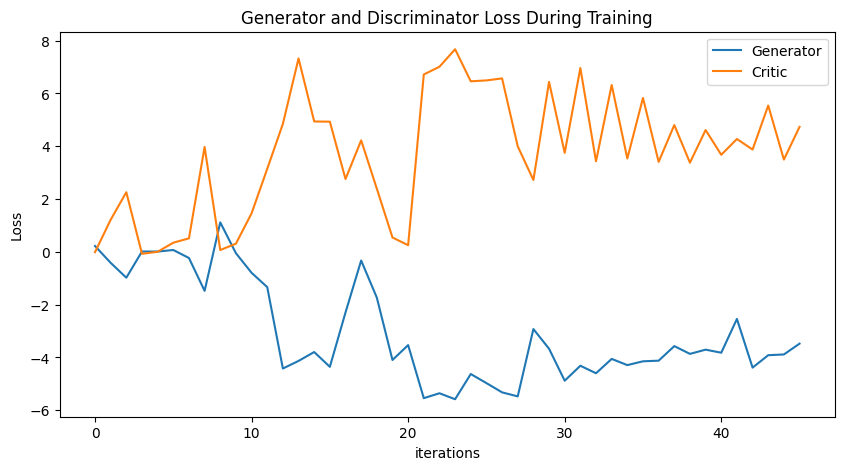

Epoch 50: Critic error ([0.22195497555894933, -0.4153132122301485, -0.9787219020970293, 0.01346942962194551, 0.011300233611493432, 0.07048267647338885, -0.23222624585740934, -1.4764825869473595, 1.1161836817451176, -0.0500233599682241, -0.7932263375695932, -1.334577371626122, -4.418497262344271, -4.130431733093713, -3.7937532036243407, -4.354379833658197, -2.29514576659393, -0.32735848231450065, -1.7333614336764733, -4.0953695104330565, -3.531065827834393, -5.540873088078491, -5.354984963362511, -5.5808793279918865, -4.626592632054204, -4.970174693227414, -5.320990605107744, -5.473928522199047, -2.923855898562905, -3.668481222995474, -4.879458920111108, -4.313130236672821, -4.597334256703661, -4.053943549079588, -4.289237016935871, -4.1449413658666305, -4.121112786642673, -3.569509125750576, -3.8637541243482962, -3.7035777685708755, -3.8199310832591493, -2.540070795934465, -4.383906766464085, -3.9133863654201564, -3.88572674420402, -3.4764059253663637, -3.535119344985529, -3.0143142466

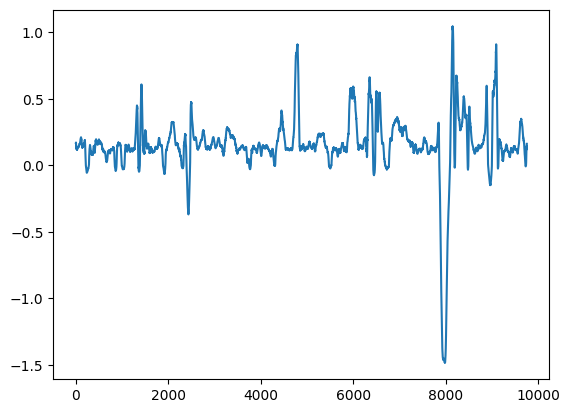

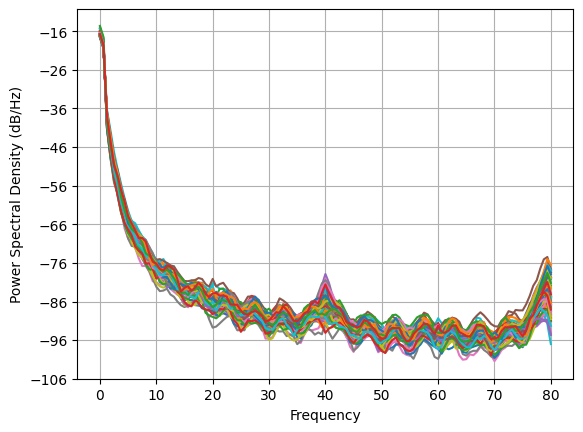

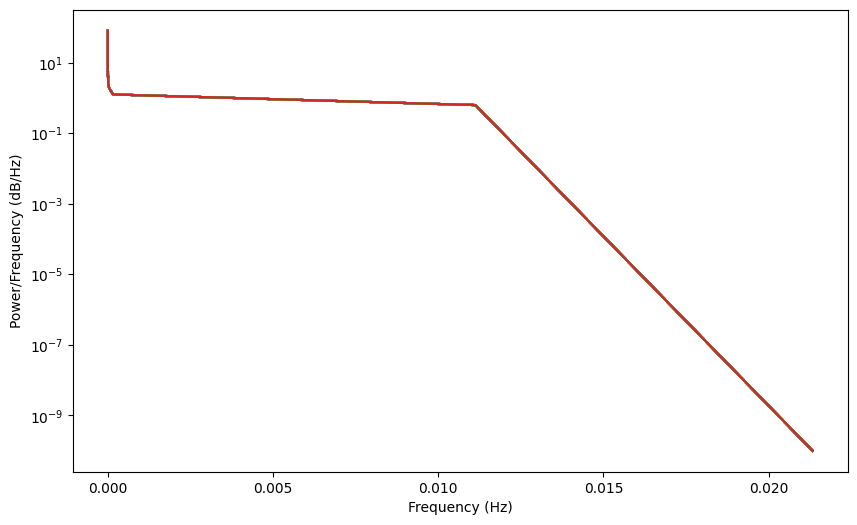

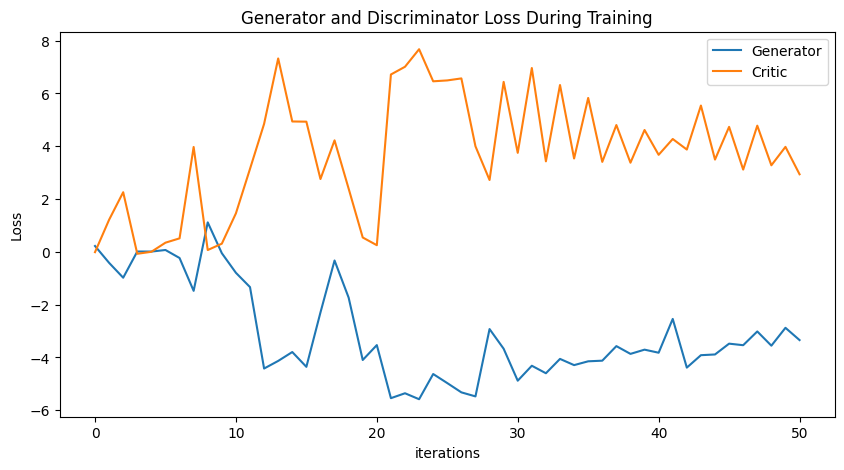

Epoch 55: Critic error ([0.22195497555894933, -0.4153132122301485, -0.9787219020970293, 0.01346942962194551, 0.011300233611493432, 0.07048267647338885, -0.23222624585740934, -1.4764825869473595, 1.1161836817451176, -0.0500233599682241, -0.7932263375695932, -1.334577371626122, -4.418497262344271, -4.130431733093713, -3.7937532036243407, -4.354379833658197, -2.29514576659393, -0.32735848231450065, -1.7333614336764733, -4.0953695104330565, -3.531065827834393, -5.540873088078491, -5.354984963362511, -5.5808793279918865, -4.626592632054204, -4.970174693227414, -5.320990605107744, -5.473928522199047, -2.923855898562905, -3.668481222995474, -4.879458920111108, -4.313130236672821, -4.597334256703661, -4.053943549079588, -4.289237016935871, -4.1449413658666305, -4.121112786642673, -3.569509125750576, -3.8637541243482962, -3.7035777685708755, -3.8199310832591493, -2.540070795934465, -4.383906766464085, -3.9133863654201564, -3.88572674420402, -3.4764059253663637, -3.535119344985529, -3.0143142466

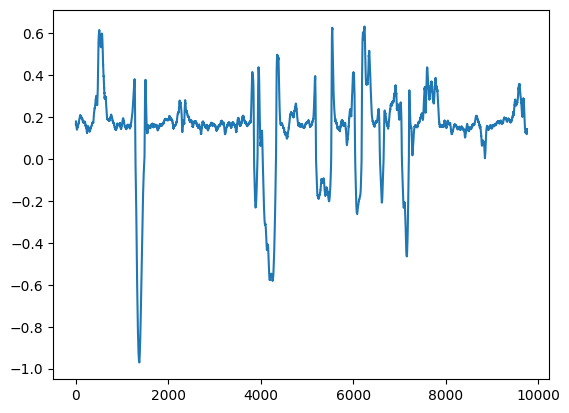

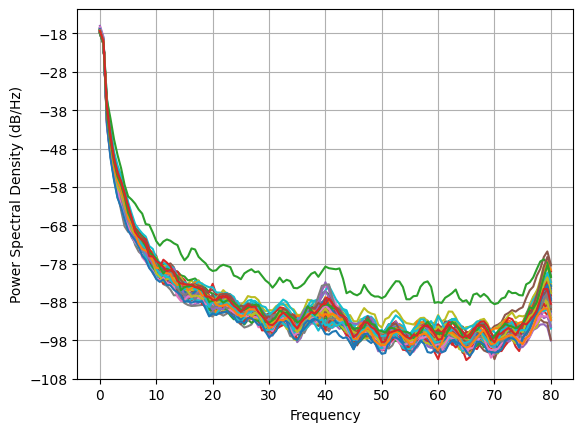

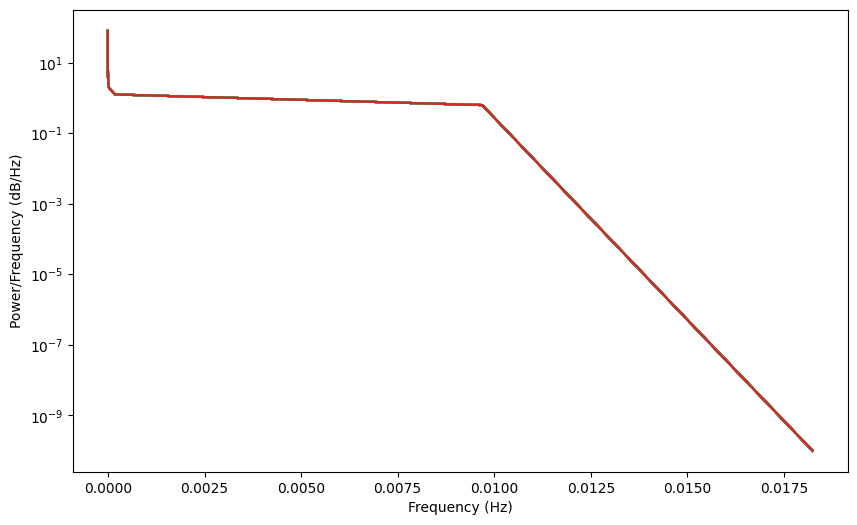

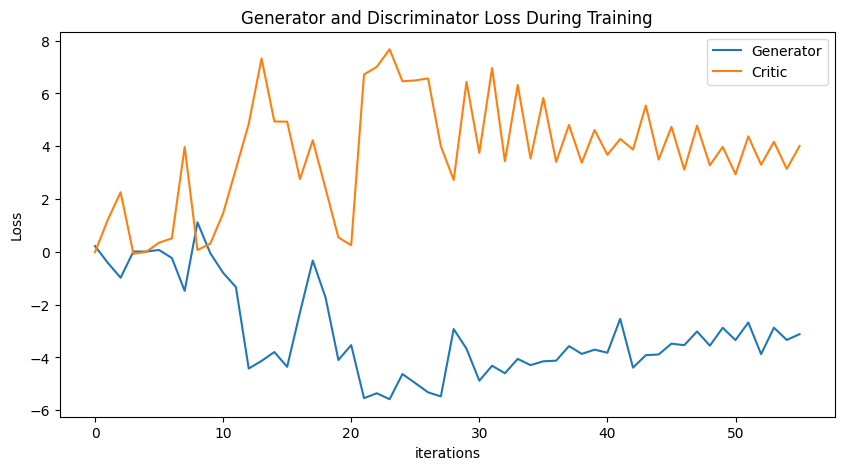

Epoch 60: Critic error ([0.22195497555894933, -0.4153132122301485, -0.9787219020970293, 0.01346942962194551, 0.011300233611493432, 0.07048267647338885, -0.23222624585740934, -1.4764825869473595, 1.1161836817451176, -0.0500233599682241, -0.7932263375695932, -1.334577371626122, -4.418497262344271, -4.130431733093713, -3.7937532036243407, -4.354379833658197, -2.29514576659393, -0.32735848231450065, -1.7333614336764733, -4.0953695104330565, -3.531065827834393, -5.540873088078491, -5.354984963362511, -5.5808793279918865, -4.626592632054204, -4.970174693227414, -5.320990605107744, -5.473928522199047, -2.923855898562905, -3.668481222995474, -4.879458920111108, -4.313130236672821, -4.597334256703661, -4.053943549079588, -4.289237016935871, -4.1449413658666305, -4.121112786642673, -3.569509125750576, -3.8637541243482962, -3.7035777685708755, -3.8199310832591493, -2.540070795934465, -4.383906766464085, -3.9133863654201564, -3.88572674420402, -3.4764059253663637, -3.535119344985529, -3.0143142466

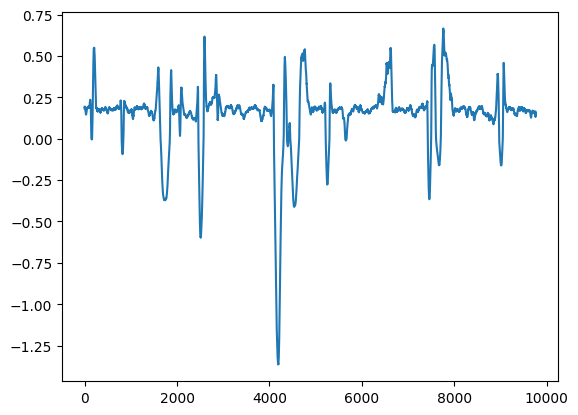

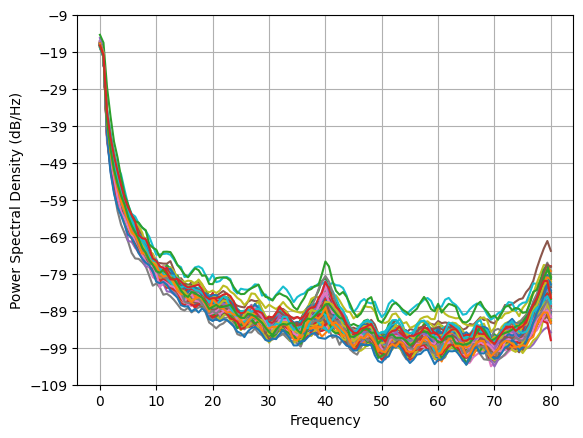

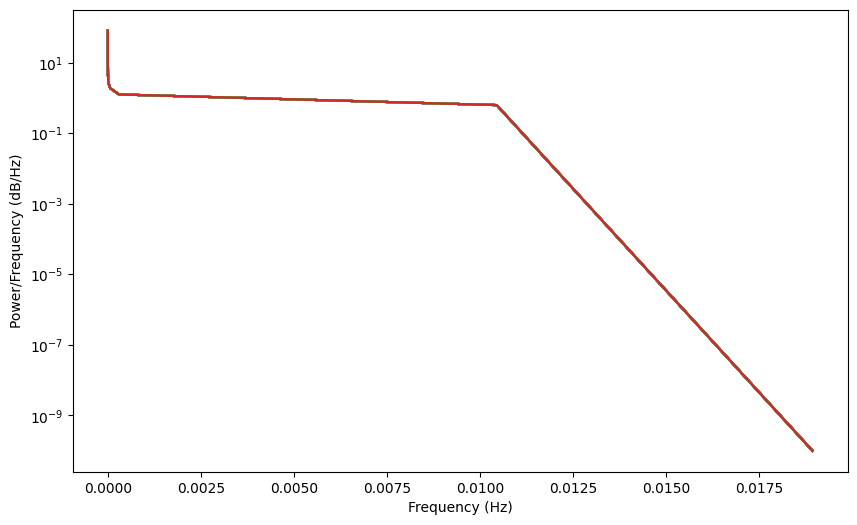

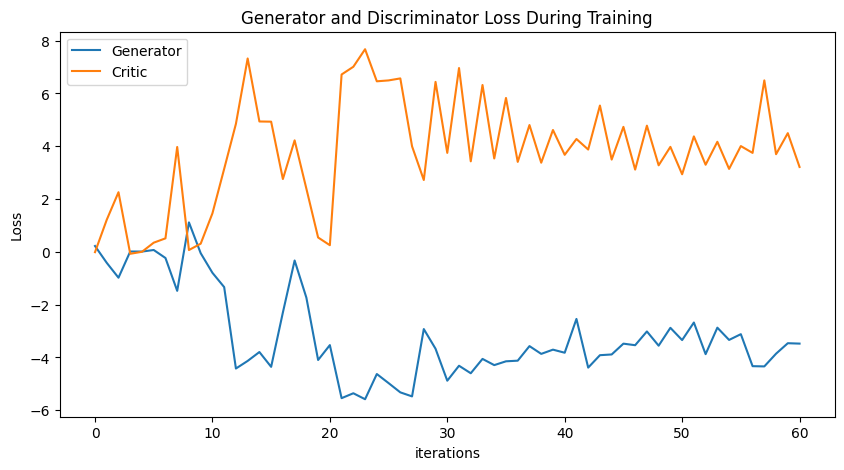

Epoch 65: Critic error ([0.22195497555894933, -0.4153132122301485, -0.9787219020970293, 0.01346942962194551, 0.011300233611493432, 0.07048267647338885, -0.23222624585740934, -1.4764825869473595, 1.1161836817451176, -0.0500233599682241, -0.7932263375695932, -1.334577371626122, -4.418497262344271, -4.130431733093713, -3.7937532036243407, -4.354379833658197, -2.29514576659393, -0.32735848231450065, -1.7333614336764733, -4.0953695104330565, -3.531065827834393, -5.540873088078491, -5.354984963362511, -5.5808793279918865, -4.626592632054204, -4.970174693227414, -5.320990605107744, -5.473928522199047, -2.923855898562905, -3.668481222995474, -4.879458920111108, -4.313130236672821, -4.597334256703661, -4.053943549079588, -4.289237016935871, -4.1449413658666305, -4.121112786642673, -3.569509125750576, -3.8637541243482962, -3.7035777685708755, -3.8199310832591493, -2.540070795934465, -4.383906766464085, -3.9133863654201564, -3.88572674420402, -3.4764059253663637, -3.535119344985529, -3.0143142466

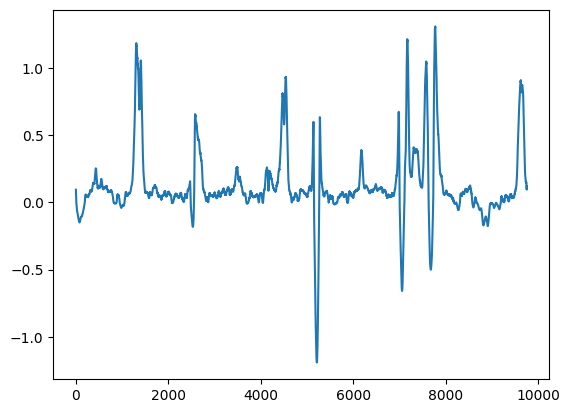

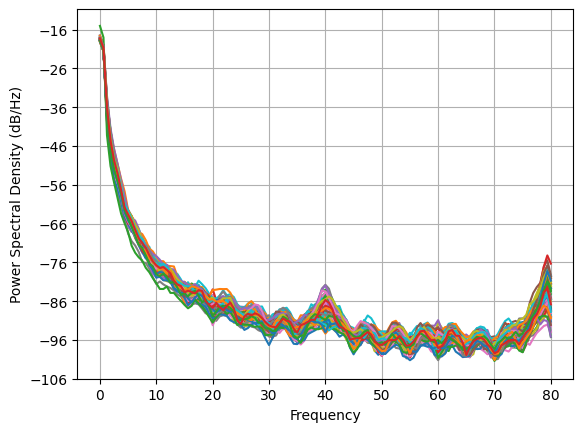

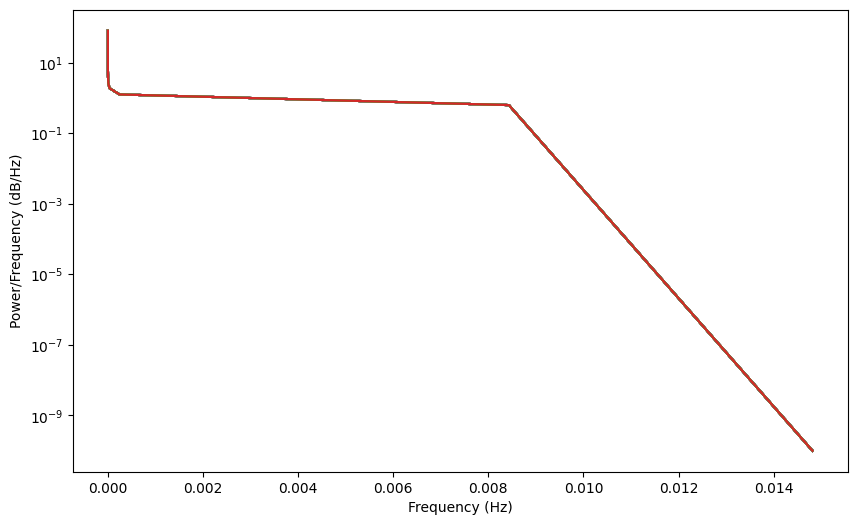

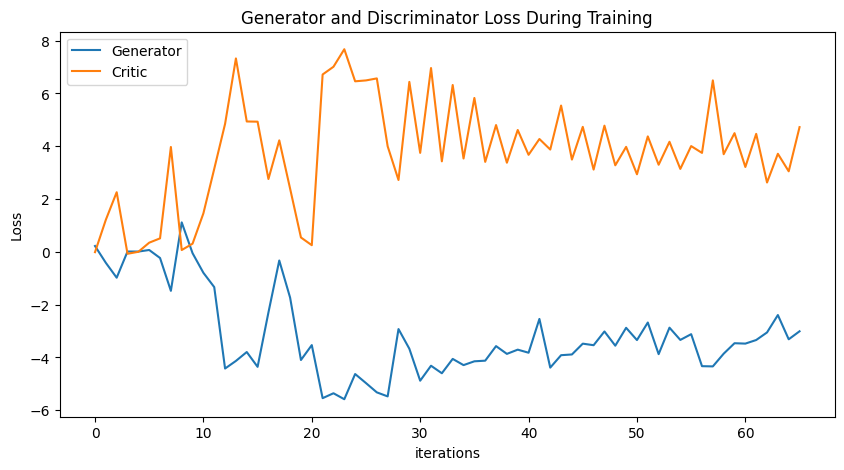

Epoch 70: Critic error ([0.22195497555894933, -0.4153132122301485, -0.9787219020970293, 0.01346942962194551, 0.011300233611493432, 0.07048267647338885, -0.23222624585740934, -1.4764825869473595, 1.1161836817451176, -0.0500233599682241, -0.7932263375695932, -1.334577371626122, -4.418497262344271, -4.130431733093713, -3.7937532036243407, -4.354379833658197, -2.29514576659393, -0.32735848231450065, -1.7333614336764733, -4.0953695104330565, -3.531065827834393, -5.540873088078491, -5.354984963362511, -5.5808793279918865, -4.626592632054204, -4.970174693227414, -5.320990605107744, -5.473928522199047, -2.923855898562905, -3.668481222995474, -4.879458920111108, -4.313130236672821, -4.597334256703661, -4.053943549079588, -4.289237016935871, -4.1449413658666305, -4.121112786642673, -3.569509125750576, -3.8637541243482962, -3.7035777685708755, -3.8199310832591493, -2.540070795934465, -4.383906766464085, -3.9133863654201564, -3.88572674420402, -3.4764059253663637, -3.535119344985529, -3.0143142466

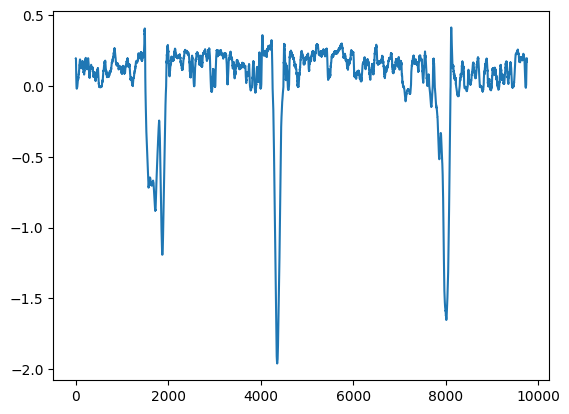

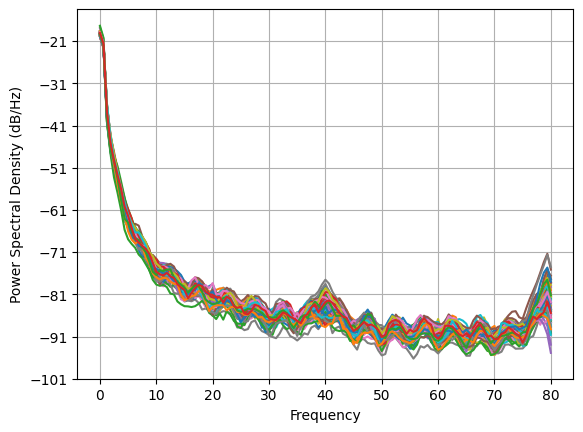

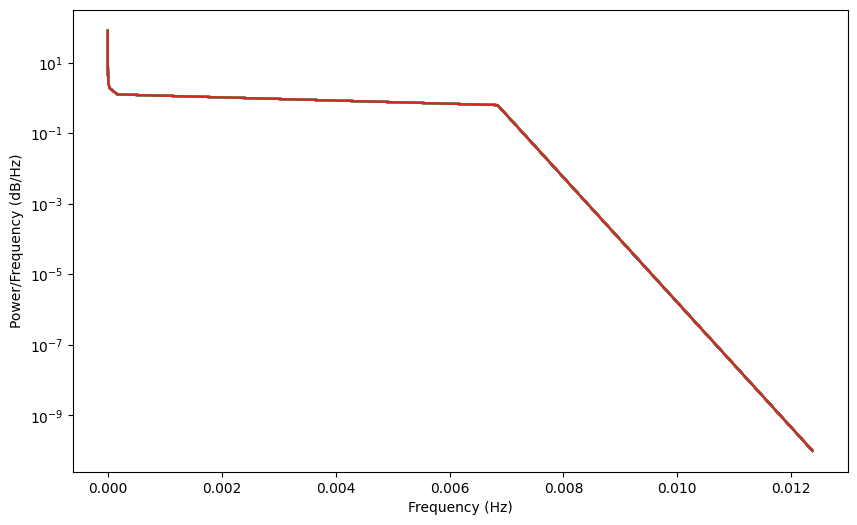

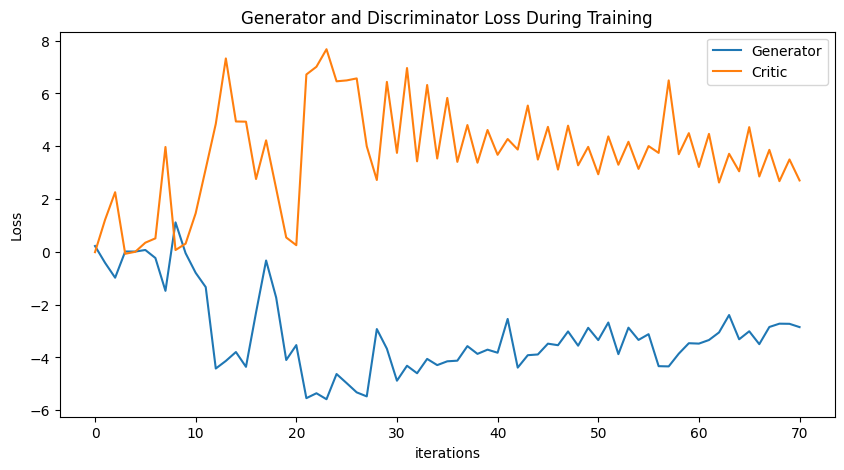

Epoch 75: Critic error ([0.22195497555894933, -0.4153132122301485, -0.9787219020970293, 0.01346942962194551, 0.011300233611493432, 0.07048267647338885, -0.23222624585740934, -1.4764825869473595, 1.1161836817451176, -0.0500233599682241, -0.7932263375695932, -1.334577371626122, -4.418497262344271, -4.130431733093713, -3.7937532036243407, -4.354379833658197, -2.29514576659393, -0.32735848231450065, -1.7333614336764733, -4.0953695104330565, -3.531065827834393, -5.540873088078491, -5.354984963362511, -5.5808793279918865, -4.626592632054204, -4.970174693227414, -5.320990605107744, -5.473928522199047, -2.923855898562905, -3.668481222995474, -4.879458920111108, -4.313130236672821, -4.597334256703661, -4.053943549079588, -4.289237016935871, -4.1449413658666305, -4.121112786642673, -3.569509125750576, -3.8637541243482962, -3.7035777685708755, -3.8199310832591493, -2.540070795934465, -4.383906766464085, -3.9133863654201564, -3.88572674420402, -3.4764059253663637, -3.535119344985529, -3.0143142466

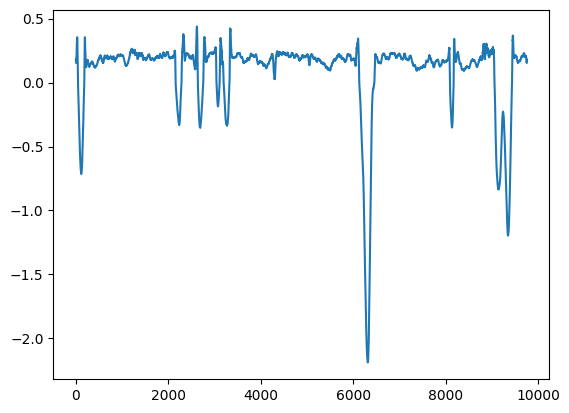

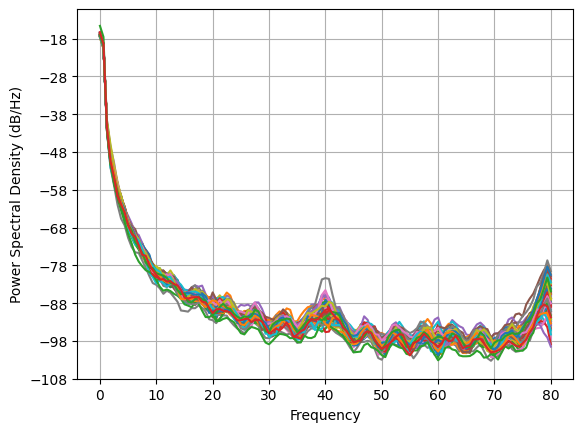

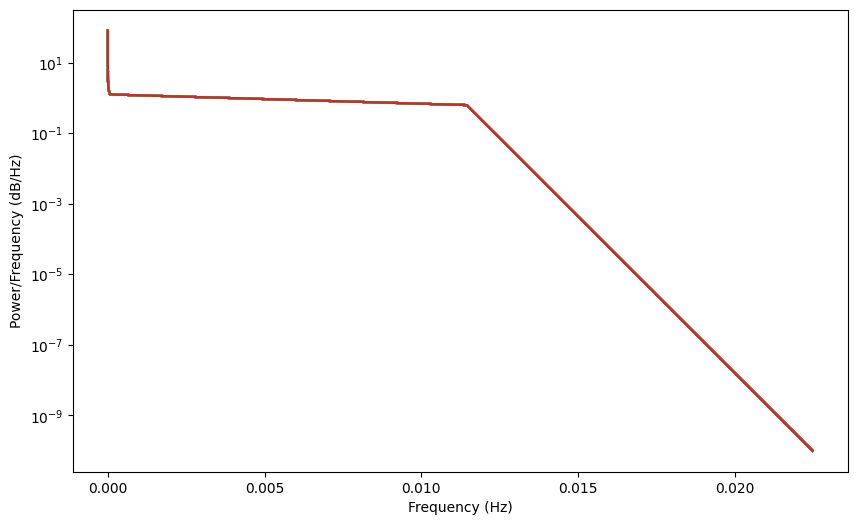

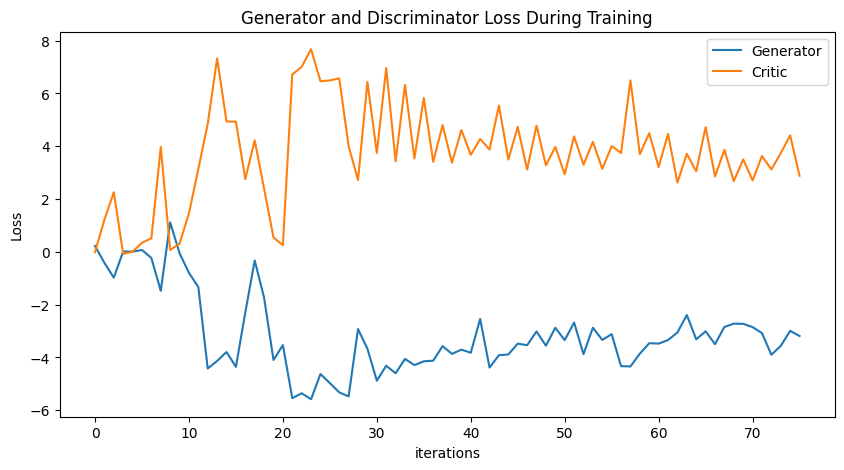

Epoch 80: Critic error ([0.22195497555894933, -0.4153132122301485, -0.9787219020970293, 0.01346942962194551, 0.011300233611493432, 0.07048267647338885, -0.23222624585740934, -1.4764825869473595, 1.1161836817451176, -0.0500233599682241, -0.7932263375695932, -1.334577371626122, -4.418497262344271, -4.130431733093713, -3.7937532036243407, -4.354379833658197, -2.29514576659393, -0.32735848231450065, -1.7333614336764733, -4.0953695104330565, -3.531065827834393, -5.540873088078491, -5.354984963362511, -5.5808793279918865, -4.626592632054204, -4.970174693227414, -5.320990605107744, -5.473928522199047, -2.923855898562905, -3.668481222995474, -4.879458920111108, -4.313130236672821, -4.597334256703661, -4.053943549079588, -4.289237016935871, -4.1449413658666305, -4.121112786642673, -3.569509125750576, -3.8637541243482962, -3.7035777685708755, -3.8199310832591493, -2.540070795934465, -4.383906766464085, -3.9133863654201564, -3.88572674420402, -3.4764059253663637, -3.535119344985529, -3.0143142466

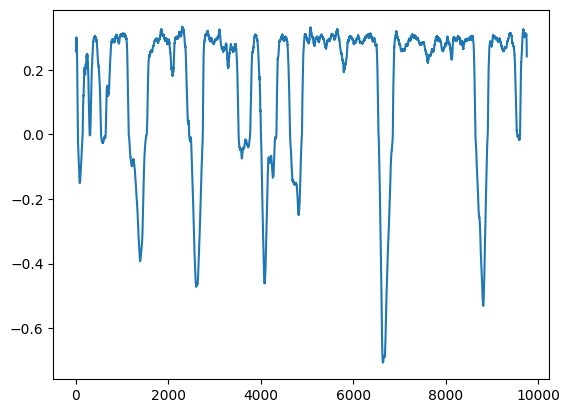

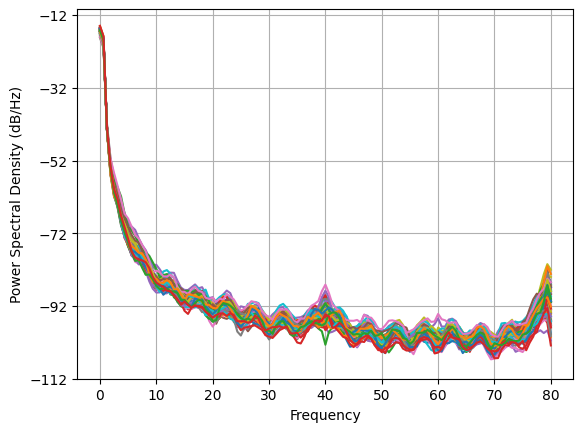

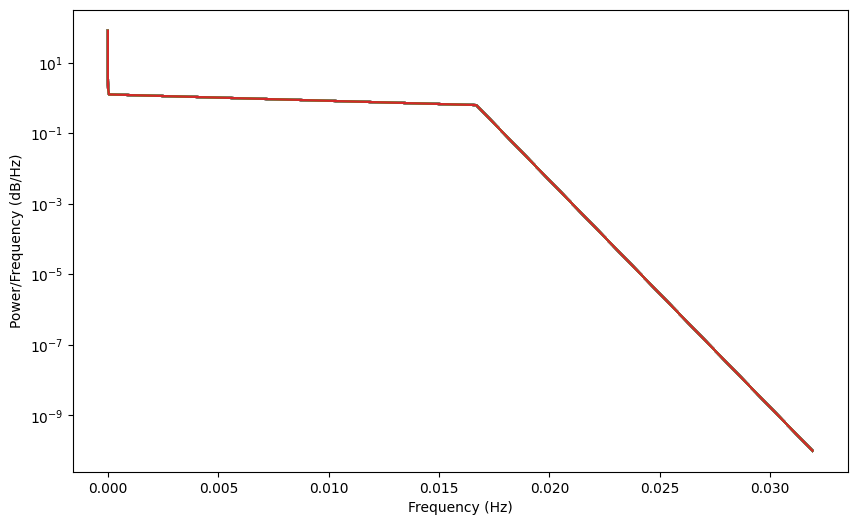

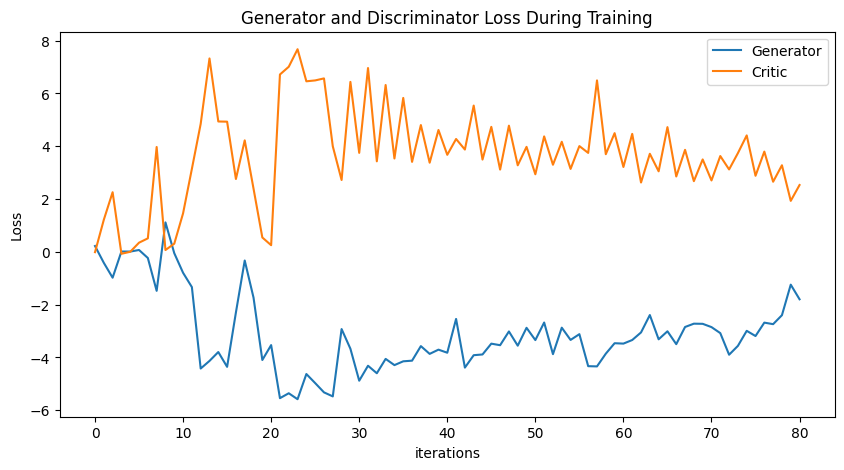

Epoch 85: Critic error ([0.22195497555894933, -0.4153132122301485, -0.9787219020970293, 0.01346942962194551, 0.011300233611493432, 0.07048267647338885, -0.23222624585740934, -1.4764825869473595, 1.1161836817451176, -0.0500233599682241, -0.7932263375695932, -1.334577371626122, -4.418497262344271, -4.130431733093713, -3.7937532036243407, -4.354379833658197, -2.29514576659393, -0.32735848231450065, -1.7333614336764733, -4.0953695104330565, -3.531065827834393, -5.540873088078491, -5.354984963362511, -5.5808793279918865, -4.626592632054204, -4.970174693227414, -5.320990605107744, -5.473928522199047, -2.923855898562905, -3.668481222995474, -4.879458920111108, -4.313130236672821, -4.597334256703661, -4.053943549079588, -4.289237016935871, -4.1449413658666305, -4.121112786642673, -3.569509125750576, -3.8637541243482962, -3.7035777685708755, -3.8199310832591493, -2.540070795934465, -4.383906766464085, -3.9133863654201564, -3.88572674420402, -3.4764059253663637, -3.535119344985529, -3.0143142466

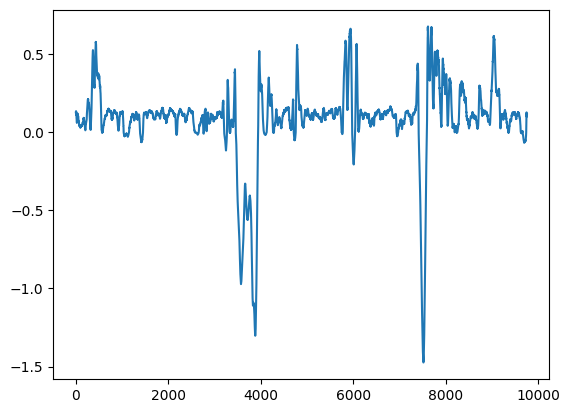

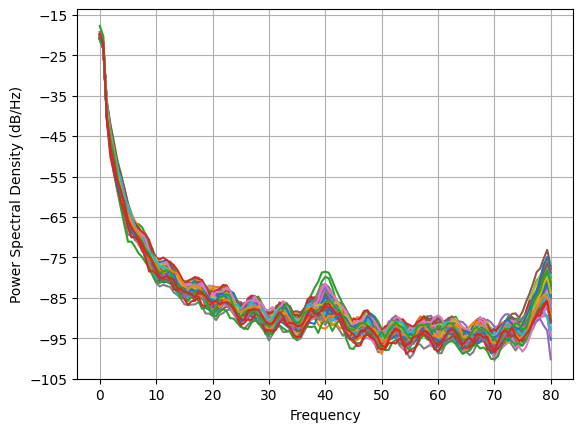

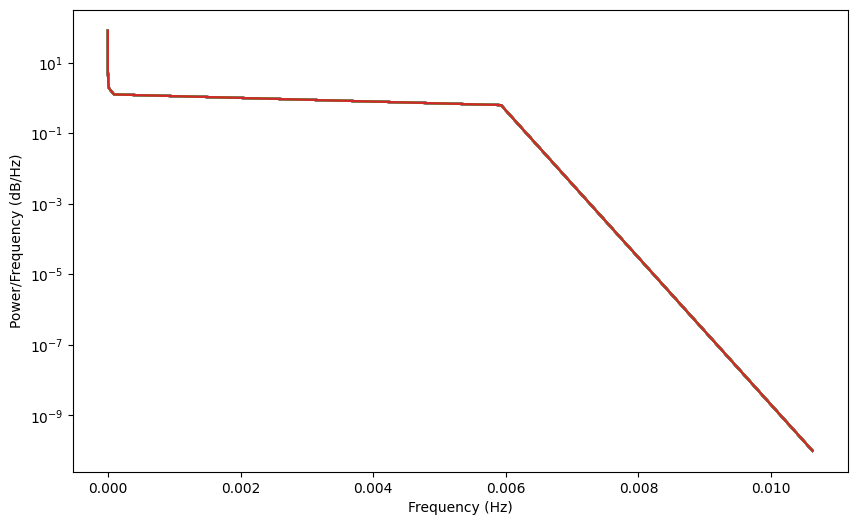

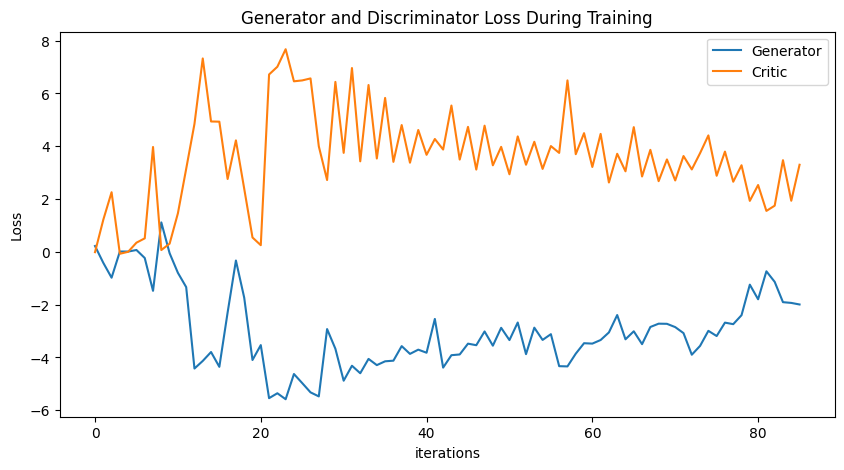

Epoch 90: Critic error ([0.22195497555894933, -0.4153132122301485, -0.9787219020970293, 0.01346942962194551, 0.011300233611493432, 0.07048267647338885, -0.23222624585740934, -1.4764825869473595, 1.1161836817451176, -0.0500233599682241, -0.7932263375695932, -1.334577371626122, -4.418497262344271, -4.130431733093713, -3.7937532036243407, -4.354379833658197, -2.29514576659393, -0.32735848231450065, -1.7333614336764733, -4.0953695104330565, -3.531065827834393, -5.540873088078491, -5.354984963362511, -5.5808793279918865, -4.626592632054204, -4.970174693227414, -5.320990605107744, -5.473928522199047, -2.923855898562905, -3.668481222995474, -4.879458920111108, -4.313130236672821, -4.597334256703661, -4.053943549079588, -4.289237016935871, -4.1449413658666305, -4.121112786642673, -3.569509125750576, -3.8637541243482962, -3.7035777685708755, -3.8199310832591493, -2.540070795934465, -4.383906766464085, -3.9133863654201564, -3.88572674420402, -3.4764059253663637, -3.535119344985529, -3.0143142466

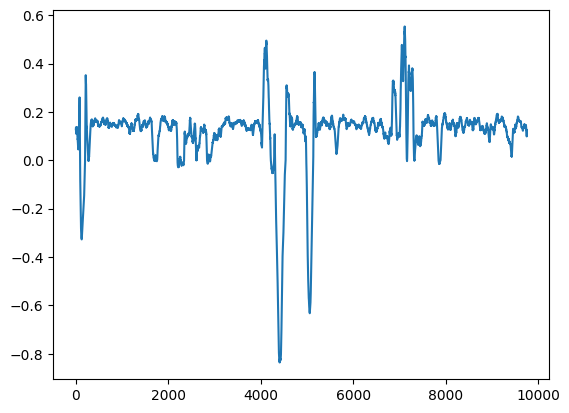

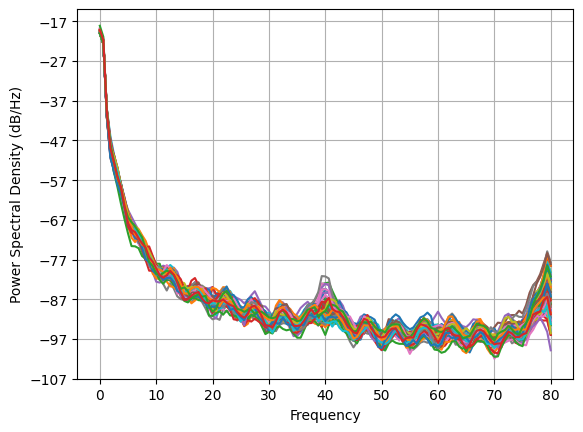

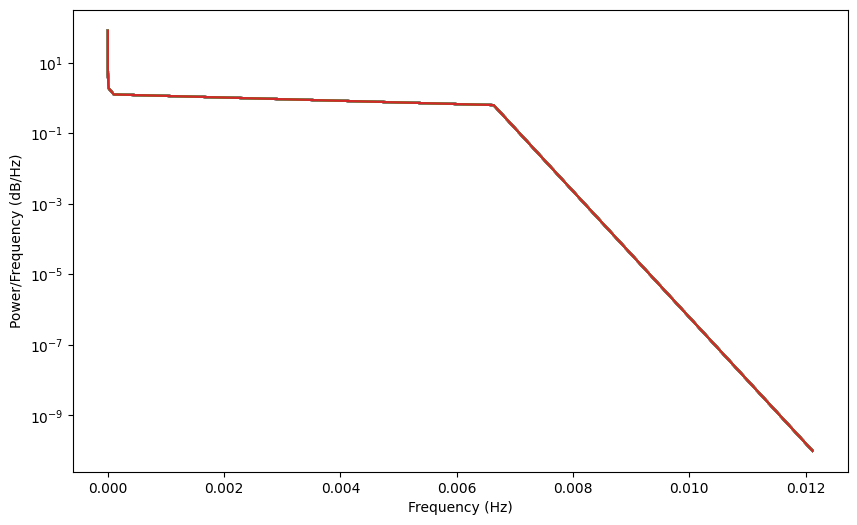

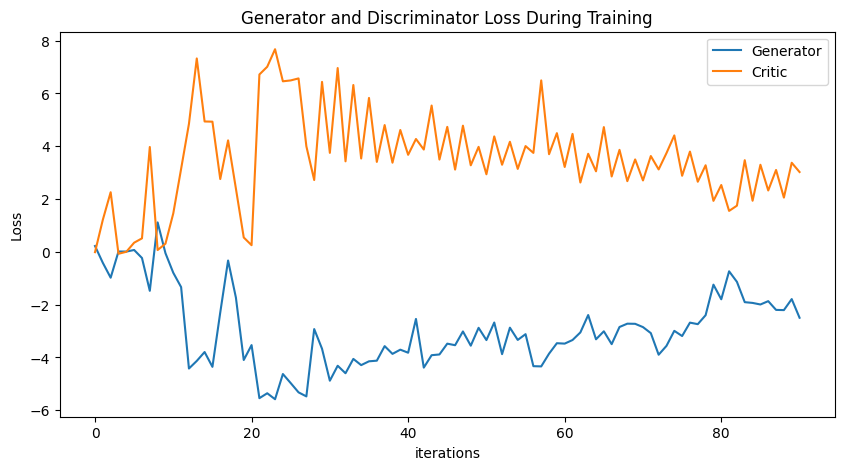

Epoch 95: Critic error ([0.22195497555894933, -0.4153132122301485, -0.9787219020970293, 0.01346942962194551, 0.011300233611493432, 0.07048267647338885, -0.23222624585740934, -1.4764825869473595, 1.1161836817451176, -0.0500233599682241, -0.7932263375695932, -1.334577371626122, -4.418497262344271, -4.130431733093713, -3.7937532036243407, -4.354379833658197, -2.29514576659393, -0.32735848231450065, -1.7333614336764733, -4.0953695104330565, -3.531065827834393, -5.540873088078491, -5.354984963362511, -5.5808793279918865, -4.626592632054204, -4.970174693227414, -5.320990605107744, -5.473928522199047, -2.923855898562905, -3.668481222995474, -4.879458920111108, -4.313130236672821, -4.597334256703661, -4.053943549079588, -4.289237016935871, -4.1449413658666305, -4.121112786642673, -3.569509125750576, -3.8637541243482962, -3.7035777685708755, -3.8199310832591493, -2.540070795934465, -4.383906766464085, -3.9133863654201564, -3.88572674420402, -3.4764059253663637, -3.535119344985529, -3.0143142466

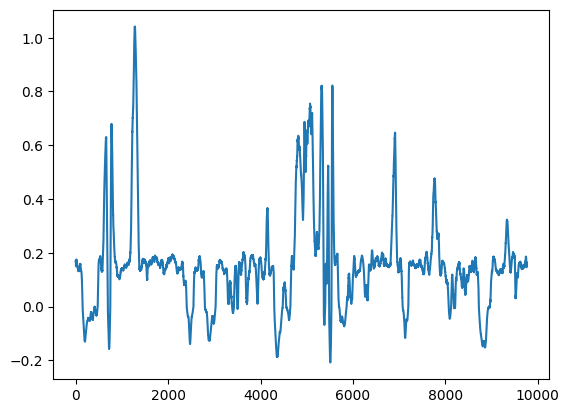

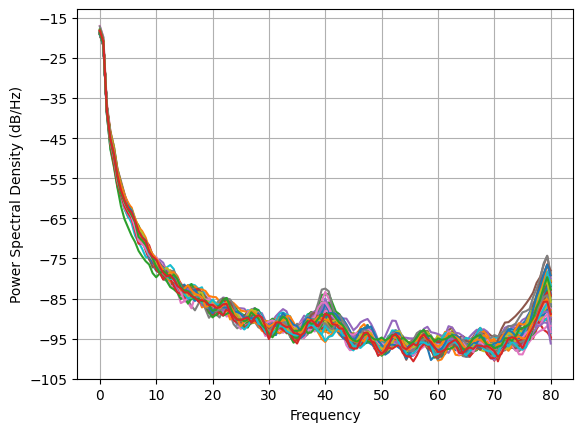

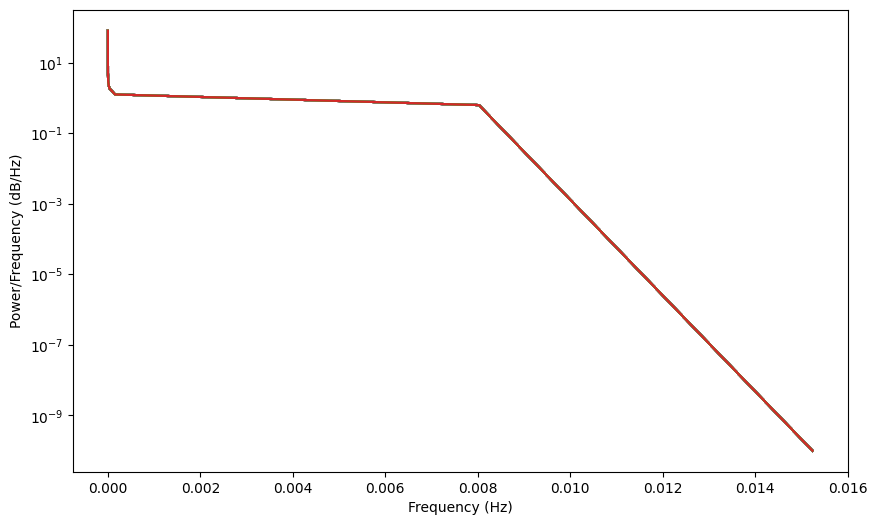

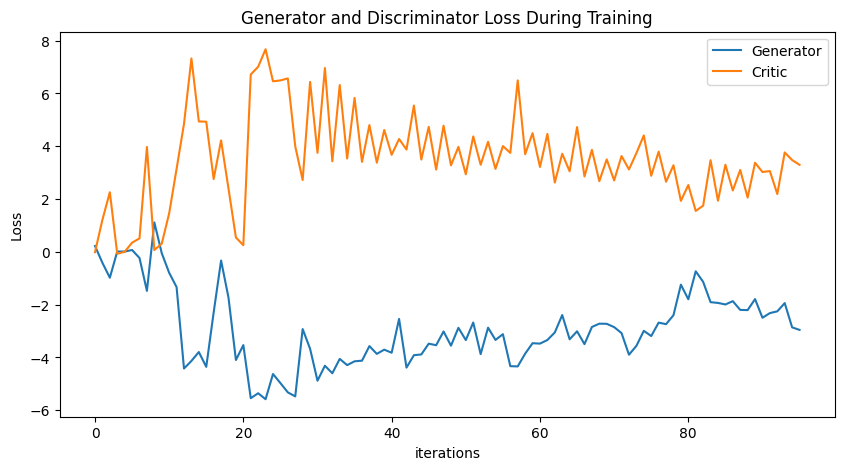

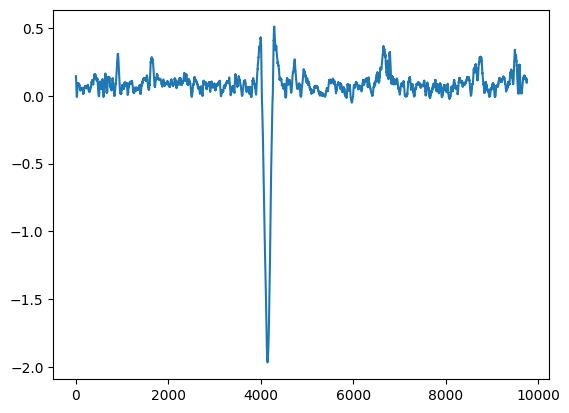

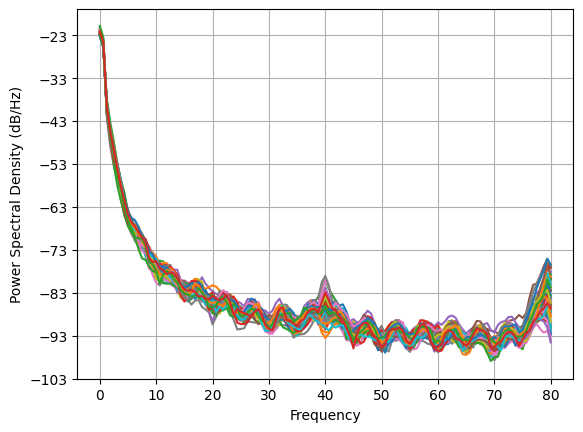

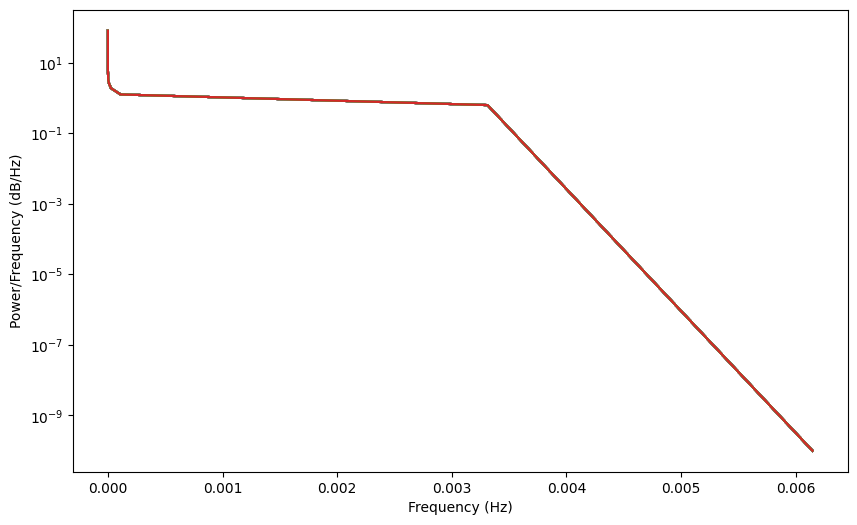

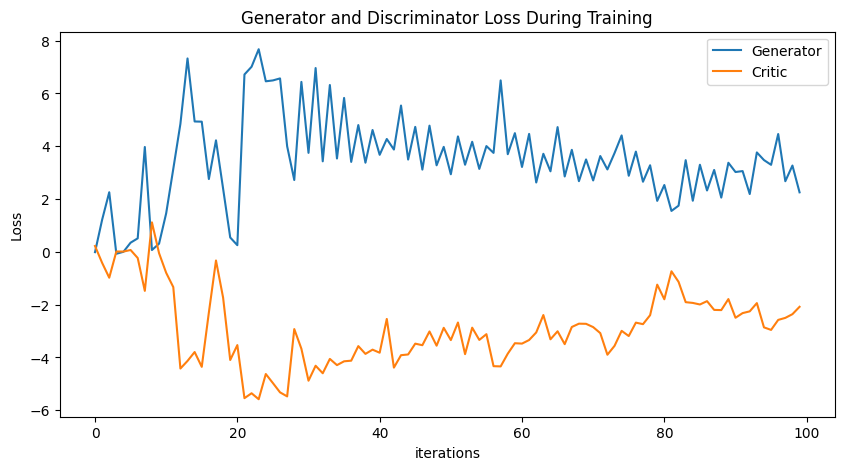

In [6]:
NUM_EPOCHS = 100
PRINT_INTERVAL = 5
training_data = torch.tensor(np.load('training_closed.npy'))
BATCH_SIZE = np.shape(training_data)[0]

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(320, 320, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(320, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(320, 320, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(320, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(320, 320, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(320, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(320, 320, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(320, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(320, 320, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(320, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(320, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 320, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(320, 320, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(320, 320, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(320, 320, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(320, 320, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(320, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for _ in range(5):
            real = training_data.clone().detach()
            real.requires_grad=True
            critic_real = D(real).reshape(-1)
            loss_critic_real = -torch.mean(critic_real)
            noise = sample_normal_distribution(BATCH_SIZE, 320, 305)
            fake = G(noise)
            critic_fake = D(fake).reshape(-1)
            loss_critic_fake = torch.mean(critic_fake)
            gp = gradient_penalty(D, real, fake) * LAMBDA_GP
            D.zero_grad()
            loss_critic = loss_critic_real + loss_critic_fake + gp
            loss_critic.backward()
            critic_optimizer.step()  

        noise = sample_normal_distribution(BATCH_SIZE, 320, 305)
        fake = G(noise)
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()
        
        critic_err.append(loss_critic.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(fake, critic_err, gen_err)

    return critic_err, gen_err, fake, D, G

critic_err, gen_err, generated_data_closed, disc, gen = train()

torch.save(gen, 'generator2_eyes_closed.pt')
torch.save(disc, 'discriminator2_eyes_closed.pt')
np.save('320channels-closed.npy', generated_data_closed.detach())
plot_everything(generated_data_closed, gen_err, critic_err)
generated_data_closed = None

Epoch 0: Critic error ([0.34816815142693824]) Generator err ([-0.04786069691181183])


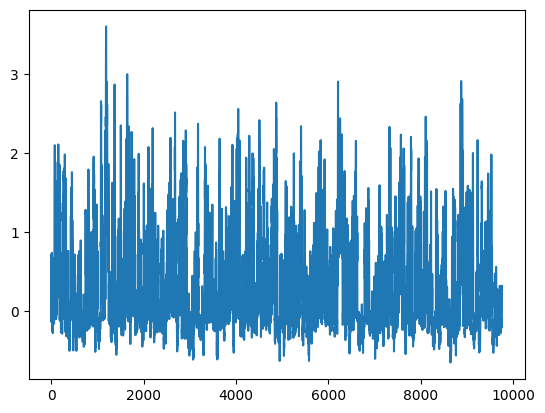

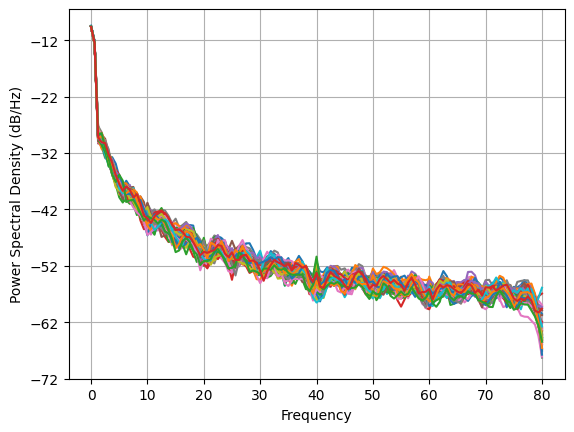

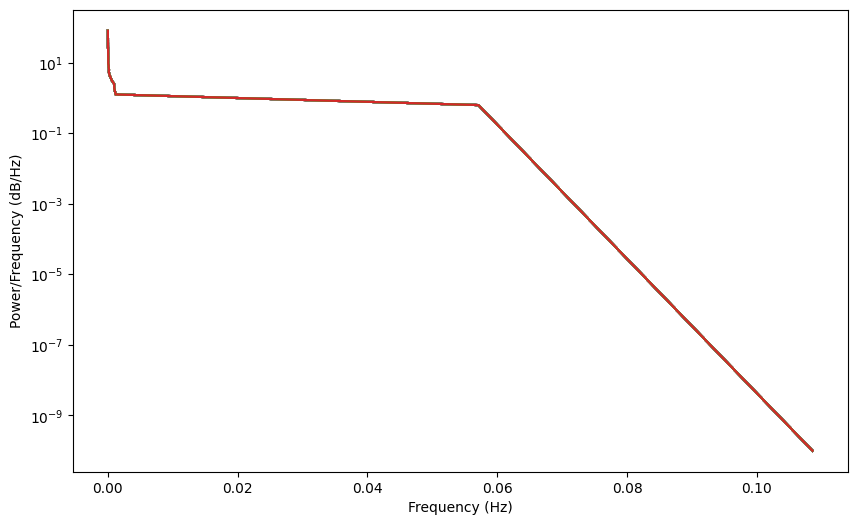

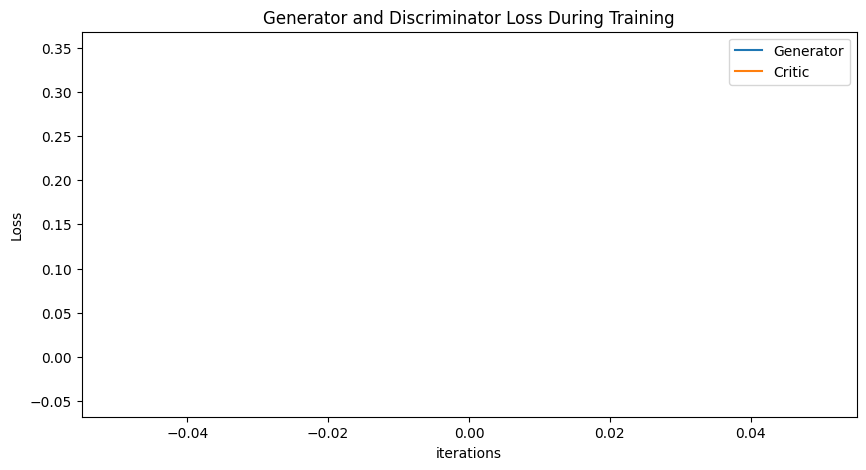

Epoch 5: Critic error ([0.34816815142693824, 0.0725849427110232, 0.05908038521892264, 0.08173304076924384, 0.0012023824414965356, 0.0712293521898193]) Generator err ([-0.04786069691181183, -0.07380353659391403, -0.1049664169549942, -0.05413662642240524, -0.12394476681947708, 0.005819906946271658])


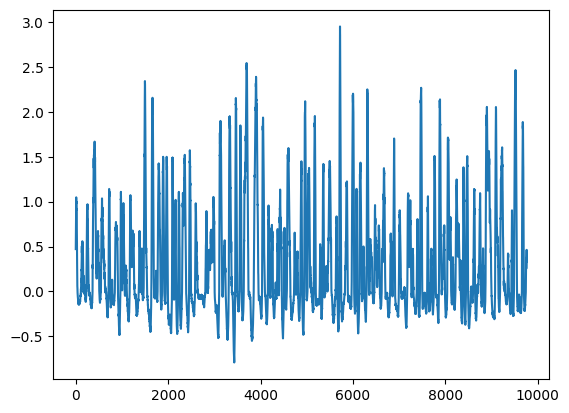

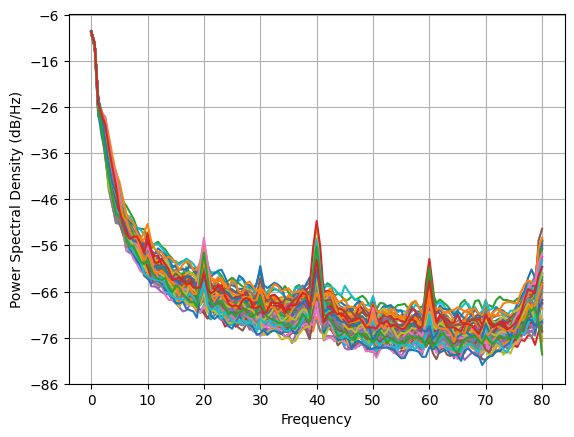

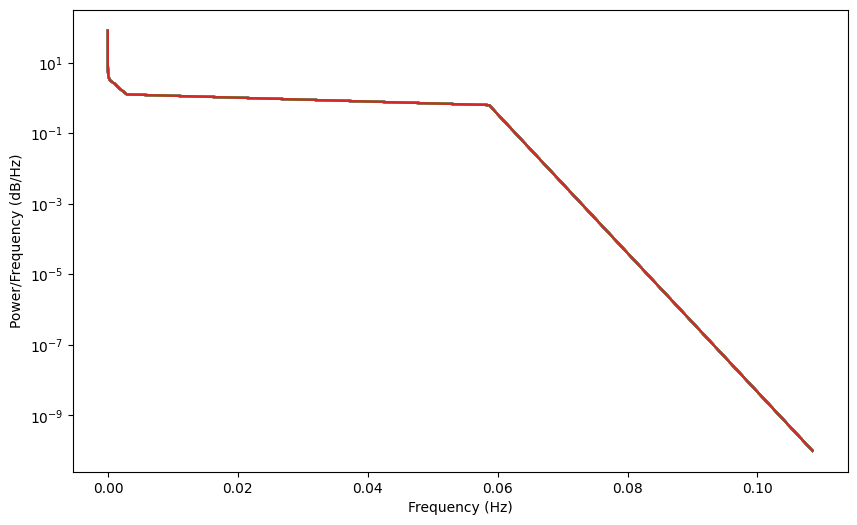

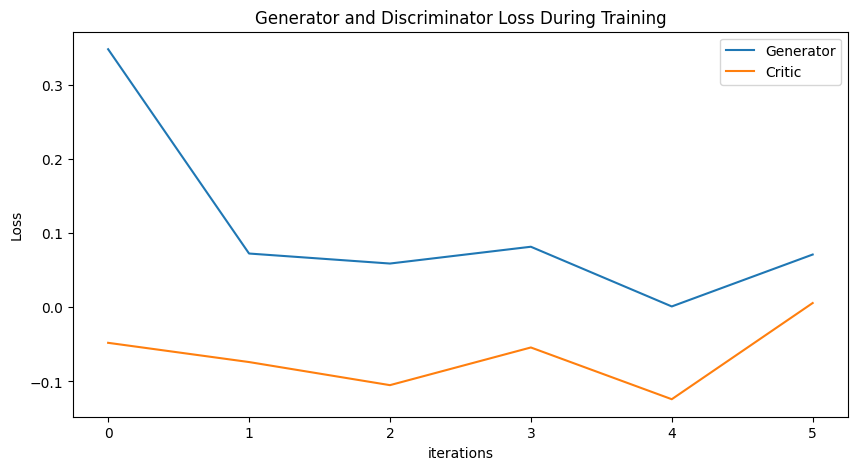

Epoch 10: Critic error ([0.34816815142693824, 0.0725849427110232, 0.05908038521892264, 0.08173304076924384, 0.0012023824414965356, 0.0712293521898193, 0.1695569522696529, -0.06934927782467083, -0.09109356308945349, -1.0329508357702741, -1.2285317565862484]) Generator err ([-0.04786069691181183, -0.07380353659391403, -0.1049664169549942, -0.05413662642240524, -0.12394476681947708, 0.005819906946271658, -0.012179131619632244, 0.09312958270311356, 0.4022844135761261, 2.8517191410064697, 3.2786247730255127])


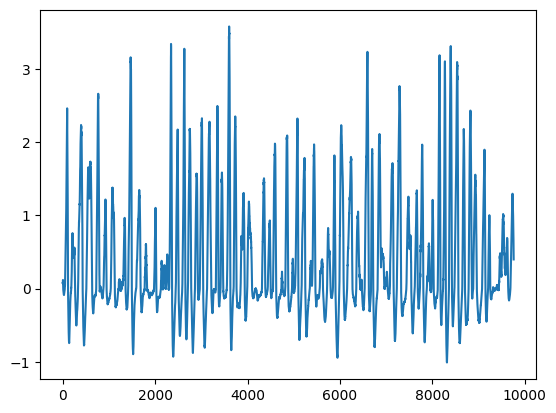

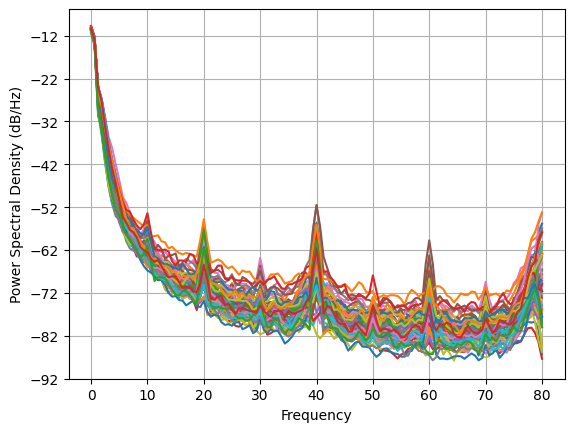

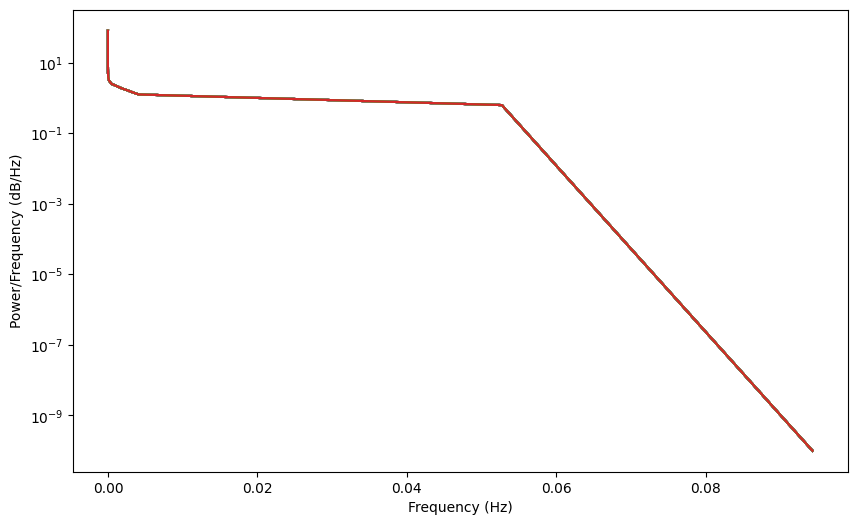

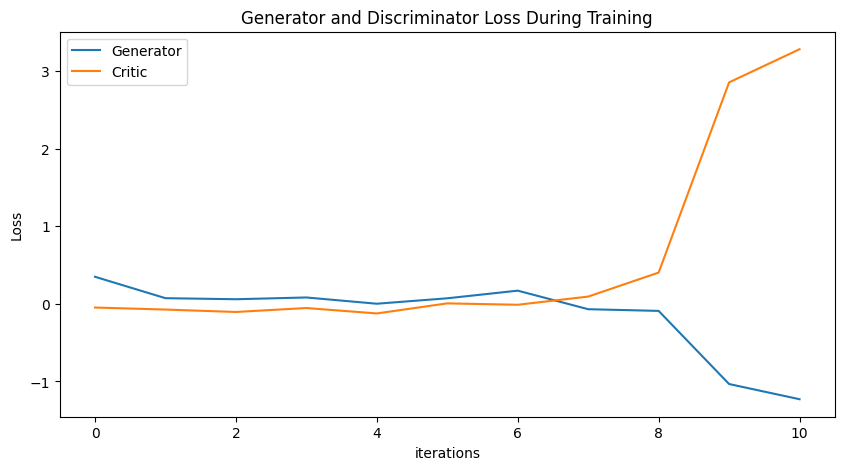

Epoch 15: Critic error ([0.34816815142693824, 0.0725849427110232, 0.05908038521892264, 0.08173304076924384, 0.0012023824414965356, 0.0712293521898193, 0.1695569522696529, -0.06934927782467083, -0.09109356308945349, -1.0329508357702741, -1.2285317565862484, -2.689983775686423, -1.0016378462046194, -2.5921731417155307, -2.4654225443315725, -4.332629065967956]) Generator err ([-0.04786069691181183, -0.07380353659391403, -0.1049664169549942, -0.05413662642240524, -0.12394476681947708, 0.005819906946271658, -0.012179131619632244, 0.09312958270311356, 0.4022844135761261, 2.8517191410064697, 3.2786247730255127, 3.0555367469787598, 1.8850135803222656, 5.697791576385498, 5.457538604736328, 1.5854589939117432])


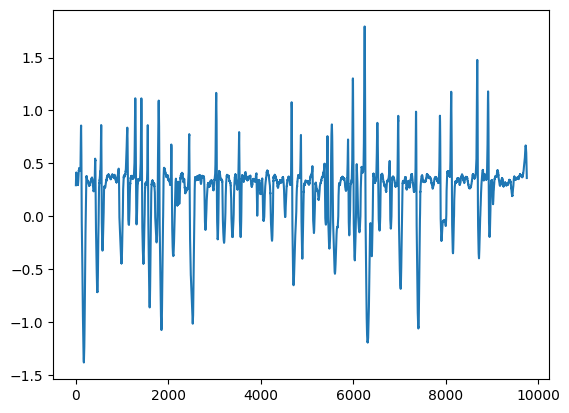

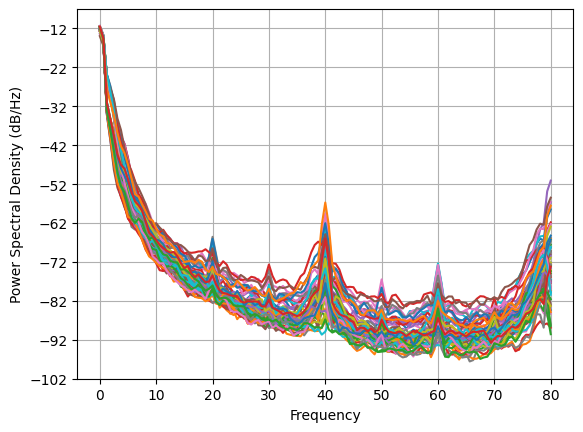

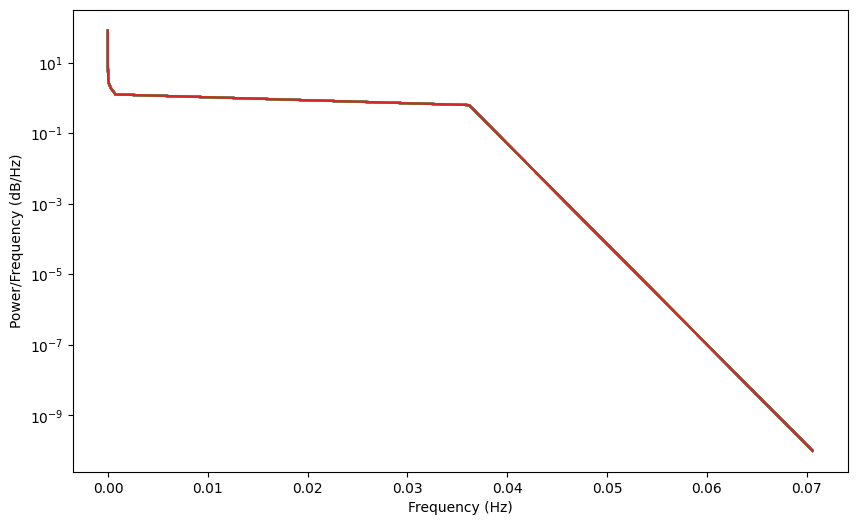

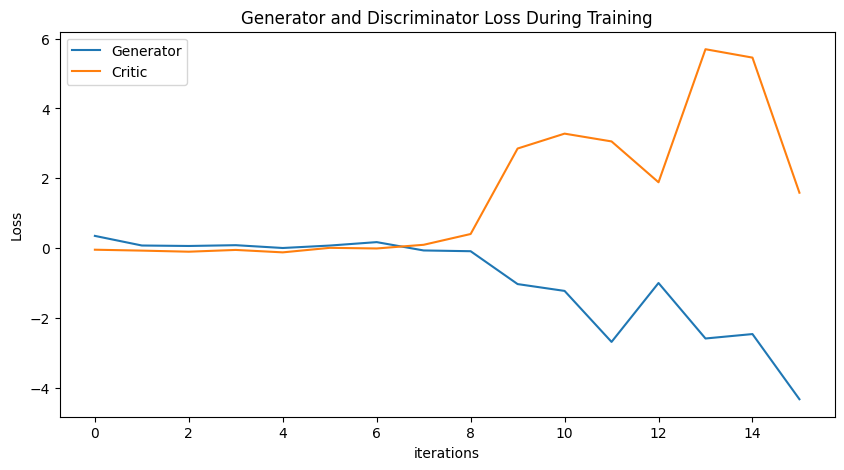

Epoch 20: Critic error ([0.34816815142693824, 0.0725849427110232, 0.05908038521892264, 0.08173304076924384, 0.0012023824414965356, 0.0712293521898193, 0.1695569522696529, -0.06934927782467083, -0.09109356308945349, -1.0329508357702741, -1.2285317565862484, -2.689983775686423, -1.0016378462046194, -2.5921731417155307, -2.4654225443315725, -4.332629065967956, -2.977178648894013, -2.457125965789416, -3.422531351741843, -4.889527811031852, -3.954601805175335]) Generator err ([-0.04786069691181183, -0.07380353659391403, -0.1049664169549942, -0.05413662642240524, -0.12394476681947708, 0.005819906946271658, -0.012179131619632244, 0.09312958270311356, 0.4022844135761261, 2.8517191410064697, 3.2786247730255127, 3.0555367469787598, 1.8850135803222656, 5.697791576385498, 5.457538604736328, 1.5854589939117432, 5.871437072753906, 6.633635520935059, 7.962905406951904, 3.051872491836548, 4.393690586090088])


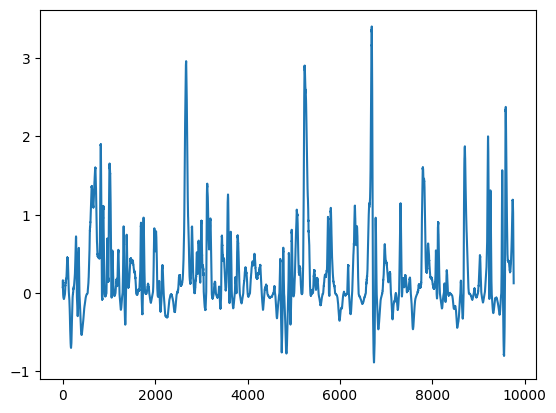

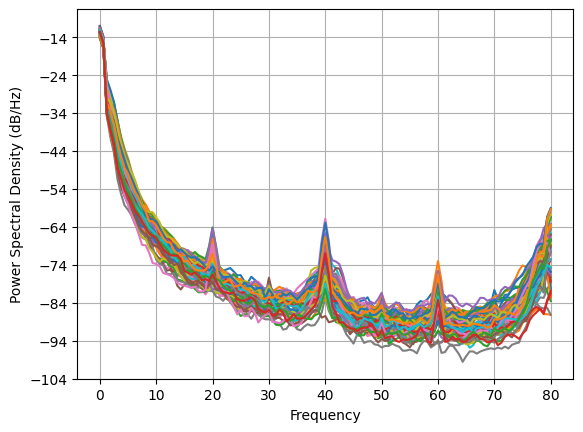

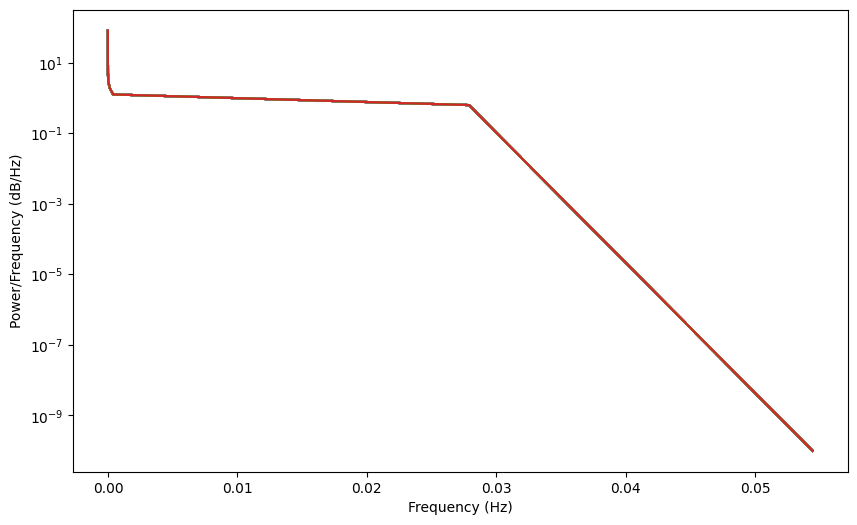

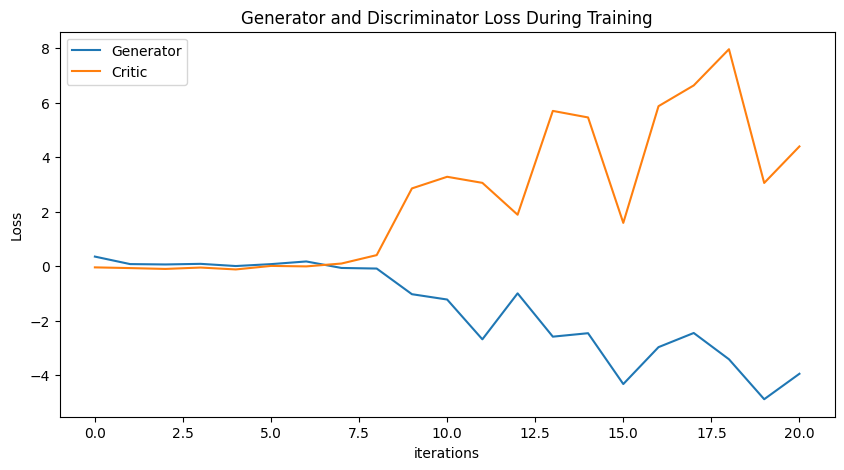

Epoch 25: Critic error ([0.34816815142693824, 0.0725849427110232, 0.05908038521892264, 0.08173304076924384, 0.0012023824414965356, 0.0712293521898193, 0.1695569522696529, -0.06934927782467083, -0.09109356308945349, -1.0329508357702741, -1.2285317565862484, -2.689983775686423, -1.0016378462046194, -2.5921731417155307, -2.4654225443315725, -4.332629065967956, -2.977178648894013, -2.457125965789416, -3.422531351741843, -4.889527811031852, -3.954601805175335, -4.19422565417983, -2.8395864495438525, -4.0198870510904, -3.910402845806144, -3.4411855095916906]) Generator err ([-0.04786069691181183, -0.07380353659391403, -0.1049664169549942, -0.05413662642240524, -0.12394476681947708, 0.005819906946271658, -0.012179131619632244, 0.09312958270311356, 0.4022844135761261, 2.8517191410064697, 3.2786247730255127, 3.0555367469787598, 1.8850135803222656, 5.697791576385498, 5.457538604736328, 1.5854589939117432, 5.871437072753906, 6.633635520935059, 7.962905406951904, 3.051872491836548, 4.3936905860900

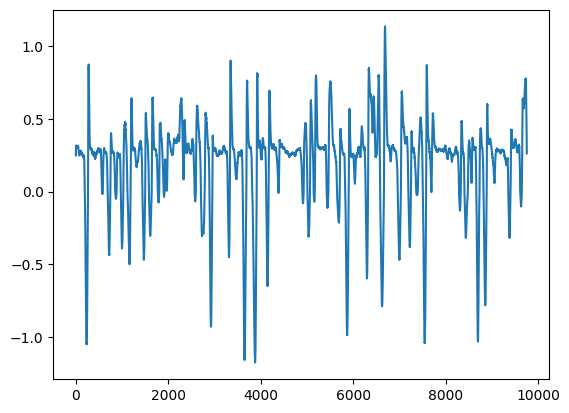

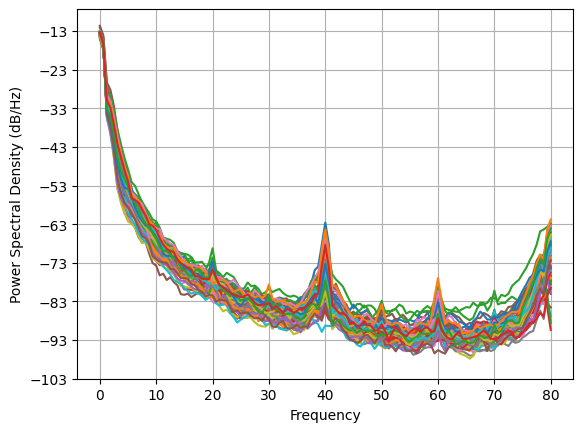

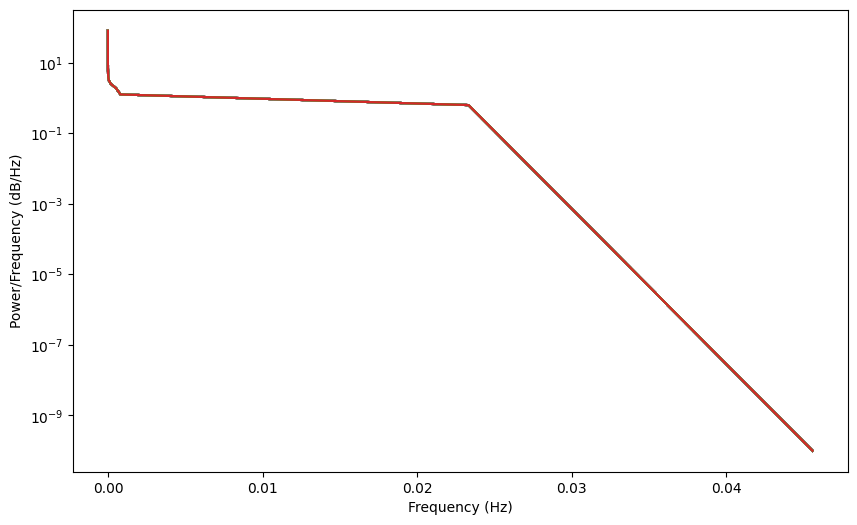

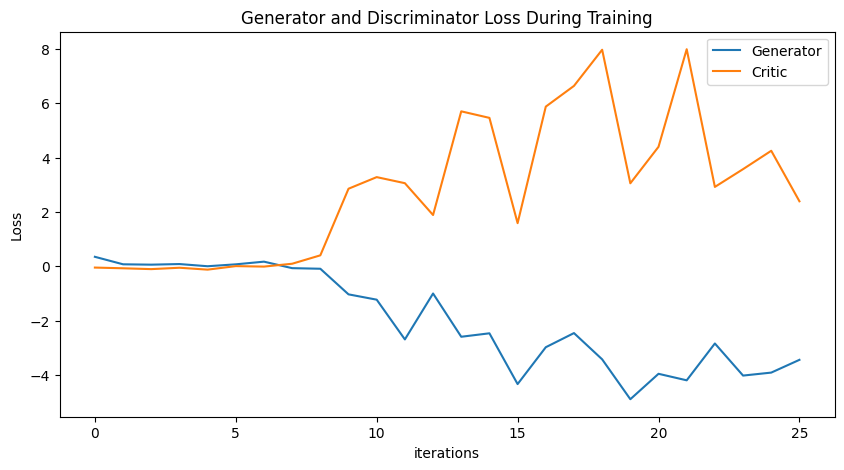

Epoch 30: Critic error ([0.34816815142693824, 0.0725849427110232, 0.05908038521892264, 0.08173304076924384, 0.0012023824414965356, 0.0712293521898193, 0.1695569522696529, -0.06934927782467083, -0.09109356308945349, -1.0329508357702741, -1.2285317565862484, -2.689983775686423, -1.0016378462046194, -2.5921731417155307, -2.4654225443315725, -4.332629065967956, -2.977178648894013, -2.457125965789416, -3.422531351741843, -4.889527811031852, -3.954601805175335, -4.19422565417983, -2.8395864495438525, -4.0198870510904, -3.910402845806144, -3.4411855095916906, -3.9074198268989884, -4.049442775963653, -1.6939420324315624, -2.2191061275307202, -3.7872512623641192]) Generator err ([-0.04786069691181183, -0.07380353659391403, -0.1049664169549942, -0.05413662642240524, -0.12394476681947708, 0.005819906946271658, -0.012179131619632244, 0.09312958270311356, 0.4022844135761261, 2.8517191410064697, 3.2786247730255127, 3.0555367469787598, 1.8850135803222656, 5.697791576385498, 5.457538604736328, 1.58545

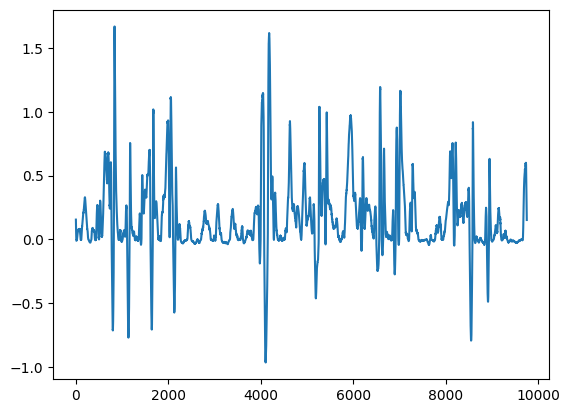

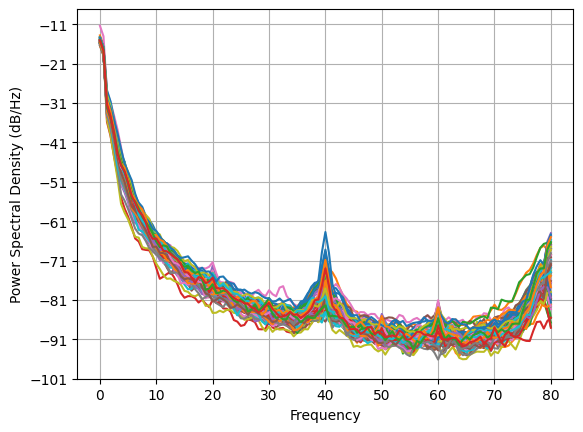

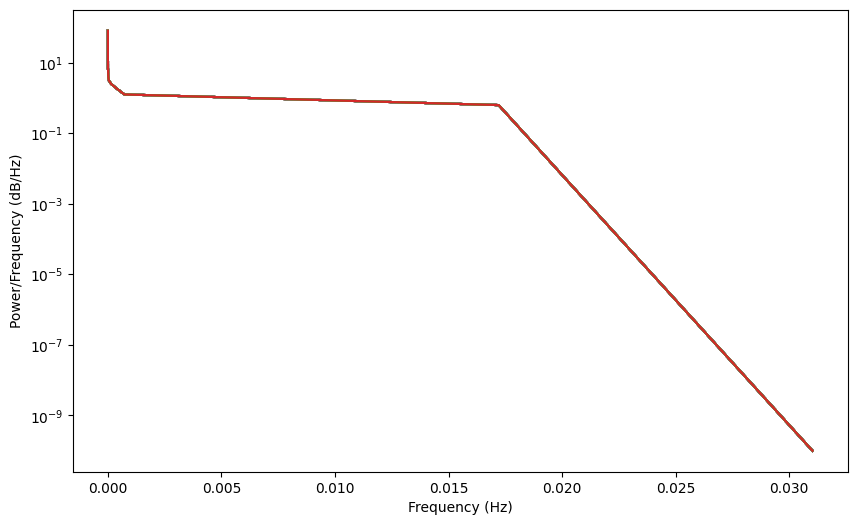

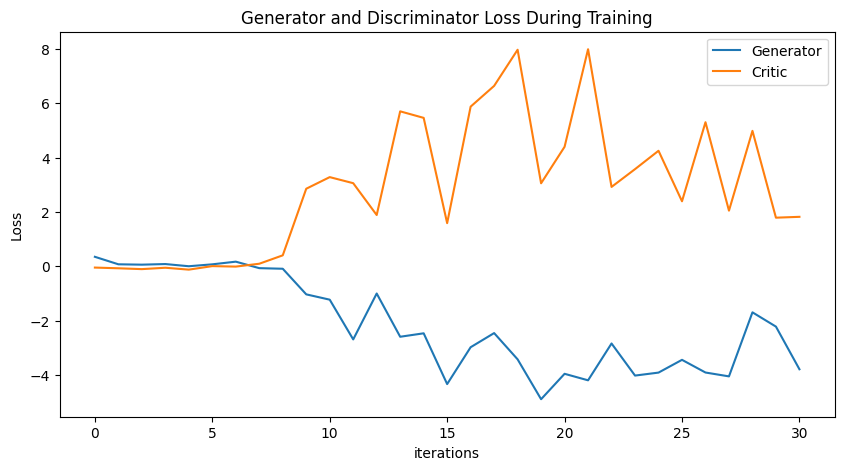

Epoch 35: Critic error ([0.34816815142693824, 0.0725849427110232, 0.05908038521892264, 0.08173304076924384, 0.0012023824414965356, 0.0712293521898193, 0.1695569522696529, -0.06934927782467083, -0.09109356308945349, -1.0329508357702741, -1.2285317565862484, -2.689983775686423, -1.0016378462046194, -2.5921731417155307, -2.4654225443315725, -4.332629065967956, -2.977178648894013, -2.457125965789416, -3.422531351741843, -4.889527811031852, -3.954601805175335, -4.19422565417983, -2.8395864495438525, -4.0198870510904, -3.910402845806144, -3.4411855095916906, -3.9074198268989884, -4.049442775963653, -1.6939420324315624, -2.2191061275307202, -3.7872512623641192, -3.4951907185950564, -3.610060783624543, -4.11334874868314, -4.009296212102134, -4.164188059041723]) Generator err ([-0.04786069691181183, -0.07380353659391403, -0.1049664169549942, -0.05413662642240524, -0.12394476681947708, 0.005819906946271658, -0.012179131619632244, 0.09312958270311356, 0.4022844135761261, 2.8517191410064697, 3.278

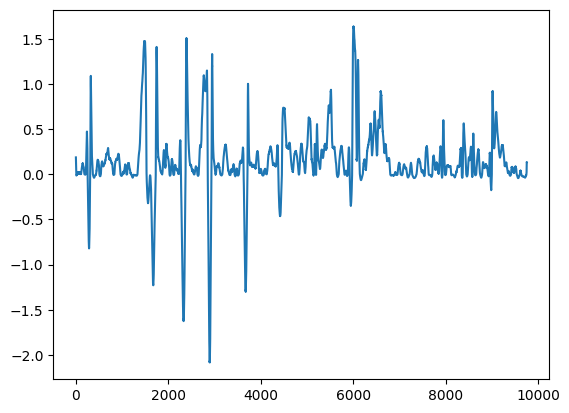

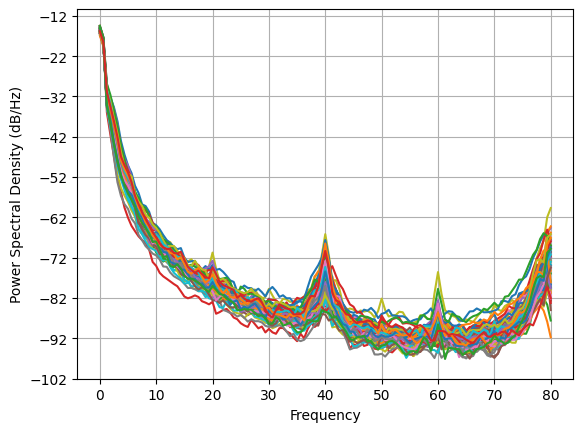

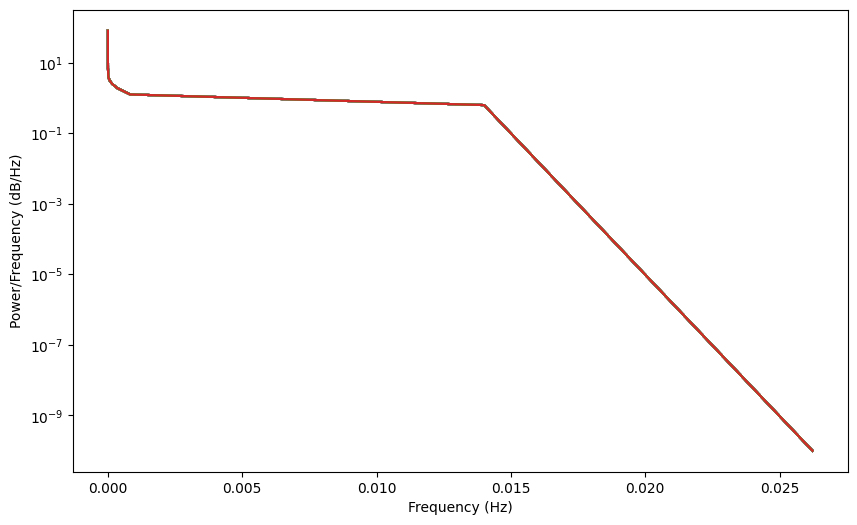

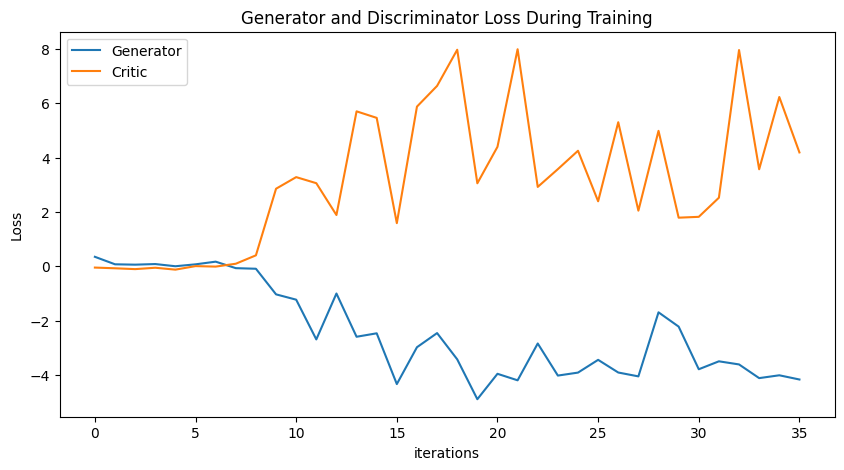

Epoch 40: Critic error ([0.34816815142693824, 0.0725849427110232, 0.05908038521892264, 0.08173304076924384, 0.0012023824414965356, 0.0712293521898193, 0.1695569522696529, -0.06934927782467083, -0.09109356308945349, -1.0329508357702741, -1.2285317565862484, -2.689983775686423, -1.0016378462046194, -2.5921731417155307, -2.4654225443315725, -4.332629065967956, -2.977178648894013, -2.457125965789416, -3.422531351741843, -4.889527811031852, -3.954601805175335, -4.19422565417983, -2.8395864495438525, -4.0198870510904, -3.910402845806144, -3.4411855095916906, -3.9074198268989884, -4.049442775963653, -1.6939420324315624, -2.2191061275307202, -3.7872512623641192, -3.4951907185950564, -3.610060783624543, -4.11334874868314, -4.009296212102134, -4.164188059041723, -2.9965626420529623, -4.23423737426751, -1.3237142519481055, -3.937069341978334, -3.6937664979514406]) Generator err ([-0.04786069691181183, -0.07380353659391403, -0.1049664169549942, -0.05413662642240524, -0.12394476681947708, 0.0058199

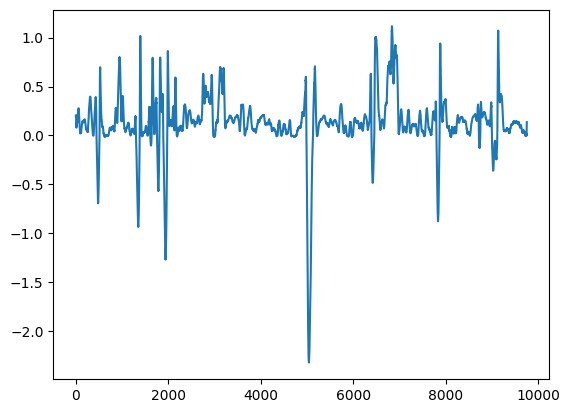

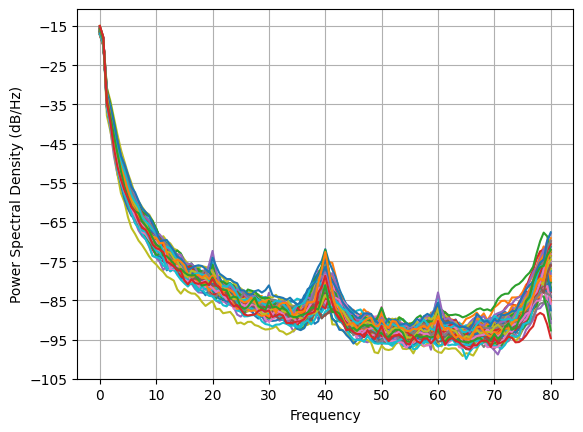

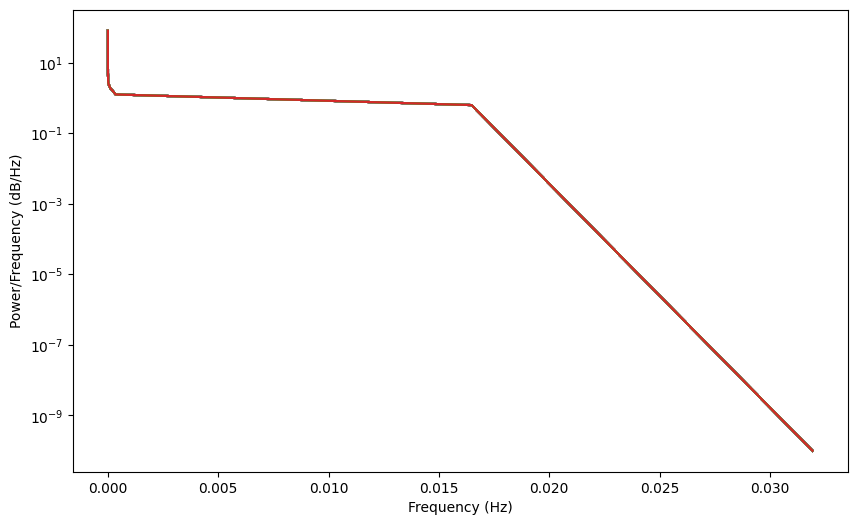

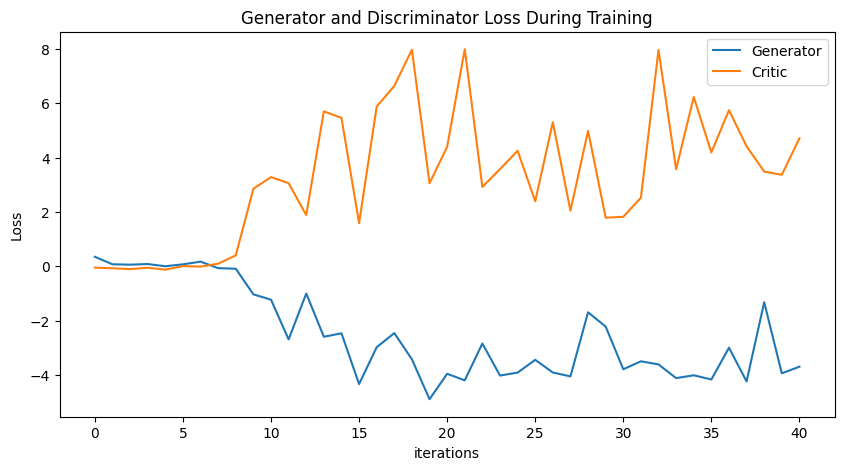

Epoch 45: Critic error ([0.34816815142693824, 0.0725849427110232, 0.05908038521892264, 0.08173304076924384, 0.0012023824414965356, 0.0712293521898193, 0.1695569522696529, -0.06934927782467083, -0.09109356308945349, -1.0329508357702741, -1.2285317565862484, -2.689983775686423, -1.0016378462046194, -2.5921731417155307, -2.4654225443315725, -4.332629065967956, -2.977178648894013, -2.457125965789416, -3.422531351741843, -4.889527811031852, -3.954601805175335, -4.19422565417983, -2.8395864495438525, -4.0198870510904, -3.910402845806144, -3.4411855095916906, -3.9074198268989884, -4.049442775963653, -1.6939420324315624, -2.2191061275307202, -3.7872512623641192, -3.4951907185950564, -3.610060783624543, -4.11334874868314, -4.009296212102134, -4.164188059041723, -2.9965626420529623, -4.23423737426751, -1.3237142519481055, -3.937069341978334, -3.6937664979514406, -3.406799054862675, -2.4150964392949525, -3.381134104148988, -1.0623691052203537, 0.37681320427805254]) Generator err ([-0.047860696911

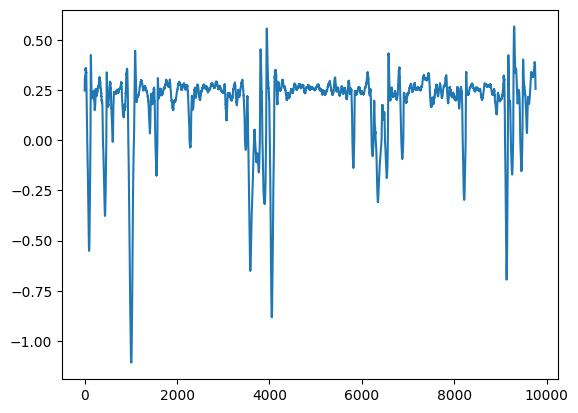

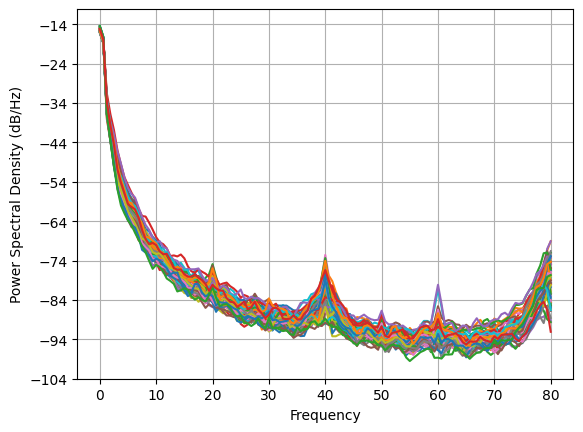

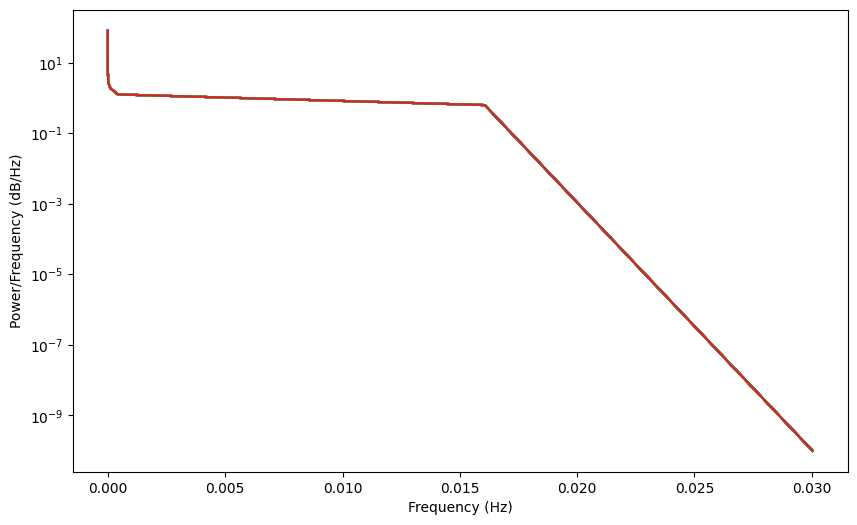

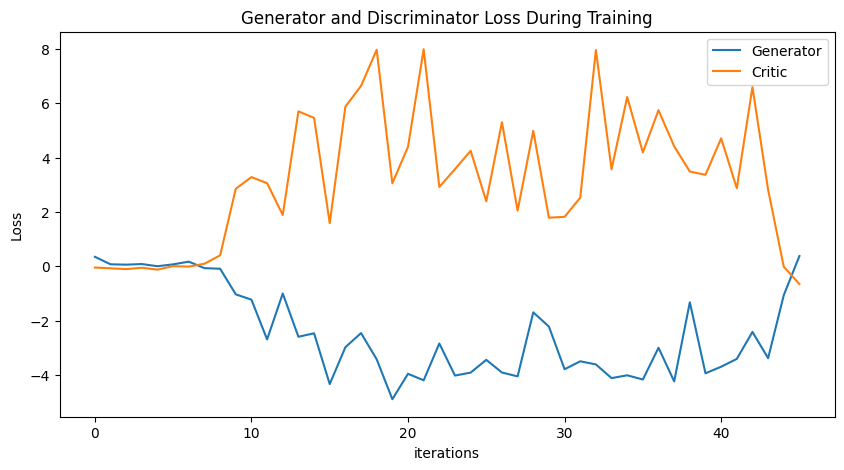

Epoch 50: Critic error ([0.34816815142693824, 0.0725849427110232, 0.05908038521892264, 0.08173304076924384, 0.0012023824414965356, 0.0712293521898193, 0.1695569522696529, -0.06934927782467083, -0.09109356308945349, -1.0329508357702741, -1.2285317565862484, -2.689983775686423, -1.0016378462046194, -2.5921731417155307, -2.4654225443315725, -4.332629065967956, -2.977178648894013, -2.457125965789416, -3.422531351741843, -4.889527811031852, -3.954601805175335, -4.19422565417983, -2.8395864495438525, -4.0198870510904, -3.910402845806144, -3.4411855095916906, -3.9074198268989884, -4.049442775963653, -1.6939420324315624, -2.2191061275307202, -3.7872512623641192, -3.4951907185950564, -3.610060783624543, -4.11334874868314, -4.009296212102134, -4.164188059041723, -2.9965626420529623, -4.23423737426751, -1.3237142519481055, -3.937069341978334, -3.6937664979514406, -3.406799054862675, -2.4150964392949525, -3.381134104148988, -1.0623691052203537, 0.37681320427805254, -2.2231712594159454, -0.97141835

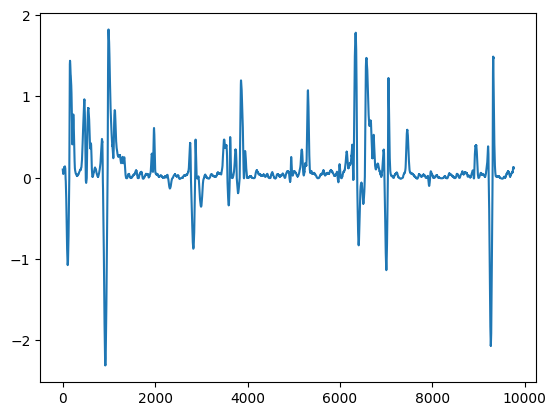

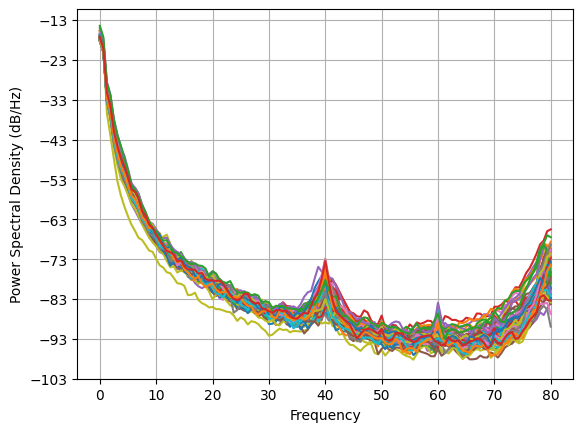

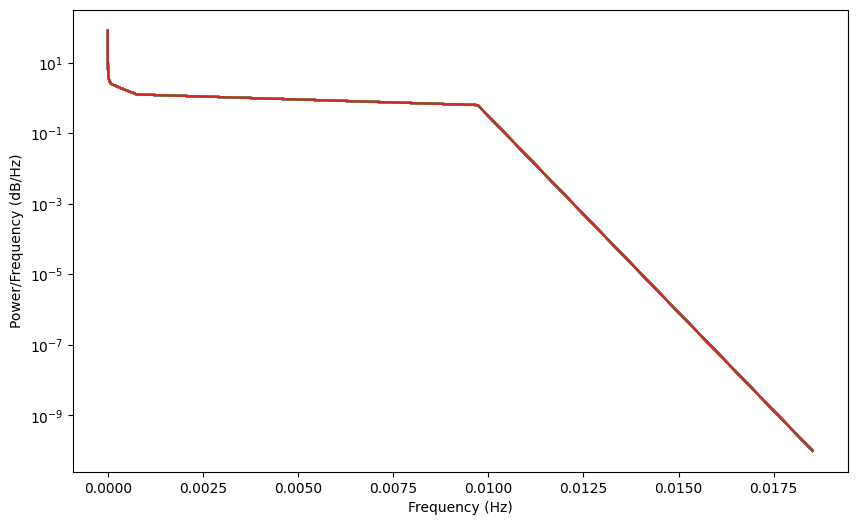

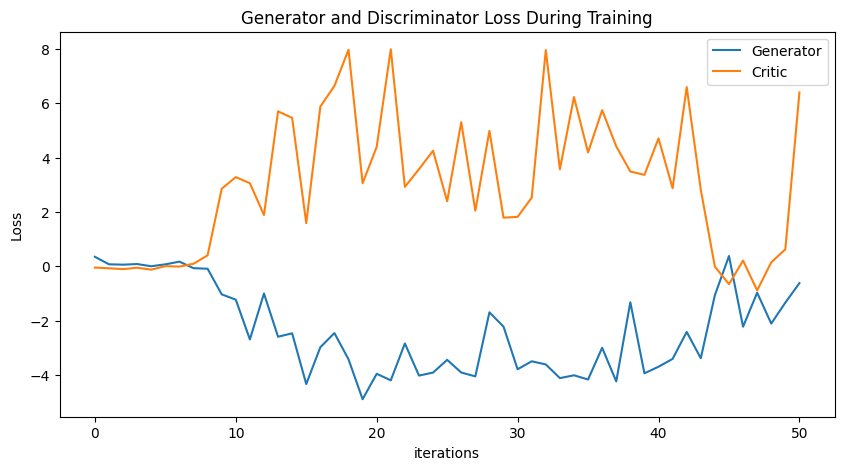

Epoch 55: Critic error ([0.34816815142693824, 0.0725849427110232, 0.05908038521892264, 0.08173304076924384, 0.0012023824414965356, 0.0712293521898193, 0.1695569522696529, -0.06934927782467083, -0.09109356308945349, -1.0329508357702741, -1.2285317565862484, -2.689983775686423, -1.0016378462046194, -2.5921731417155307, -2.4654225443315725, -4.332629065967956, -2.977178648894013, -2.457125965789416, -3.422531351741843, -4.889527811031852, -3.954601805175335, -4.19422565417983, -2.8395864495438525, -4.0198870510904, -3.910402845806144, -3.4411855095916906, -3.9074198268989884, -4.049442775963653, -1.6939420324315624, -2.2191061275307202, -3.7872512623641192, -3.4951907185950564, -3.610060783624543, -4.11334874868314, -4.009296212102134, -4.164188059041723, -2.9965626420529623, -4.23423737426751, -1.3237142519481055, -3.937069341978334, -3.6937664979514406, -3.406799054862675, -2.4150964392949525, -3.381134104148988, -1.0623691052203537, 0.37681320427805254, -2.2231712594159454, -0.97141835

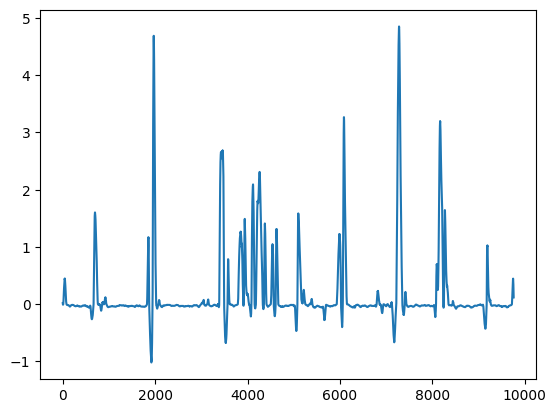

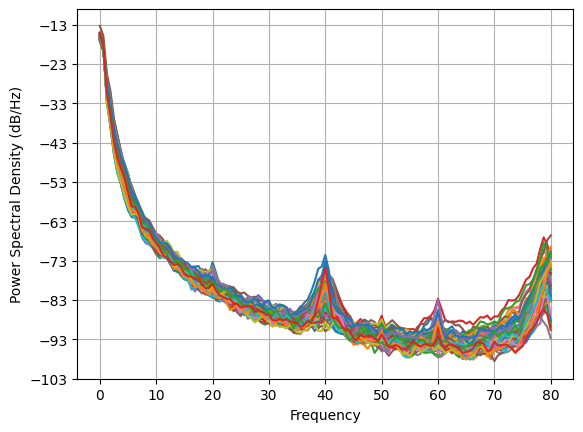

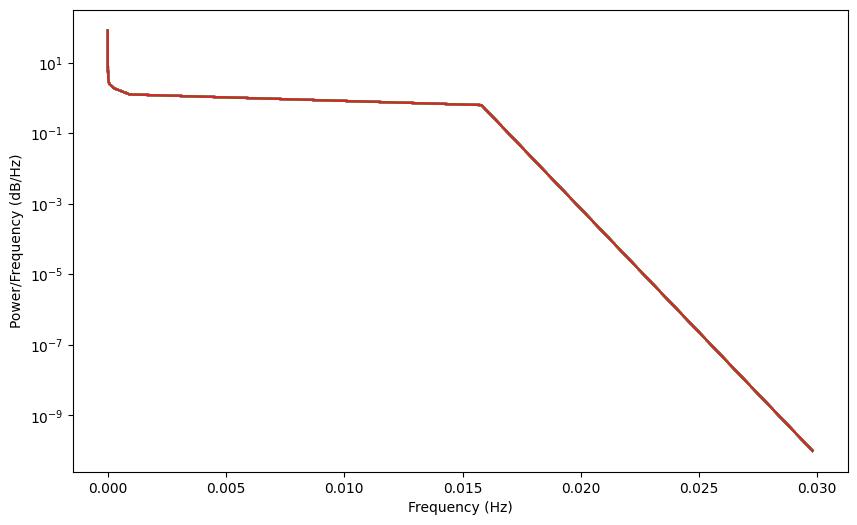

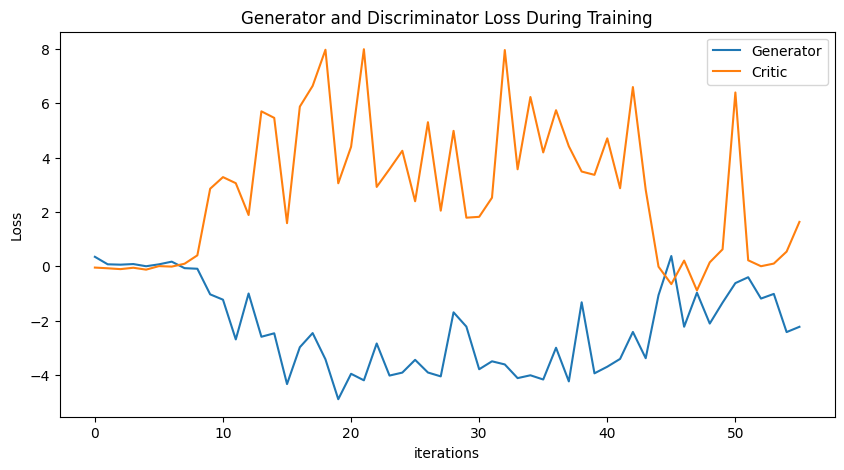

Epoch 60: Critic error ([0.34816815142693824, 0.0725849427110232, 0.05908038521892264, 0.08173304076924384, 0.0012023824414965356, 0.0712293521898193, 0.1695569522696529, -0.06934927782467083, -0.09109356308945349, -1.0329508357702741, -1.2285317565862484, -2.689983775686423, -1.0016378462046194, -2.5921731417155307, -2.4654225443315725, -4.332629065967956, -2.977178648894013, -2.457125965789416, -3.422531351741843, -4.889527811031852, -3.954601805175335, -4.19422565417983, -2.8395864495438525, -4.0198870510904, -3.910402845806144, -3.4411855095916906, -3.9074198268989884, -4.049442775963653, -1.6939420324315624, -2.2191061275307202, -3.7872512623641192, -3.4951907185950564, -3.610060783624543, -4.11334874868314, -4.009296212102134, -4.164188059041723, -2.9965626420529623, -4.23423737426751, -1.3237142519481055, -3.937069341978334, -3.6937664979514406, -3.406799054862675, -2.4150964392949525, -3.381134104148988, -1.0623691052203537, 0.37681320427805254, -2.2231712594159454, -0.97141835

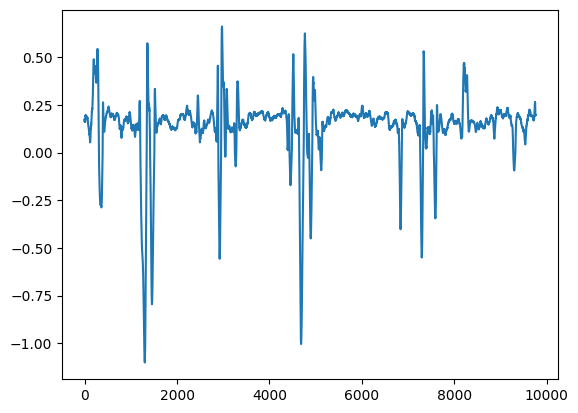

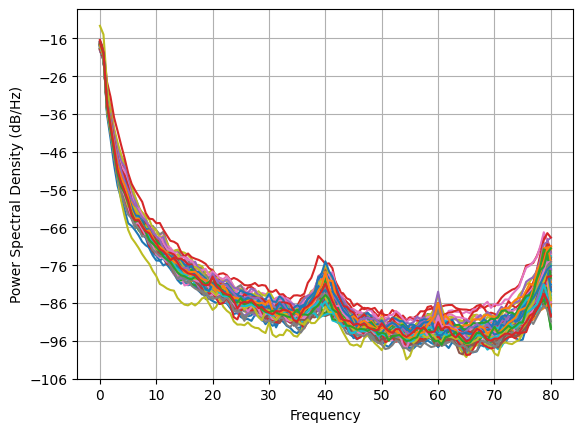

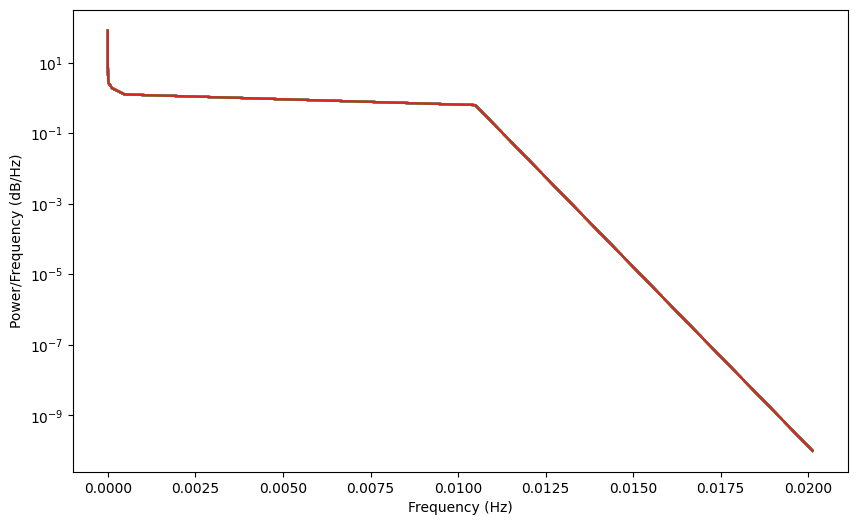

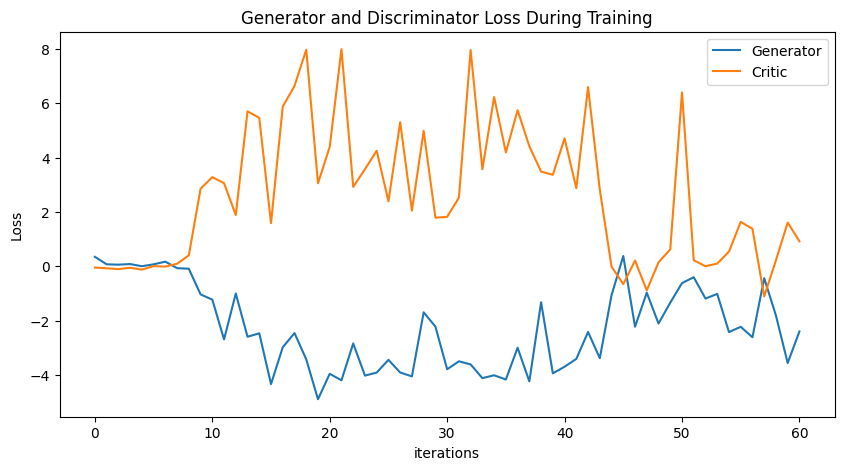

Epoch 65: Critic error ([0.34816815142693824, 0.0725849427110232, 0.05908038521892264, 0.08173304076924384, 0.0012023824414965356, 0.0712293521898193, 0.1695569522696529, -0.06934927782467083, -0.09109356308945349, -1.0329508357702741, -1.2285317565862484, -2.689983775686423, -1.0016378462046194, -2.5921731417155307, -2.4654225443315725, -4.332629065967956, -2.977178648894013, -2.457125965789416, -3.422531351741843, -4.889527811031852, -3.954601805175335, -4.19422565417983, -2.8395864495438525, -4.0198870510904, -3.910402845806144, -3.4411855095916906, -3.9074198268989884, -4.049442775963653, -1.6939420324315624, -2.2191061275307202, -3.7872512623641192, -3.4951907185950564, -3.610060783624543, -4.11334874868314, -4.009296212102134, -4.164188059041723, -2.9965626420529623, -4.23423737426751, -1.3237142519481055, -3.937069341978334, -3.6937664979514406, -3.406799054862675, -2.4150964392949525, -3.381134104148988, -1.0623691052203537, 0.37681320427805254, -2.2231712594159454, -0.97141835

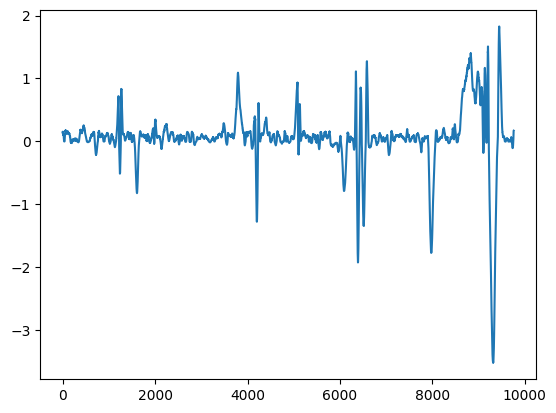

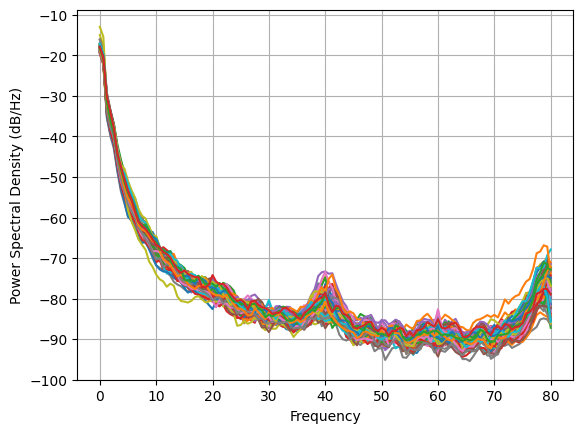

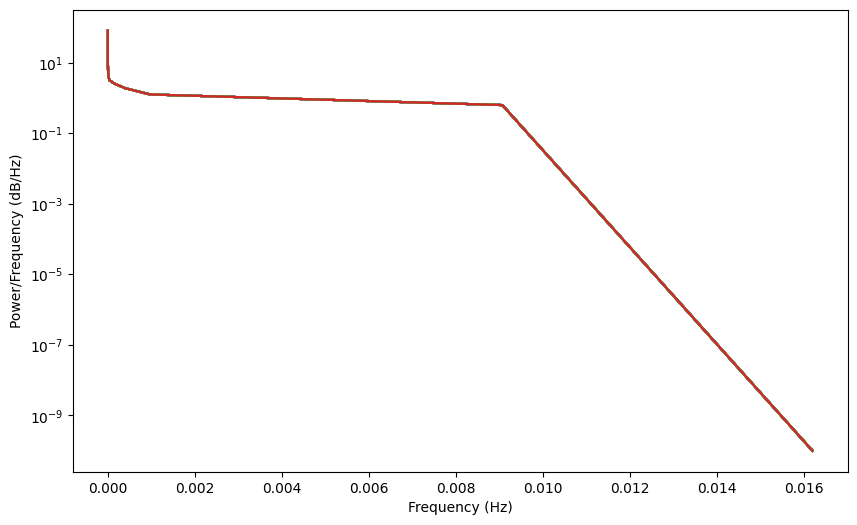

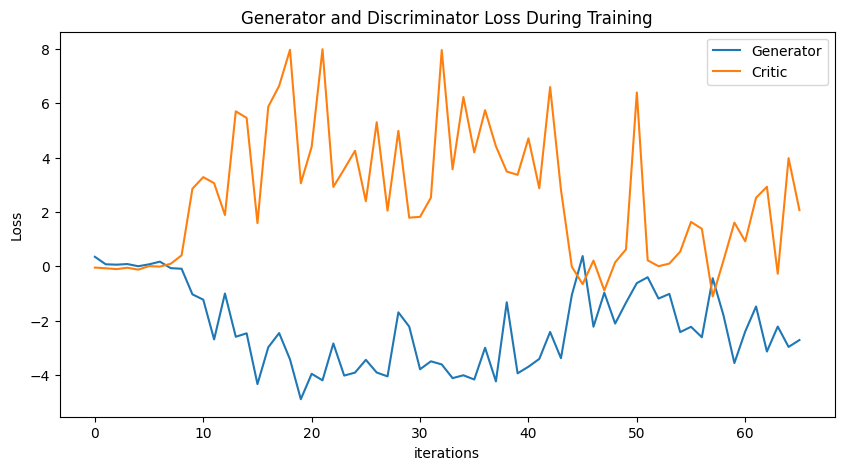

Epoch 70: Critic error ([0.34816815142693824, 0.0725849427110232, 0.05908038521892264, 0.08173304076924384, 0.0012023824414965356, 0.0712293521898193, 0.1695569522696529, -0.06934927782467083, -0.09109356308945349, -1.0329508357702741, -1.2285317565862484, -2.689983775686423, -1.0016378462046194, -2.5921731417155307, -2.4654225443315725, -4.332629065967956, -2.977178648894013, -2.457125965789416, -3.422531351741843, -4.889527811031852, -3.954601805175335, -4.19422565417983, -2.8395864495438525, -4.0198870510904, -3.910402845806144, -3.4411855095916906, -3.9074198268989884, -4.049442775963653, -1.6939420324315624, -2.2191061275307202, -3.7872512623641192, -3.4951907185950564, -3.610060783624543, -4.11334874868314, -4.009296212102134, -4.164188059041723, -2.9965626420529623, -4.23423737426751, -1.3237142519481055, -3.937069341978334, -3.6937664979514406, -3.406799054862675, -2.4150964392949525, -3.381134104148988, -1.0623691052203537, 0.37681320427805254, -2.2231712594159454, -0.97141835

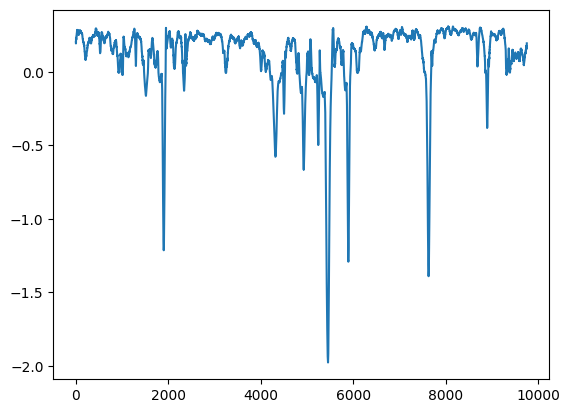

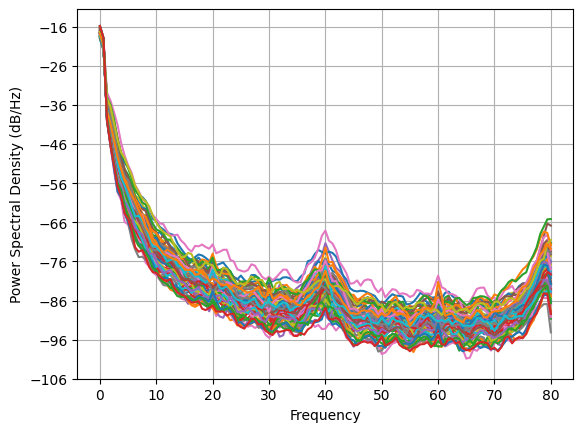

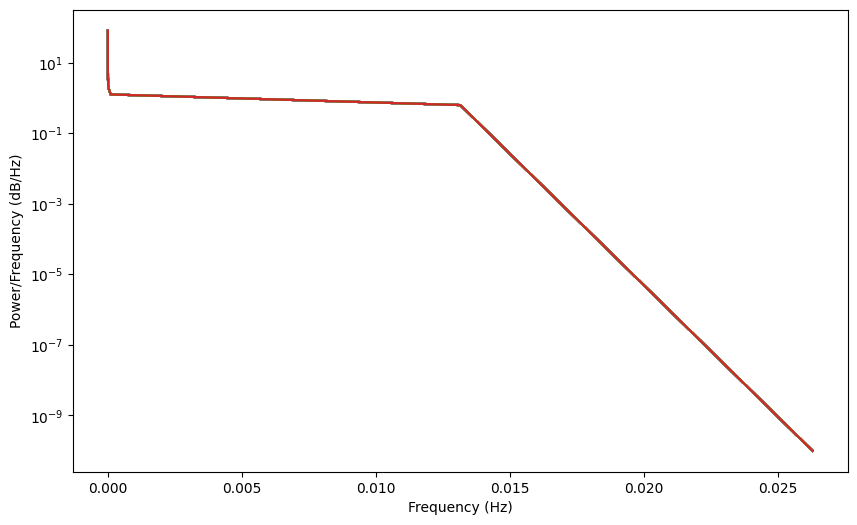

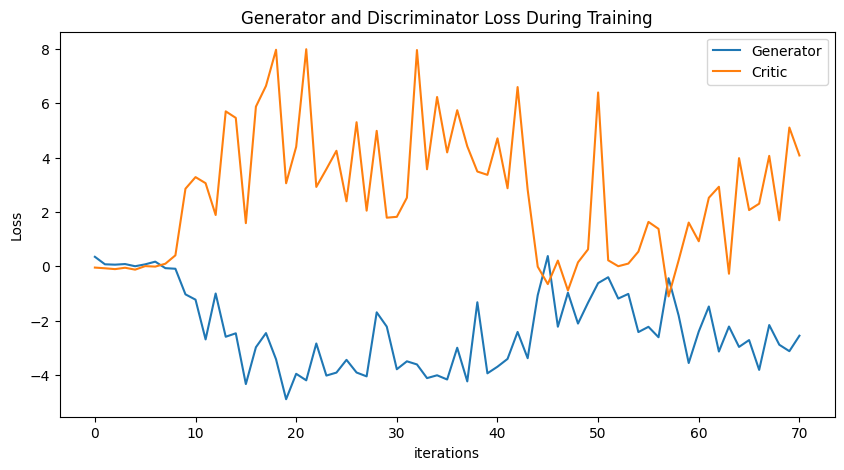

Epoch 75: Critic error ([0.34816815142693824, 0.0725849427110232, 0.05908038521892264, 0.08173304076924384, 0.0012023824414965356, 0.0712293521898193, 0.1695569522696529, -0.06934927782467083, -0.09109356308945349, -1.0329508357702741, -1.2285317565862484, -2.689983775686423, -1.0016378462046194, -2.5921731417155307, -2.4654225443315725, -4.332629065967956, -2.977178648894013, -2.457125965789416, -3.422531351741843, -4.889527811031852, -3.954601805175335, -4.19422565417983, -2.8395864495438525, -4.0198870510904, -3.910402845806144, -3.4411855095916906, -3.9074198268989884, -4.049442775963653, -1.6939420324315624, -2.2191061275307202, -3.7872512623641192, -3.4951907185950564, -3.610060783624543, -4.11334874868314, -4.009296212102134, -4.164188059041723, -2.9965626420529623, -4.23423737426751, -1.3237142519481055, -3.937069341978334, -3.6937664979514406, -3.406799054862675, -2.4150964392949525, -3.381134104148988, -1.0623691052203537, 0.37681320427805254, -2.2231712594159454, -0.97141835

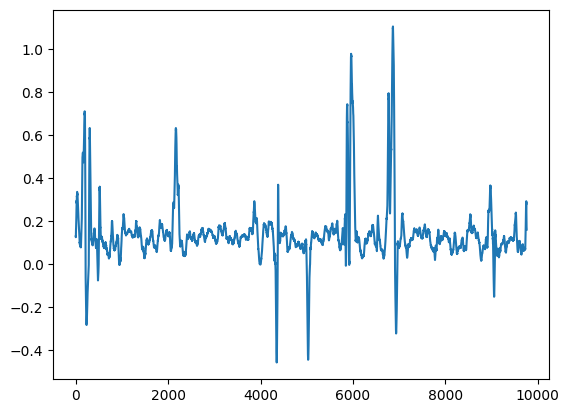

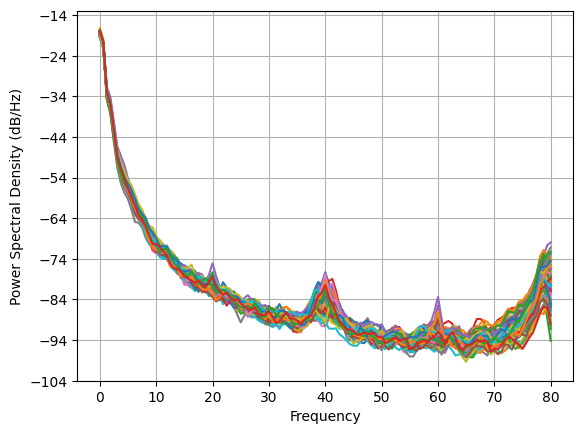

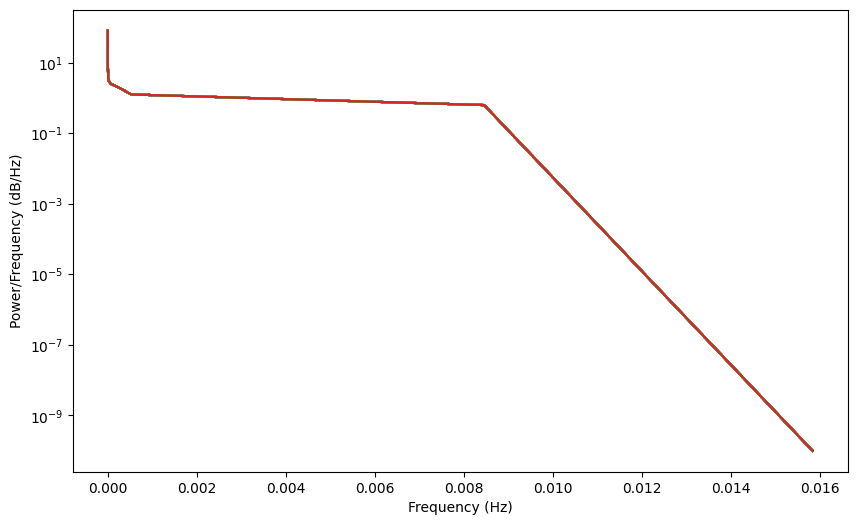

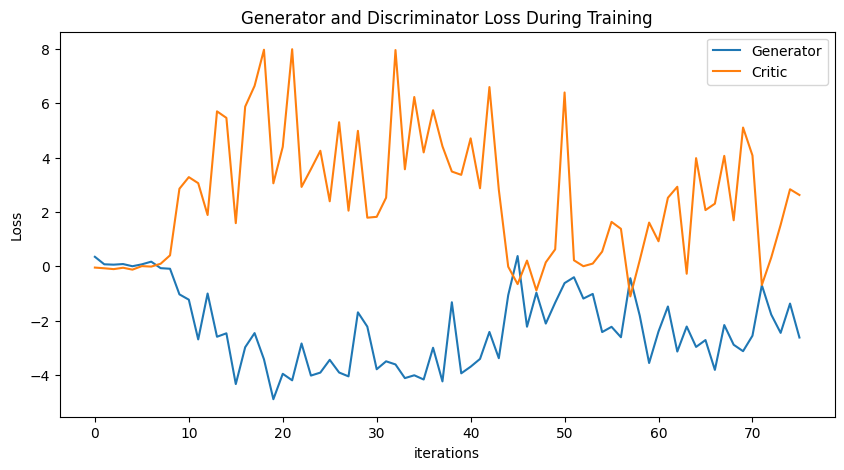

Epoch 80: Critic error ([0.34816815142693824, 0.0725849427110232, 0.05908038521892264, 0.08173304076924384, 0.0012023824414965356, 0.0712293521898193, 0.1695569522696529, -0.06934927782467083, -0.09109356308945349, -1.0329508357702741, -1.2285317565862484, -2.689983775686423, -1.0016378462046194, -2.5921731417155307, -2.4654225443315725, -4.332629065967956, -2.977178648894013, -2.457125965789416, -3.422531351741843, -4.889527811031852, -3.954601805175335, -4.19422565417983, -2.8395864495438525, -4.0198870510904, -3.910402845806144, -3.4411855095916906, -3.9074198268989884, -4.049442775963653, -1.6939420324315624, -2.2191061275307202, -3.7872512623641192, -3.4951907185950564, -3.610060783624543, -4.11334874868314, -4.009296212102134, -4.164188059041723, -2.9965626420529623, -4.23423737426751, -1.3237142519481055, -3.937069341978334, -3.6937664979514406, -3.406799054862675, -2.4150964392949525, -3.381134104148988, -1.0623691052203537, 0.37681320427805254, -2.2231712594159454, -0.97141835

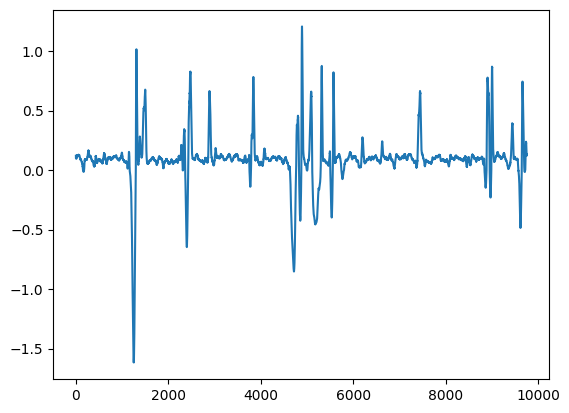

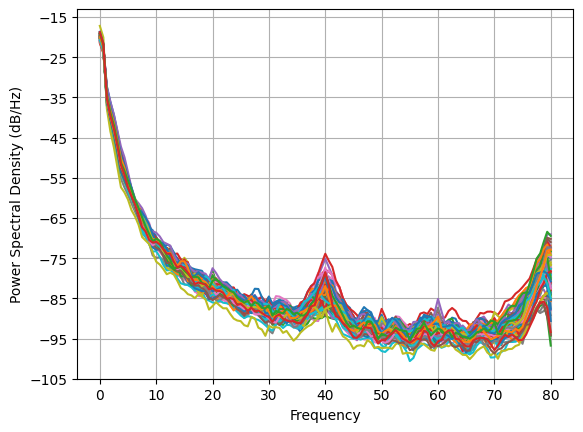

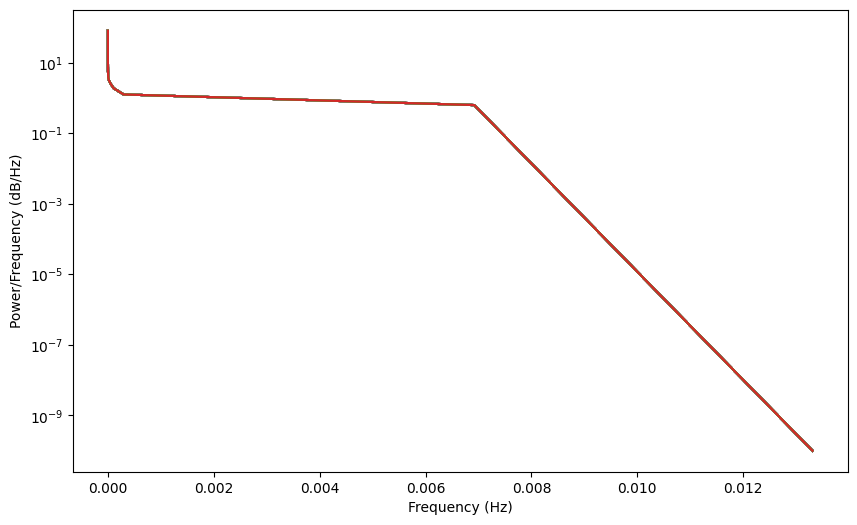

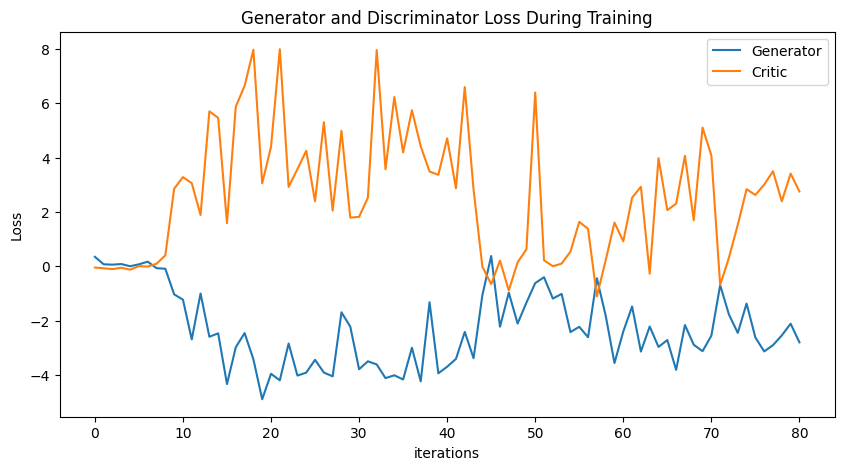

Epoch 85: Critic error ([0.34816815142693824, 0.0725849427110232, 0.05908038521892264, 0.08173304076924384, 0.0012023824414965356, 0.0712293521898193, 0.1695569522696529, -0.06934927782467083, -0.09109356308945349, -1.0329508357702741, -1.2285317565862484, -2.689983775686423, -1.0016378462046194, -2.5921731417155307, -2.4654225443315725, -4.332629065967956, -2.977178648894013, -2.457125965789416, -3.422531351741843, -4.889527811031852, -3.954601805175335, -4.19422565417983, -2.8395864495438525, -4.0198870510904, -3.910402845806144, -3.4411855095916906, -3.9074198268989884, -4.049442775963653, -1.6939420324315624, -2.2191061275307202, -3.7872512623641192, -3.4951907185950564, -3.610060783624543, -4.11334874868314, -4.009296212102134, -4.164188059041723, -2.9965626420529623, -4.23423737426751, -1.3237142519481055, -3.937069341978334, -3.6937664979514406, -3.406799054862675, -2.4150964392949525, -3.381134104148988, -1.0623691052203537, 0.37681320427805254, -2.2231712594159454, -0.97141835

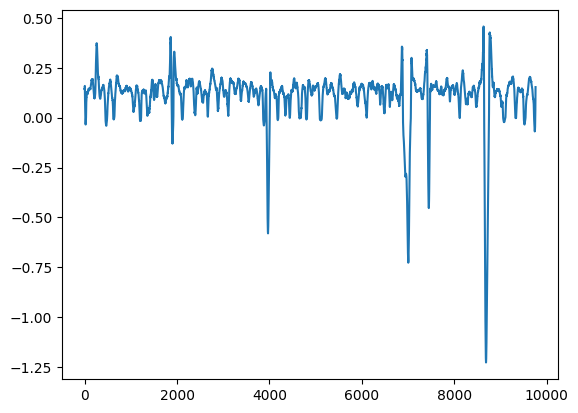

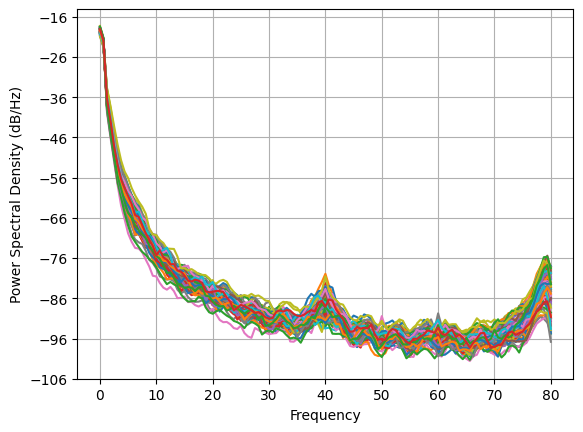

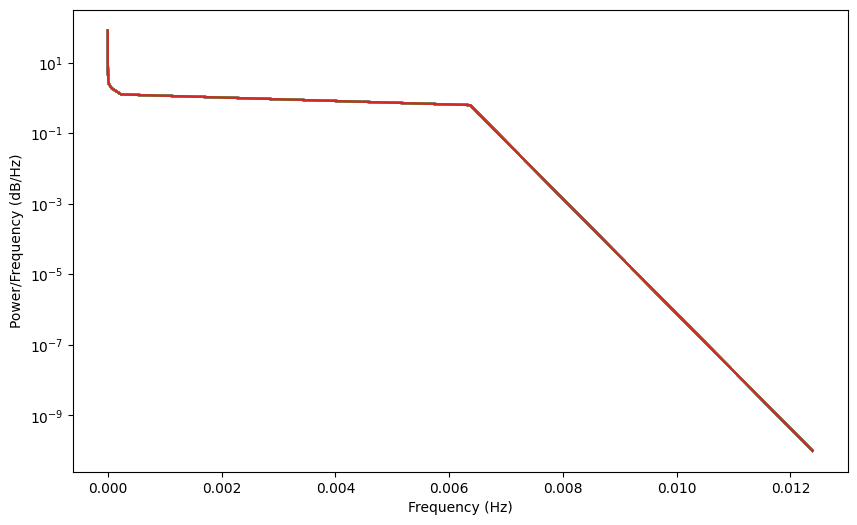

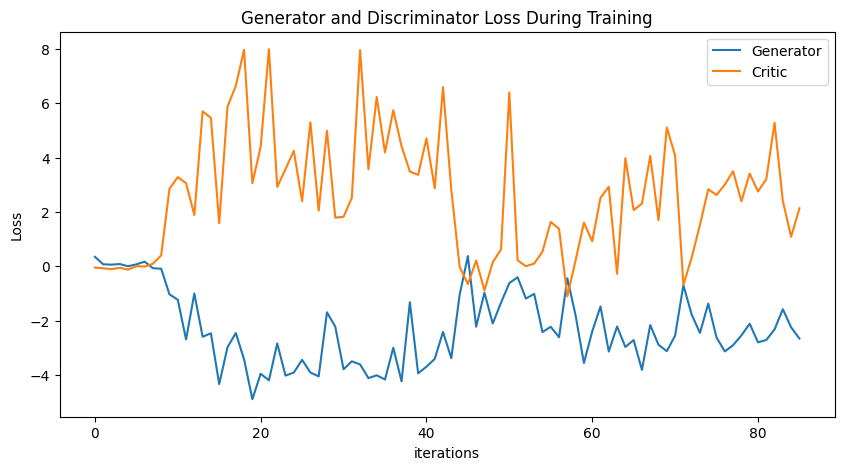

Epoch 90: Critic error ([0.34816815142693824, 0.0725849427110232, 0.05908038521892264, 0.08173304076924384, 0.0012023824414965356, 0.0712293521898193, 0.1695569522696529, -0.06934927782467083, -0.09109356308945349, -1.0329508357702741, -1.2285317565862484, -2.689983775686423, -1.0016378462046194, -2.5921731417155307, -2.4654225443315725, -4.332629065967956, -2.977178648894013, -2.457125965789416, -3.422531351741843, -4.889527811031852, -3.954601805175335, -4.19422565417983, -2.8395864495438525, -4.0198870510904, -3.910402845806144, -3.4411855095916906, -3.9074198268989884, -4.049442775963653, -1.6939420324315624, -2.2191061275307202, -3.7872512623641192, -3.4951907185950564, -3.610060783624543, -4.11334874868314, -4.009296212102134, -4.164188059041723, -2.9965626420529623, -4.23423737426751, -1.3237142519481055, -3.937069341978334, -3.6937664979514406, -3.406799054862675, -2.4150964392949525, -3.381134104148988, -1.0623691052203537, 0.37681320427805254, -2.2231712594159454, -0.97141835

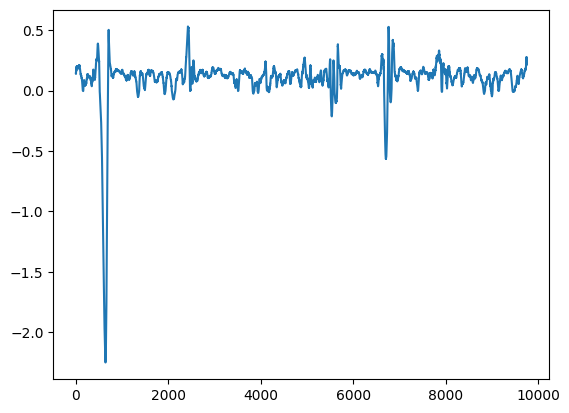

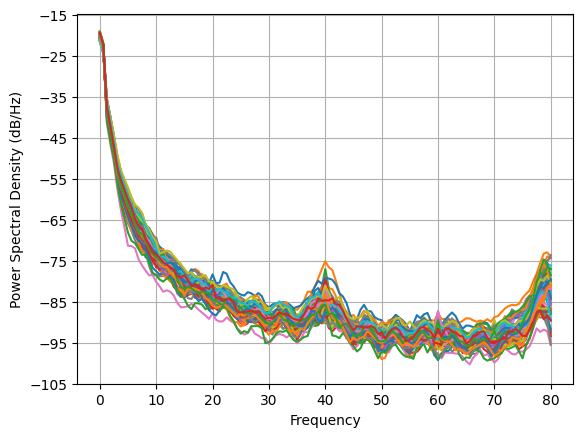

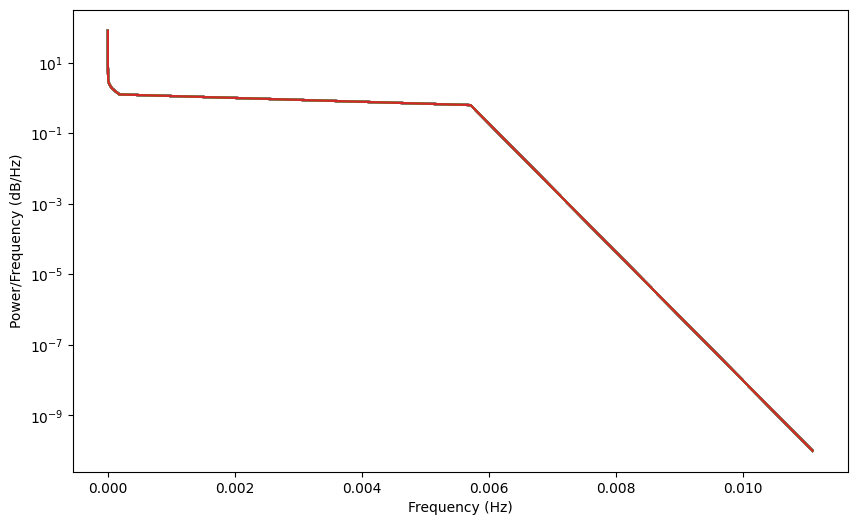

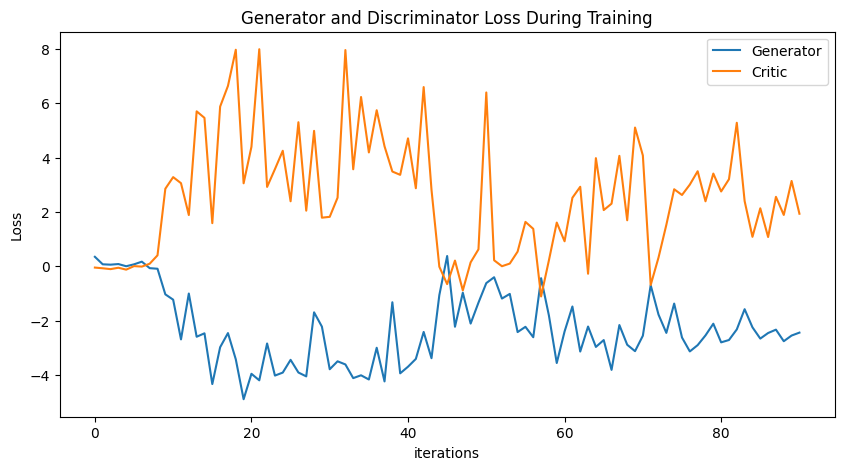

Epoch 95: Critic error ([0.34816815142693824, 0.0725849427110232, 0.05908038521892264, 0.08173304076924384, 0.0012023824414965356, 0.0712293521898193, 0.1695569522696529, -0.06934927782467083, -0.09109356308945349, -1.0329508357702741, -1.2285317565862484, -2.689983775686423, -1.0016378462046194, -2.5921731417155307, -2.4654225443315725, -4.332629065967956, -2.977178648894013, -2.457125965789416, -3.422531351741843, -4.889527811031852, -3.954601805175335, -4.19422565417983, -2.8395864495438525, -4.0198870510904, -3.910402845806144, -3.4411855095916906, -3.9074198268989884, -4.049442775963653, -1.6939420324315624, -2.2191061275307202, -3.7872512623641192, -3.4951907185950564, -3.610060783624543, -4.11334874868314, -4.009296212102134, -4.164188059041723, -2.9965626420529623, -4.23423737426751, -1.3237142519481055, -3.937069341978334, -3.6937664979514406, -3.406799054862675, -2.4150964392949525, -3.381134104148988, -1.0623691052203537, 0.37681320427805254, -2.2231712594159454, -0.97141835

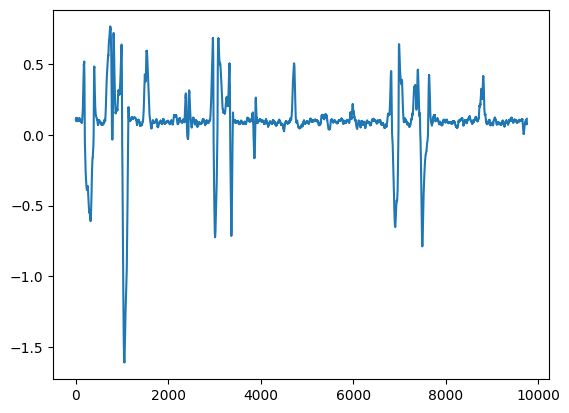

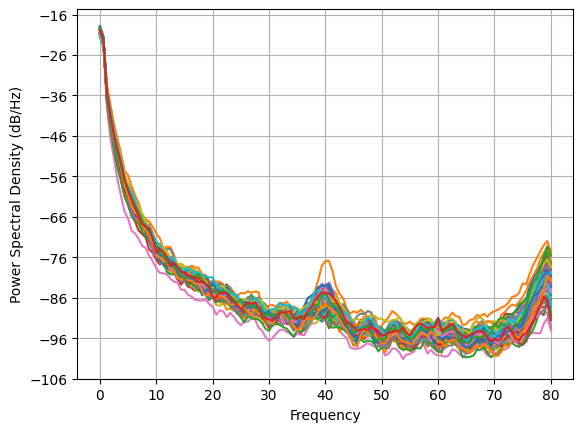

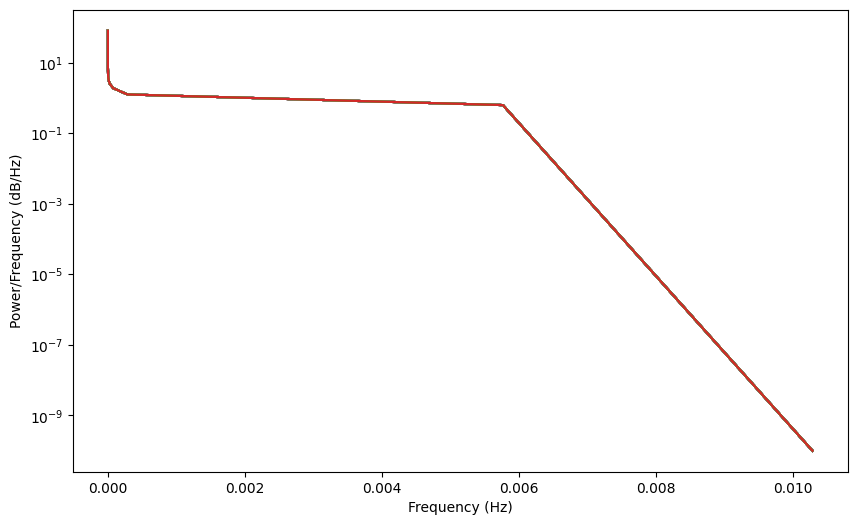

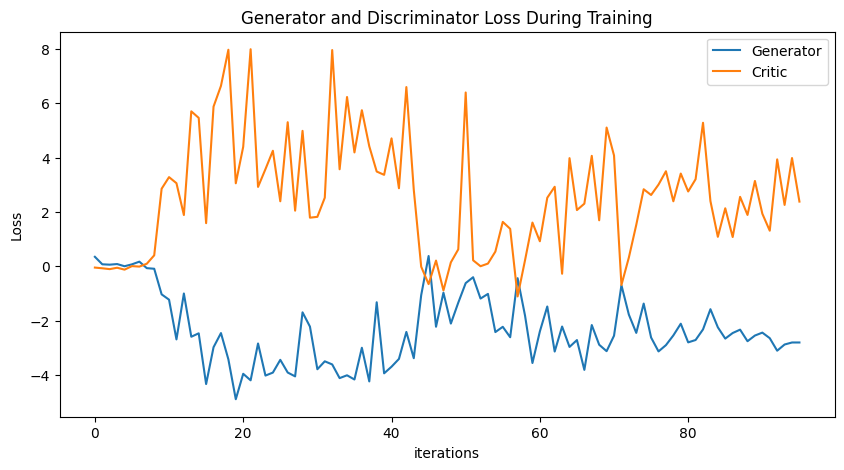

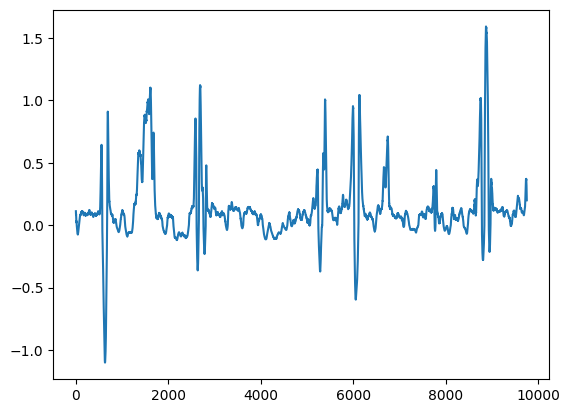

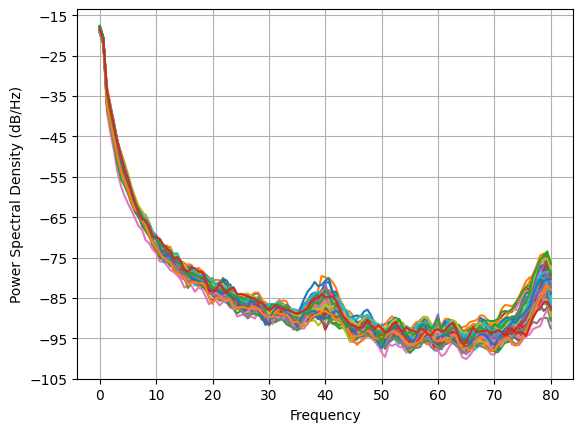

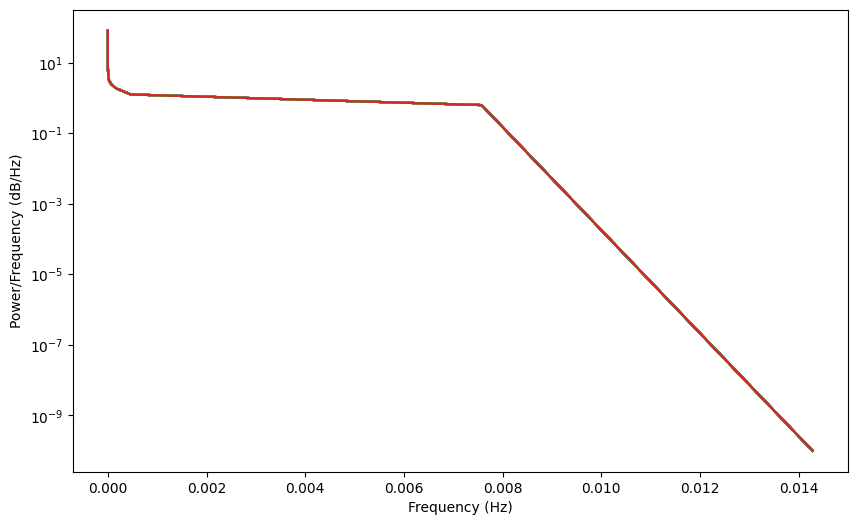

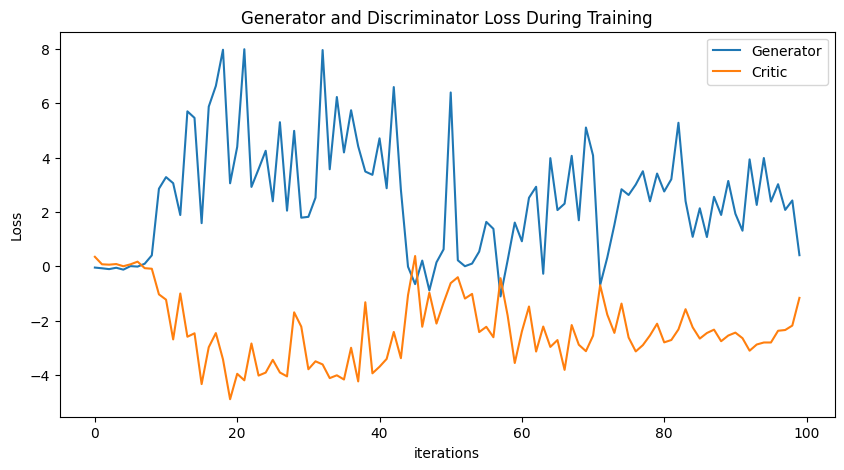

In [7]:
NUM_EPOCHS = 100
PRINT_INTERVAL = 5
training_data = torch.tensor(np.load('training_open.npy'))
BATCH_SIZE = np.shape(training_data)[0]

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(320, 320, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(320, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(320, 320, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(320, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(320, 320, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(320, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(320, 320, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(320, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(320, 320, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(320, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(320, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 320, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(320, 320, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(320, 320, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(320, 320, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(320, 320, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(320, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for _ in range(5):
            real = training_data.clone().detach()
            real.requires_grad=True
            critic_real = D(real).reshape(-1)
            loss_critic_real = -torch.mean(critic_real)
            noise = sample_normal_distribution(BATCH_SIZE, 320, 305)
            fake = G(noise)
            critic_fake = D(fake).reshape(-1)
            loss_critic_fake = torch.mean(critic_fake)
            gp = gradient_penalty(D, real, fake) * LAMBDA_GP
            D.zero_grad()
            loss_critic = loss_critic_real + loss_critic_fake + gp
            loss_critic.backward()
            critic_optimizer.step()  

        noise = sample_normal_distribution(BATCH_SIZE, 320, 305)
        fake = G(noise)
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()
        
        critic_err.append(loss_critic.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(fake, critic_err, gen_err)

    return critic_err, gen_err, fake, D, G

critic_err, gen_err, generated_data_open, disc, gen = train()

torch.save(gen, 'generator2_eyes_open.pt')
torch.save(disc, 'discriminator2_eyes_open.pt')
np.save('320channels-open.npy', generated_data_open.detach())
plot_everything(generated_data_open, gen_err, critic_err)
generated_data_open = None